In [1]:
# Import all essential libraries

import os
import csv
# import ipdb
import math
import warnings
import random
import numpy as np
import networkx as nx
import scipy.constants as sc
import matplotlib.pyplot as plt
import networkx.algorithms.isomorphism as iso
# %matplotlib qt
from IPython.core.debugger import Pdb
ipdb = Pdb()

In [2]:
def plot_fig(G, title=""):
    A = nx.adjacency_matrix(G)
    pos = nx.spring_layout(G)
    nodes = list(nx.nodes(G))
    mapping = {}
    for i,j in enumerate(nodes):
        mapping[j] = i
        
    plt.figure()
    if title: plt.title(title)
    for i in G.edges():
        G[i[0]][i[1]][0]['number'] = A[mapping[i[0]], mapping[i[1]]]
    labels = nx.get_edge_attributes(G, 'number')
    edge_labels = {}
    for i in labels:
        edge_labels[(i[0], i[1])] = labels[i]
    nx.draw(G, pos, with_labels=True,edge_color='black',width=1,linewidths=1,node_size = 500,node_color='pink',alpha=0.9)
    nx.draw_networkx_edge_labels(G, pos, edge_labels = edge_labels)
    # plt.axis('off')
    plt.show()

In [3]:
class Compound():
    def __init__(self, name, number):
        self._name = name + " " + str(number)
        self._number = number
        self._valency = self.get_max_valency()

    def get_max_valency(self):
        name = self._name.split()[0]
        if name == "H":
            return 1
        elif name == "C":
            return 4
        elif name == "N":
            return 3
        elif name == "O":
            return 2
        elif name == "S":
            return 2

    def current_valency(self, G):
        neig = nx.degree(G, self)
        max_val = self.get_max_valency()
        if neig > max_val:
            ipdb.set_trace()
            raise ValueError('Compound has more neighbours than valence')
        else:
            # print(max_val, neig)
            self._valency = max_val - neig
        
    def get_total_valency(self, G):
        neig = nx.degree(G, self)
        free_electrons = self.get_max_valency() - neig
        return free_electrons
        
        
    def __repr__(self):
        return self._name

In [4]:
# Function to update the valencies of the atoms
# This function updates the atom valencies based 
# on the number of edges that atom forms.

def fix_valencies(G):
    for node in nx.nodes(G):
        degree = len(G[node])
        if degree > 0:
            node.current_valency(G)

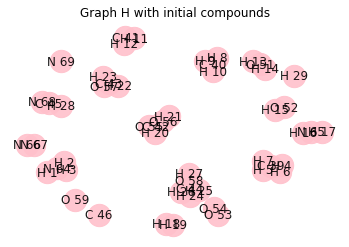

{<networkx.classes.multigraph.MultiGraph object at 0x0000019F800D2688>: -185.9402151, <networkx.classes.multigraph.MultiGraph object at 0x0000019FFEC95848>: -213.1921923, <networkx.classes.multigraph.MultiGraph object at 0x0000019F800A7B88>: 2.651927862, <networkx.classes.multigraph.MultiGraph object at 0x0000019F800A7B48>: 247.7699191, <networkx.classes.multigraph.MultiGraph object at 0x0000019F800B41C8>: -380.6041595, <networkx.classes.multigraph.MultiGraph object at 0x0000019F80073FC8>: -97.3578968, <networkx.classes.multigraph.MultiGraph object at 0x0000019F800B3E88>: 43.5280415, <networkx.classes.multigraph.MultiGraph object at 0x0000019F801336C8>: -97.16928744, <networkx.classes.multigraph.MultiGraph object at 0x0000019F80121508>: -563.5848, <networkx.classes.multigraph.MultiGraph object at 0x0000019F80121FC8>: -269.5222798, <networkx.classes.multigraph.MultiGraph object at 0x0000019F80121A48>: -379.0914382, <networkx.classes.multigraph.MultiGraph object at 0x0000019F80121E88>: -

In [5]:
H = nx.MultiGraph()

H_lists = [Compound("H",i) for i in range(1,30)]
C_lists = [Compound("C",i) for i in range(39, 47)]
O_lists = [Compound("O",i) for i in range(51, 60)]
N_lists = [Compound("N",i) for i in range(64, 70)]
for i,lst in enumerate([H_lists, C_lists, O_lists, N_lists]):
    for comp in lst:
        H.add_node(comp, data=comp)

# nx.draw(H,with_labels=True)
H.add_edges_from([(H_lists[0], N_lists[0]), (N_lists[0], H_lists[1]), (N_lists[0], H_lists[2])])
H.add_edges_from([(H_lists[3], C_lists[0]), (H_lists[4], C_lists[0]), (H_lists[5], C_lists[0]), (H_lists[6], C_lists[0])])
H.add_edges_from([(H_lists[7], C_lists[1]), (H_lists[8], C_lists[1]), (H_lists[9], C_lists[1])])
H.add_edges_from([(H_lists[10], C_lists[2]), (H_lists[11], C_lists[2])])
H.add_edges_from([(H_lists[12], O_lists[0]), (H_lists[13], O_lists[0])])
H.add_edges_from([(H_lists[14], O_lists[1])])
H.add_edges_from([(H_lists[15], N_lists[1]), (N_lists[1], H_lists[16])])
H.add_edges_from([(H_lists[17], H_lists[18])])
H.add_edges_from([(O_lists[2], O_lists[3])])
H.add_edges_from([(N_lists[2], N_lists[3]), (N_lists[2], N_lists[3]), (N_lists[2], N_lists[3])])
H.add_edges_from([(H_lists[19], C_lists[3]),(O_lists[4], C_lists[3]),(O_lists[4], C_lists[3]),(O_lists[5], C_lists[3]),(H_lists[20], O_lists[5])])
H.add_edges_from([(H_lists[21], C_lists[4]),(O_lists[6], C_lists[4]),(O_lists[6], C_lists[4]),(H_lists[22], C_lists[4])])
H.add_edges_from([(H_lists[23], C_lists[5]), (H_lists[24], C_lists[5]), (H_lists[25], C_lists[5]),(O_lists[7], C_lists[5]),(O_lists[7], H_lists[26])])
H.add_edges_from([(H_lists[27], C_lists[6]), (N_lists[4], C_lists[6]), (N_lists[4], C_lists[6]), (N_lists[4], C_lists[6])])
# H.add_edges_from([(H_lists[28], N_lists[5]), (N_lists[5], H_lists[29]), (N_lists[5], C_lists[7]), (H_lists[30], C_lists[7]), (C_lists[7], H_lists[31]), (C_lists[7], C_lists[8]), (O_lists[8], C_lists[8]),(O_lists[8], C_lists[8]),(O_lists[9], C_lists[8]),(H_lists[32], O_lists[9])])
# H.add_edges_from([(H_lists[33], N_lists[6]), (N_lists[6], H_lists[34]), (N_lists[6], C_lists[9]), (H_lists[35], C_lists[9]), (C_lists[9], H_lists[36]), (C_lists[9], C_lists[10]), (O_lists[10], C_lists[10]),(O_lists[10], C_lists[10]),(O_lists[11], C_lists[10])])

plot_fig(H, "Graph H with initial compounds")

data_G = {}
G_value = [-185.9402151,-213.1921923,2.651927862,247.7699191,-380.6041595,-97.3578968,43.5280415,-97.16928744,-563.5848,-269.5222798,-379.0914382,-16.77210243,133.6241442,736.5926058,-149.516614,132.4236,-139.8716185,361.0634601]

entities = nx.connected_components(H)
entities = list(entities)
for i in range(len(entities)):
#     print(i)
    sub = H.subgraph(list(entities[i]))
    data_G[sub] = G_value[i]
#     plot_fig(sub, G_value[i])
fix_valencies(H)    
print(data_G)

#A is CH2O and B is NH3
A = H.subgraph(list(entities[9]))
B = H.subgraph(list(entities[0]))

In [6]:
# Finding G of all components given a network
def input_G(G):
    
    cc = list(nx.connected_components(G))
    G_energy = 0
    
    for i in range(len(cc)):
        found = 0
        
        # print("Connected Component G:", cc[i])
        sub_G = G.subgraph(list(cc[i]))
        same = False
        
        for j in data_G:
            # print(j.nodes)
            GH = iso.GraphMatcher(sub_G,j)
            
            # print("Isomorphic:", GH.is_isomorphic())
            if GH.is_isomorphic() == True:
                same = True
            else:
                same = False
            
            if same == True:
                if len(GH.mapping) != 2:
                    for k in GH.mapping: # check mapping of each nodes
                        # print(str(k)[0])
                        # print(str(GH.mapping[k])[0])
                        if str(k)[0] == str(GH.mapping[k])[0]: # Each node's label (without index) should coincide
                            same = True
                        else:
                            same = False
                            break
                else:
                    keys = []
                    values = []
                    for i in GH.mapping.keys():
                        keys.append(str(i).split()[0])
                    for i in GH.mapping.keys():
                        values.append(str(i).split()[0])
                    keys = keys.sort()
                    values = values.sort()
                    if keys == values:
                        same = True
                    else: 
                        same = False
                        
                # print(same)
                
            if same == True: # If compound is found, add G
                found = 1
                break

        if same == True:
            G_energy += data_G[j]
            
        elif same == False: # If compound not found,
            randomp = G.subgraph(list(cc[i]))
            plot_fig(randomp)
            
            val = float(input('Enter G value of %s: '%list(cc[i])))
            data_G[sub_G] = val # Add the new compound's data to our dictionary
            G_energy += val
            # print(G_energy)
    return G_energy

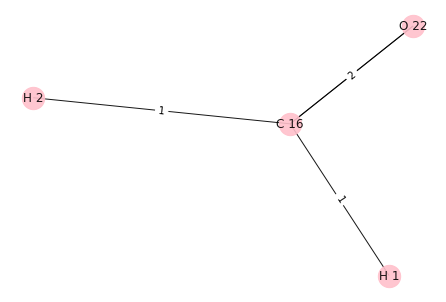

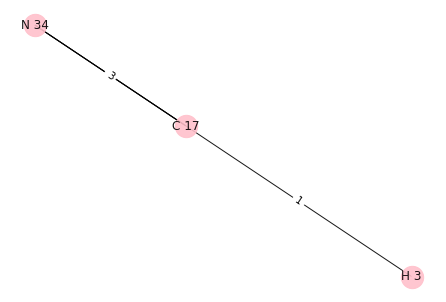

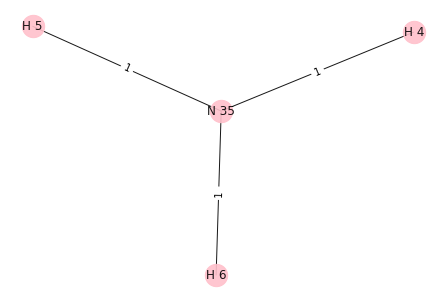

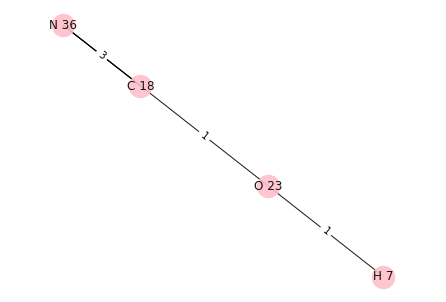

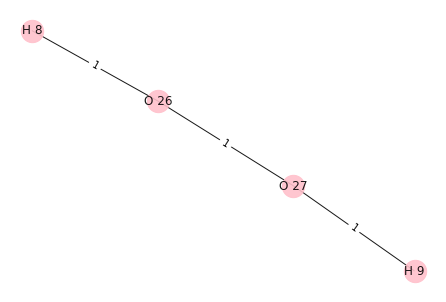

...

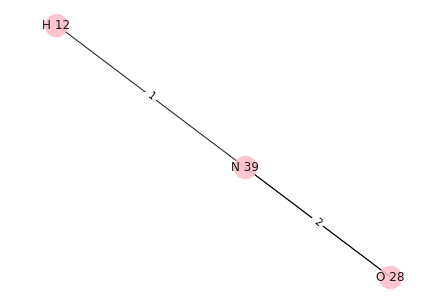

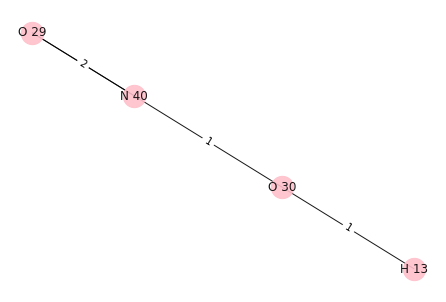

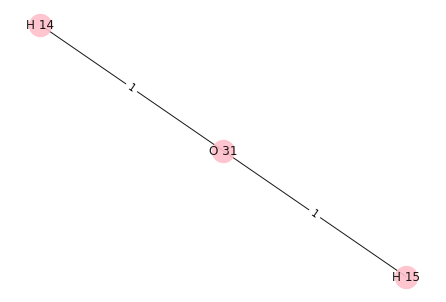

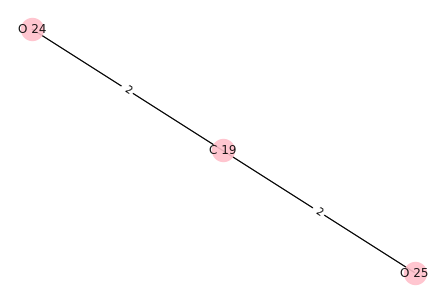

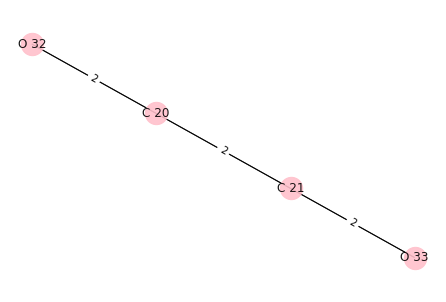

In [7]:
#Compounds of size = 3/4

N = nx.MultiGraph()

H_list_n = [Compound("H",i) for i in range(1,16)]
C_list_n = [Compound("C",i) for i in range(16, 22)]
O_list_n = [Compound("O",i) for i in range(22, 34)]
N_list_n = [Compound("N",i) for i in range(34, 41)]
for i,lst in enumerate([H_list_n, C_list_n, O_list_n, N_list_n]):
    for comp in lst:
        N.add_node(comp, data=comp)
#CH2O        
N.add_edges_from([(H_list_n[0], C_list_n[0]), (H_list_n[1], C_list_n[0]), (O_list_n[0], C_list_n[0]), (O_list_n[0], C_list_n[0])])
#HCN
N.add_edges_from([(C_list_n[1], H_list_n[2]), (C_list_n[1], N_list_n[0]), (C_list_n[1], N_list_n[0]), (C_list_n[1], N_list_n[0])])
#NH3
N.add_edges_from([(H_list_n[3], N_list_n[1]), (N_list_n[1], H_list_n[4]), (N_list_n[1], H_list_n[5])])
#CNOH
N.add_edges_from([(C_list_n[2], N_list_n[2]), (C_list_n[2], N_list_n[2]), (C_list_n[2], N_list_n[2]), (C_list_n[2], O_list_n[1]), (O_list_n[1], H_list_n[6])])
#CO2
N.add_edges_from([(O_list_n[2], C_list_n[3]), (O_list_n[2], C_list_n[3]), (O_list_n[3], C_list_n[3]), (O_list_n[3], C_list_n[3])])
#H2O2
N.add_edges_from([(O_list_n[4], H_list_n[7]), (O_list_n[4], O_list_n[5]), (O_list_n[5], H_list_n[8])])
#N2H2
N.add_edges_from([(H_list_n[9], N_list_n[3]), (N_list_n[3], N_list_n[4]), (N_list_n[3], N_list_n[4]), (H_list_n[10], N_list_n[4])])
#HNO
N.add_edges_from([(H_list_n[11], N_list_n[5]), (O_list_n[6], N_list_n[5]), (O_list_n[6], N_list_n[5])])
#HNO2
N.add_edges_from([(O_list_n[7], N_list_n[6]), (O_list_n[7], N_list_n[6]), (O_list_n[8], N_list_n[6]), (O_list_n[8], H_list_n[12])])
#H2O
N.add_edges_from([(H_list_n[13], O_list_n[9]), (H_list_n[14], O_list_n[9])])
#C2O2
N.add_edges_from([(O_list_n[10], C_list_n[4]), (O_list_n[10], C_list_n[4]), (C_list_n[4], C_list_n[5]), (C_list_n[5], C_list_n[4]), (O_list_n[11], C_list_n[5]), (O_list_n[11], C_list_n[5])])

fix_valencies(N)
for i in nx.connected_components(N):
    plot_fig(N.subgraph(list(i)))

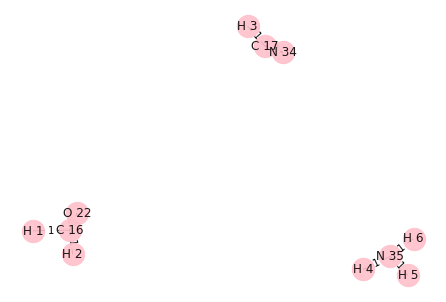

In [8]:
G = N.copy()
connected_components = list(nx.connected_components(G))
mol1 = G.subgraph(connected_components[0])
mol2 = G.subgraph(connected_components[1])
mol3 = G.subgraph(connected_components[2])

G_new = nx.MultiGraph()
nodes = []
edges = {}
for i in [mol1, mol2, mol3]:
    nodes.extend(nx.nodes(i))
    edg_data = nx.get_edge_attributes(i, 'number')
    for i in edg_data:
        edges[i] = edg_data[i]

for i in nodes:
    G_new.add_nodes_from(nodes)
for i in edges:
    for j in range(edges[i]):
        G_new.add_edge(i[0], i[1])
        
plot_fig(G_new)

In [9]:
def form_bonds(G_param, order):
    M = G_param.copy()
    M_dict = {}
    max_size = 11
    connected_components = list(nx.connected_components(M))
    n = len(connected_components)
    print(n)
    print(connected_components)
    print(connected_components[0])
    print(connected_components[1])
    print(len(connected_components[0]) + len(connected_components[1]))
    
    while n >= 2:
        if (len(connected_components[0]) + len(connected_components[1])) > max_size:
            if len(connected_components[0]) >= len(connected_components[1]):
                connected_components = connected_components[1:]
            else:
                connected_components.pop(1)
        else:
            mol1 = M.subgraph(list(connected_components[0]))
            mol2 = M.subgraph(list(connected_components[1]))

            plot_fig(mol1)
            plot_fig(mol2)

            H_list1 = [i for i in nx.nodes(mol1) if i._name.split()[0] == "H"]
            H_list2 = [i for i in nx.nodes(mol2) if i._name.split()[0] == "H"]

            flag = 1
            flag1 = 1
            flag2 = 1
            if len(H_list1) > 1:
                H_to_be_removed1 = H_list1[random.randint(0, len(H_list1)-1)]
            elif len(H_list1) == 1:
                H_to_be_removed1 = H_list1[0]
            else:
                flag1 = 0

            if len(H_list2) > 1:
                H_to_be_removed2 = H_list2[random.randint(0, len(H_list2)-1)]
            elif len(H_list2) == 1:
                H_to_be_removed2 = H_list2[0]
            else:
                flag2 = 0

            flag = flag1*flag2
            if flag:
                print(H_to_be_removed1)
                print(H_to_be_removed2)
                neigh1 = [i for i in mol1[H_to_be_removed1]][0]
                neigh2 = [i for i in mol2[H_to_be_removed2]][0]

                print(neigh1, neigh2)
                M.remove_edge(H_to_be_removed1, neigh1)
                M.remove_edge(H_to_be_removed2, neigh2)
                M.add_edge(neigh1, neigh2)

                fix_valencies(M)
                plot_fig(M.subgraph(list(nx.node_connected_component(M, neigh1))))
                non_H_nodes = []
                print(nx.node_connected_component(M, neigh1))
                for i in nx.node_connected_component(M, neigh1):
                    if (i._name.split()[0]!="H"):
                        non_H_nodes.append(i)
                non_H_nodes = list(set(non_H_nodes))

                print(non_H_nodes)
                for i in range(len(non_H_nodes)):
                    M_new = M.subgraph(list(nx.node_connected_component(M, neigh1))).copy()
                    print("i:", i)
                    temp1 = list(M_new[non_H_nodes[i]].keys())
                    temp1 = [i for i in temp1 if i._name.split()[0]!="H"][0]
                    print("Removing edge between:", non_H_nodes[i], temp1)
                    M_new.remove_edge(non_H_nodes[i], temp1)
                    print("Adding edge between:", non_H_nodes[i], H_to_be_removed1)
                    M_new.add_edge(H_to_be_removed1, non_H_nodes[i])
                    fix_valencies(M_new)
                    for node in nx.node_connected_component(M_new, H_to_be_removed1):
                        print(node, node._valency)

                    plot_fig(M_new.subgraph(nx.node_connected_component(M_new, neigh1)))

                    for j in non_H_nodes:
                        print(j._name, j._valency)
                    second_node = [j for j in non_H_nodes if j._valency!=0]
                    print(second_node, H_to_be_removed2)
                    M_new.add_edge(H_to_be_removed2, second_node[0])
                    fix_valencies(M_new)
                    plot_fig(M_new.subgraph(nx.node_connected_component(M_new, H_to_be_removed2)))

                    M_dict[M_new.subgraph(nx.node_connected_component(M_new, neigh1))] = input_G(M_new.subgraph(nx.node_connected_component(M_new, neigh1)))

                connected_components = connected_components[2:]
                print(connected_components)
                n = len(connected_components)
            else:
                connected_components = connected_components[1:]
                print(connected_components)
                n = len(connected_components)

    return M_dict

In [10]:
def simulated_annealing_bonds(G, order=[]):
    connected_components = list(nx.connected_components(G))
    num_components = len(connected_components)
        
    # randomly permute the order in which the compounds react
    if order == []:
        order = np.random.permutation(num_components)
    else:
        order = np.random.permutation(order)
    
    dict_vals = form_bonds(G, order)
    
    return dict_vals

11
[{C 16, O 22, H 1, H 2}, {C 17, N 34, H 3}, {N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]
{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
7


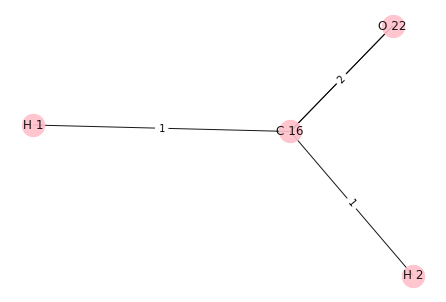

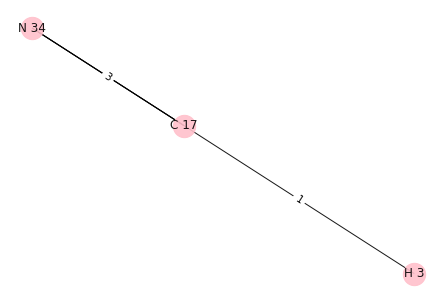

H 2
H 3
C 16 C 17


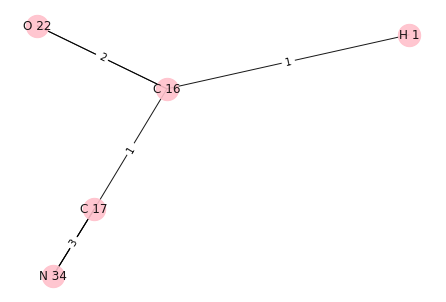

{C 17, O 22, H 1, C 16, N 34}
[C 17, N 34, O 22, C 16]
i: 0
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
H 2 0
O 22 0
H 1 0
C 17 0
N 34 1
C 16 0


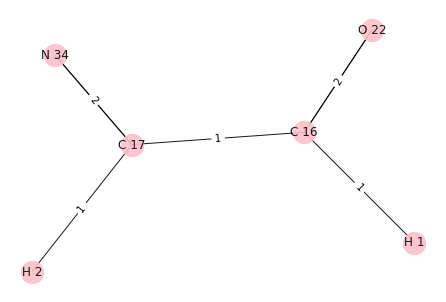

C 17 0
N 34 1
O 22 0
C 16 0
[N 34] H 3


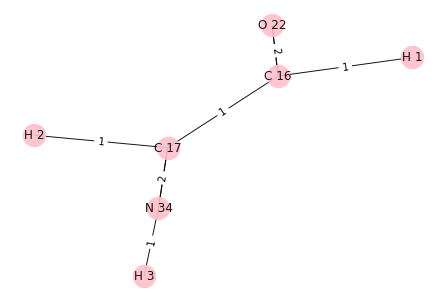

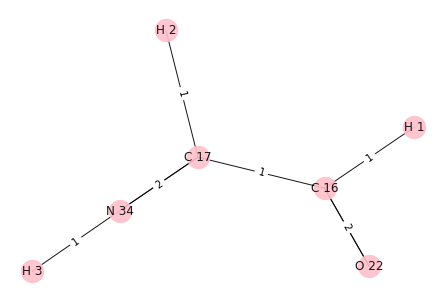

Enter G value of [C 17, O 22, H 2, H 1, H 3, C 16, N 34]: -7.380497132
i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
H 2 0
O 22 0
H 1 0
C 17 1
N 34 0
C 16 0


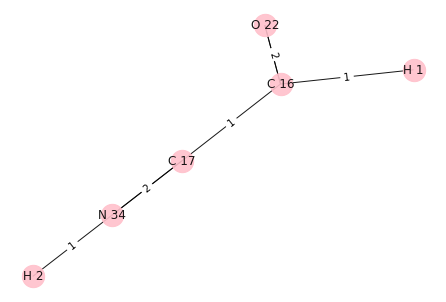

C 17 1
N 34 0
O 22 0
C 16 0
[C 17] H 3


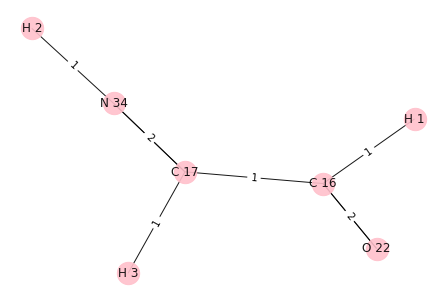

i: 2
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
N 34 0
O 22 0
H 2 0
C 17 0
H 1 0
C 16 1


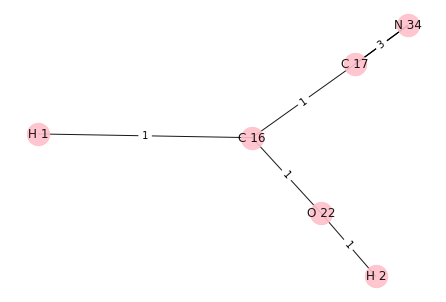

C 17 0
N 34 0
O 22 0
C 16 1
[C 16] H 3


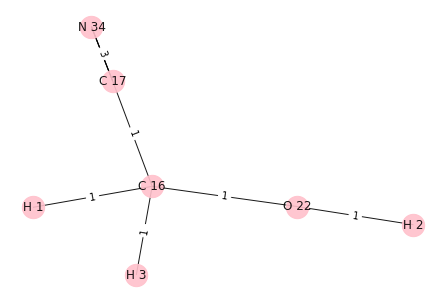

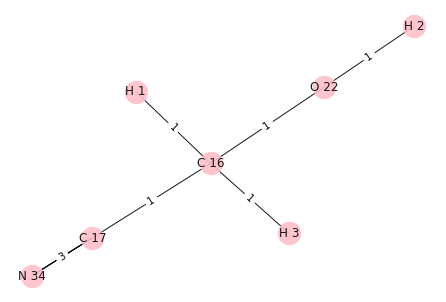

Enter G value of [C 17, N 34, O 22, H 2, H 3, C 16, H 1]: -261.5047571
i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
C 17 0
N 34 0
H 2 0
O 22 1
C 16 0
H 1 0


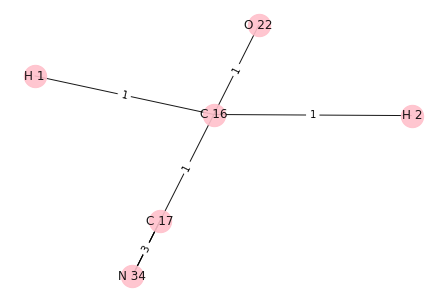

C 17 0
N 34 0
O 22 1
C 16 0
[O 22] H 3


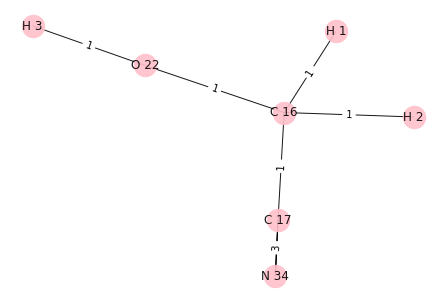

[{N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


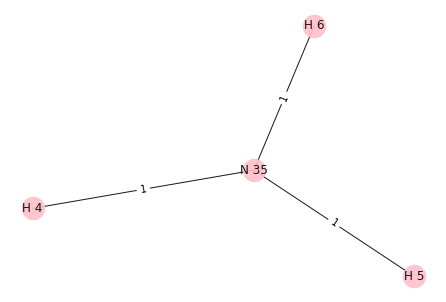

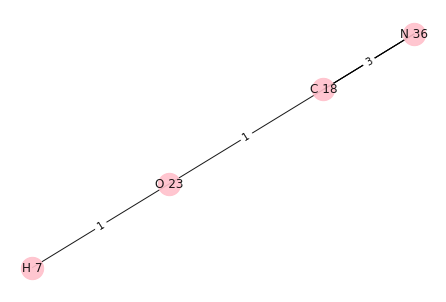

H 6
H 7
N 35 O 23


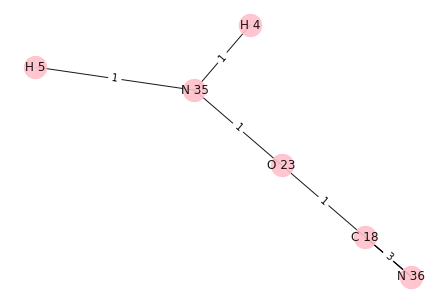

{O 23, H 4, C 18, H 5, N 36, N 35}
[O 23, C 18, N 36, N 35]
i: 0
Removing edge between: O 23 C 18
Adding edge between: O 23 H 6
O 23 0
H 4 0
H 5 0
N 35 0
H 6 0


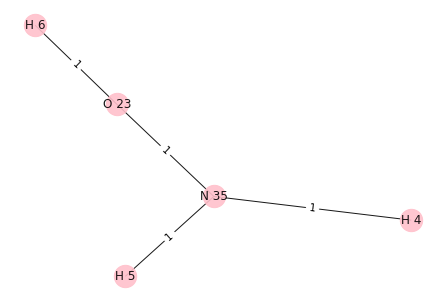

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


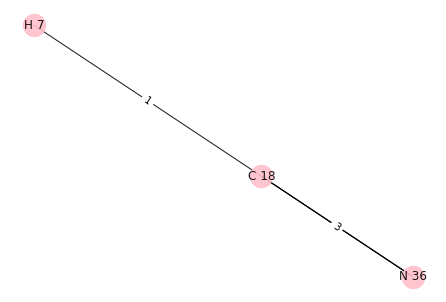

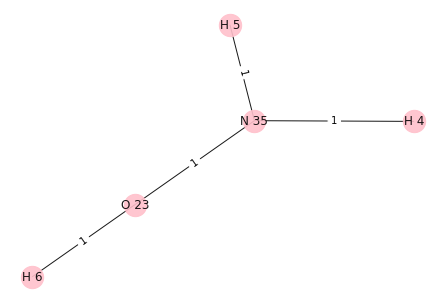

Enter G value of [O 23, H 4, H 5, N 35, H 6]: -215.860156
i: 1
Removing edge between: C 18 O 23
Adding edge between: C 18 H 6
H 6 0
C 18 0
N 36 0


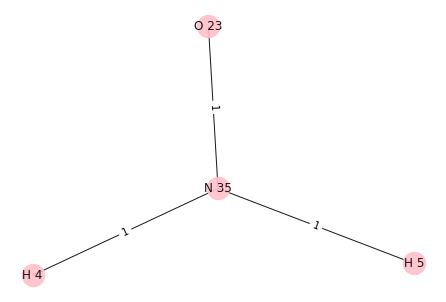

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


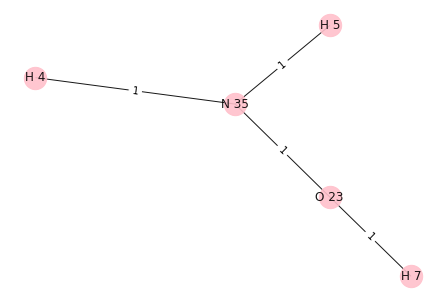

i: 2
Removing edge between: N 36 C 18
Adding edge between: N 36 H 6
O 23 0
H 4 0
C 18 1
N 36 0
N 35 0
H 5 0
H 6 0


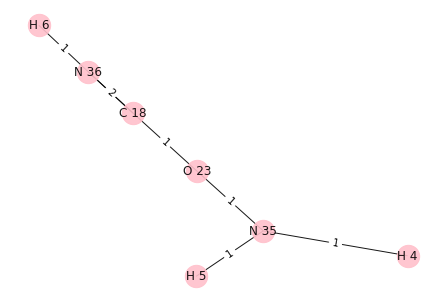

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


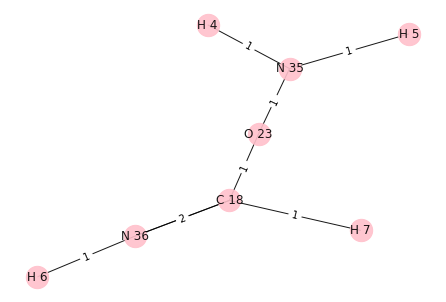

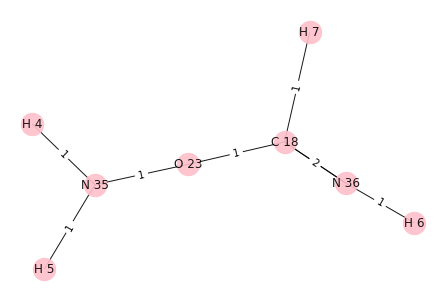

Enter G value of [O 23, H 7, H 4, H 6, C 18, N 36, H 5, N 35]: 100
i: 3
Removing edge between: N 35 O 23
Adding edge between: N 35 H 6
H 6 0
H 4 0
H 5 0
N 35 0


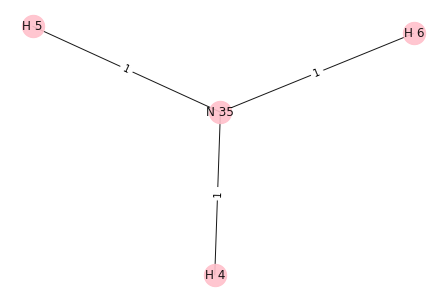

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


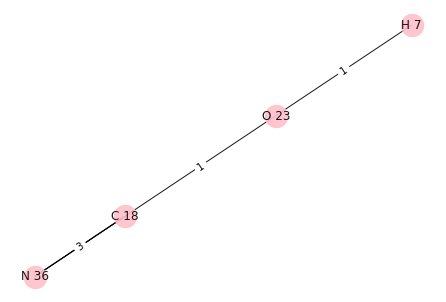

[{H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


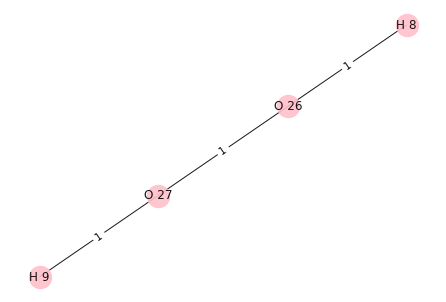

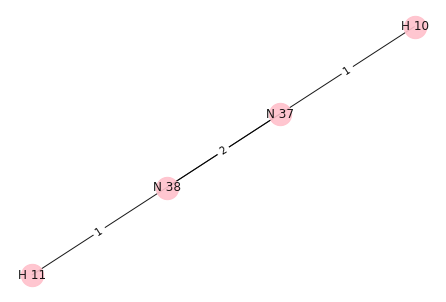

H 9
H 11
O 27 N 38


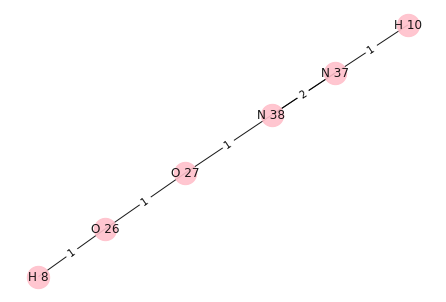

{O 26, N 38, H 8, O 27, H 10, N 37}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
H 9 0
H 8 0
O 26 0


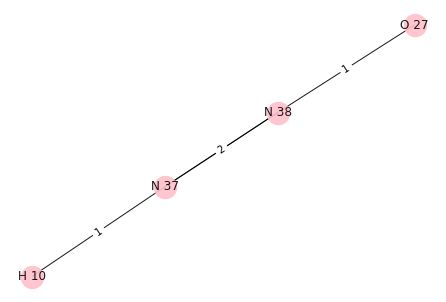

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 11


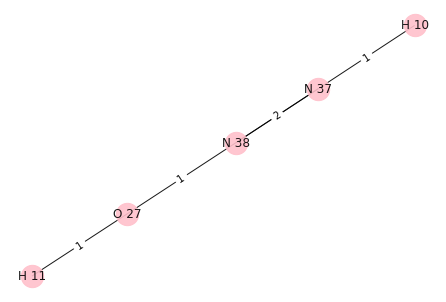

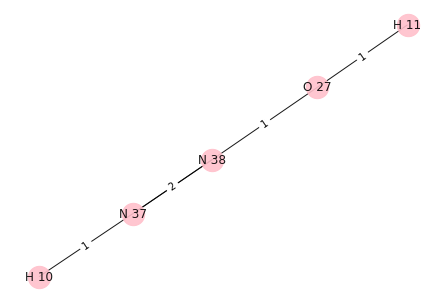

Enter G value of [N 38, O 27, H 10, N 37, H 11]: -107.61248
i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
N 38 0
H 8 0
O 27 0
H 9 0
H 10 0
N 37 1


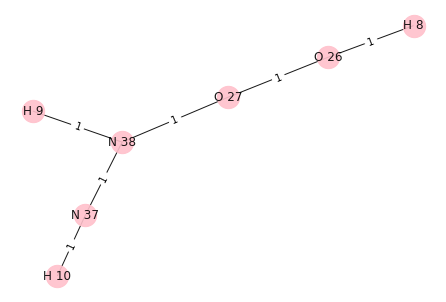

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 11


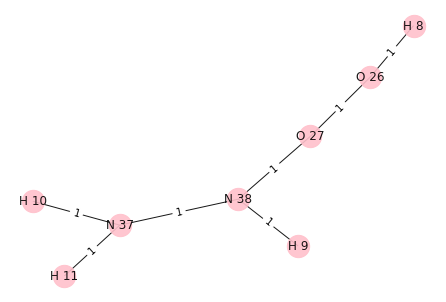

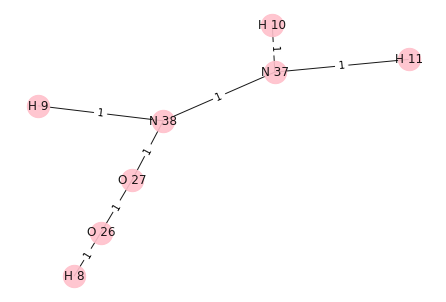

Enter G value of [O 26, H 8, N 38, O 27, H 9, H 10, N 37, H 11]: 100
i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
N 38 0
O 27 0
H 9 0
H 10 0
N 37 0


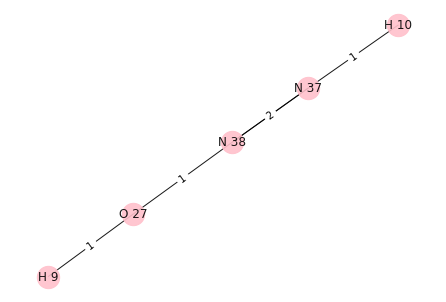

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 11


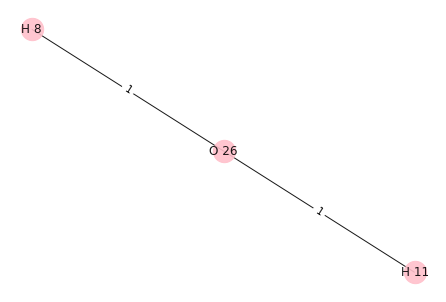

i: 3
Removing edge between: N 37 N 38
Adding edge between: N 37 H 9
O 26 0
N 38 1
H 8 0
O 27 0
H 9 0
H 10 0
N 37 0


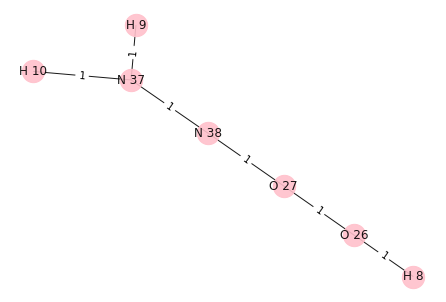

O 26 0
N 38 1
O 27 0
N 37 0
[N 38] H 11


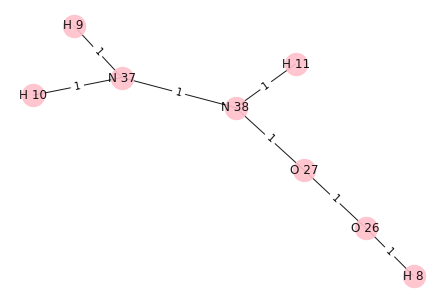

[{O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


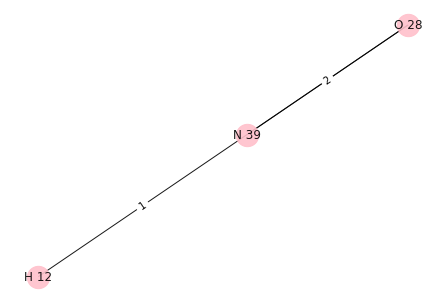

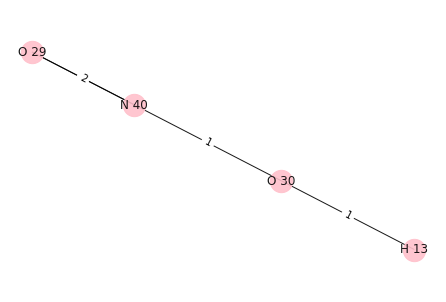

H 12
H 13
N 39 O 30


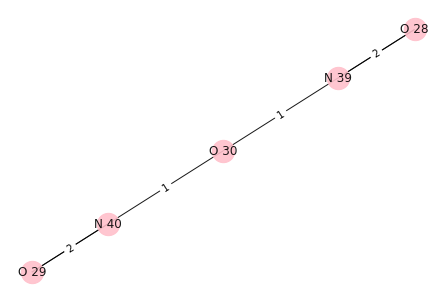

{O 30, N 40, O 28, N 39, O 29}
[O 30, N 40, N 39, O 28, O 29]
i: 0
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
H 12 0
O 30 0


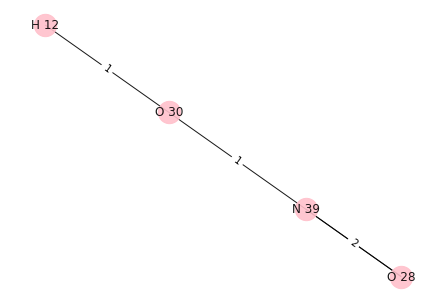

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


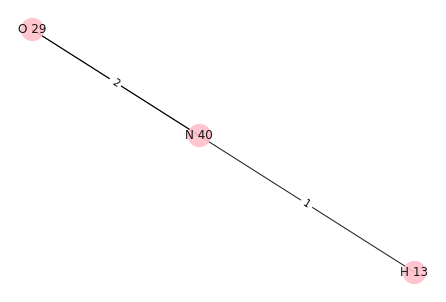

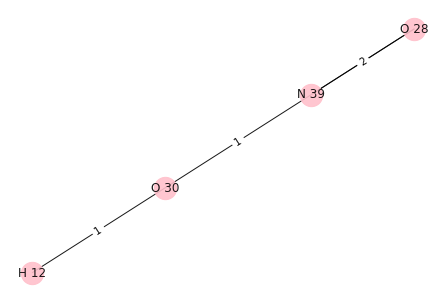

Enter G value of [O 28, O 30, N 39, H 12]: -266.6638947
i: 1
Removing edge between: N 40 O 30
Adding edge between: N 40 H 12
O 29 0
H 12 0
N 40 0


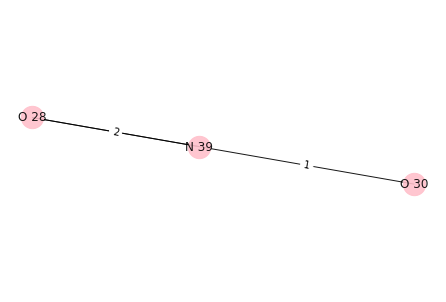

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


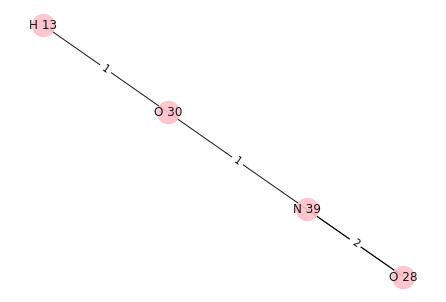

i: 2
Removing edge between: N 39 O 30
Adding edge between: N 39 H 12
O 28 0
H 12 0
N 39 0


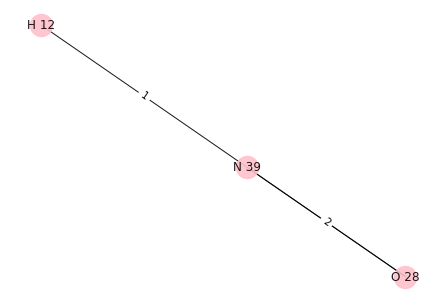

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


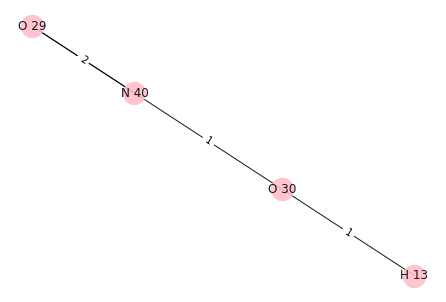

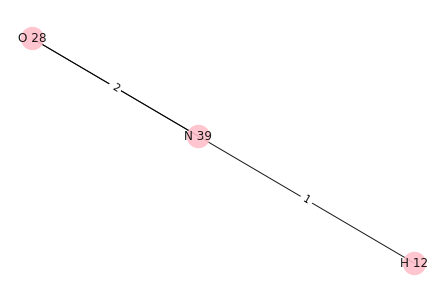

Enter G value of [O 28, N 39, H 12]: -55.64
i: 3
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
O 29 0
O 30 0
H 12 0
O 28 0
N 39 1
N 40 0


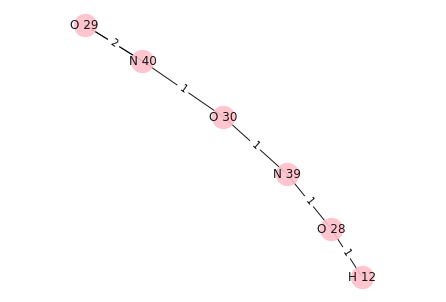

O 30 0
N 40 0
N 39 1
O 28 0
O 29 0
[N 39] H 13


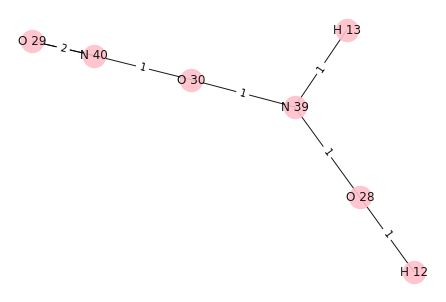

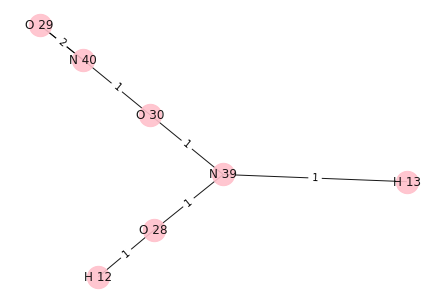

Enter G value of [O 30, H 12, N 40, H 13, N 39, O 28, O 29]: 100
i: 4
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
O 30 0
H 12 0
N 40 1
N 39 0
O 28 0
O 29 0


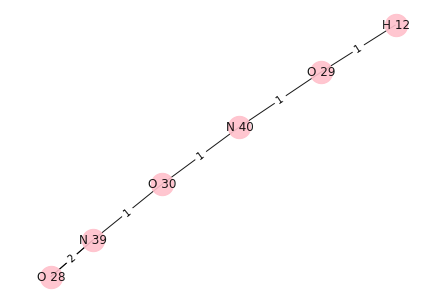

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


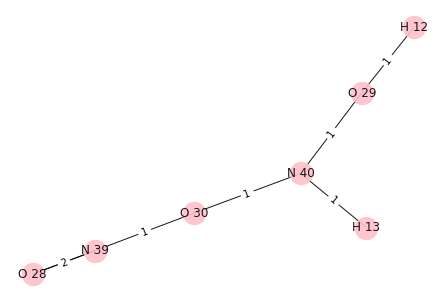

[{O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


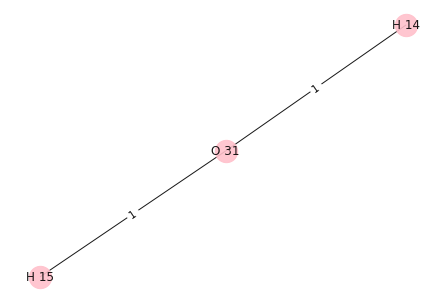

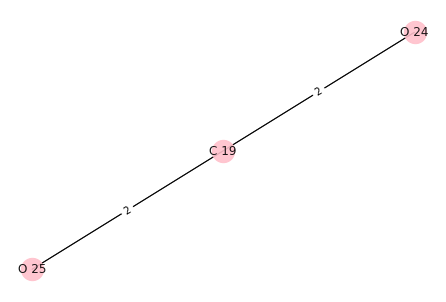

[{O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


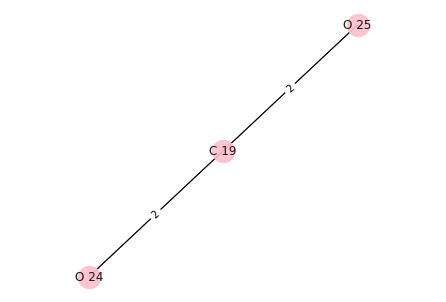

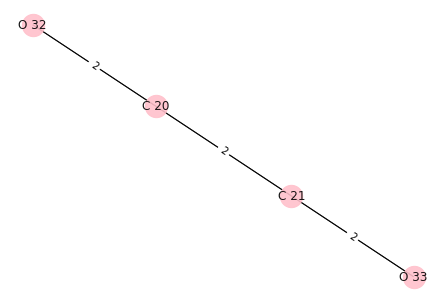

[{C 20, O 32, C 21, O 33}]
11
[{C 16, O 22, H 1, H 2}, {C 17, N 34, H 3}, {N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]
{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
7


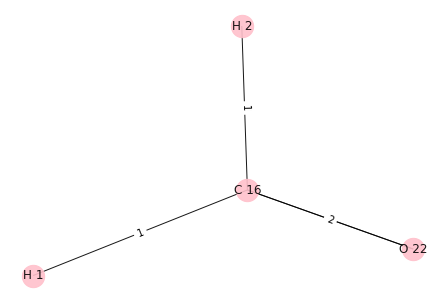

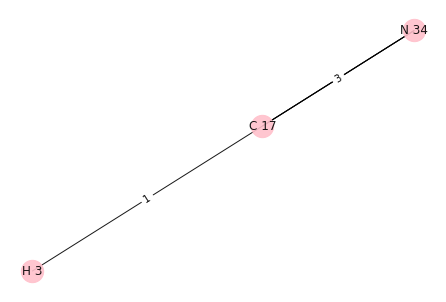

H 2
H 3
C 16 C 17


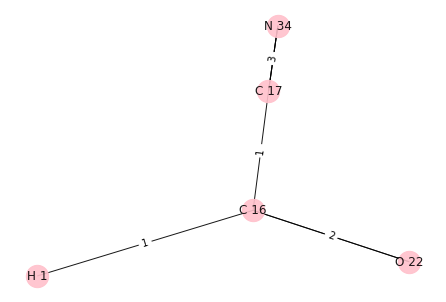

{C 17, O 22, H 1, C 16, N 34}
[C 17, N 34, O 22, C 16]
i: 0
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
H 2 0
O 22 0
H 1 0
C 17 0
N 34 1
C 16 0


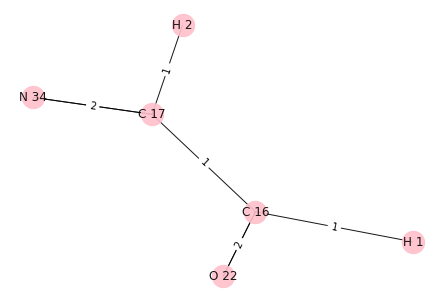

C 17 0
N 34 1
O 22 0
C 16 0
[N 34] H 3


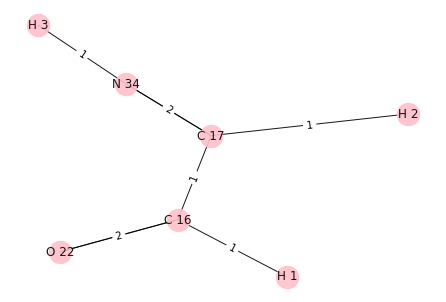

i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
H 2 0
O 22 0
H 1 0
C 17 1
N 34 0
C 16 0


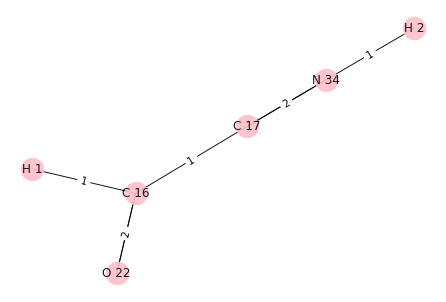

C 17 1
N 34 0
O 22 0
C 16 0
[C 17] H 3


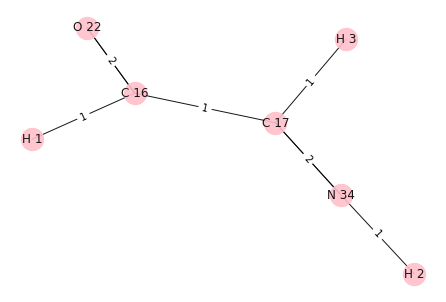

i: 2
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
N 34 0
O 22 0
H 2 0
C 17 0
H 1 0
C 16 1


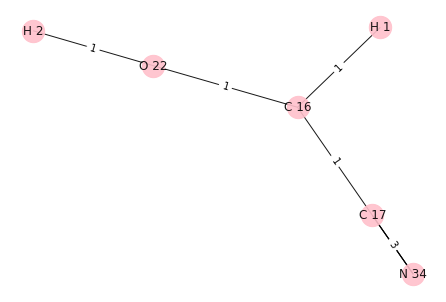

C 17 0
N 34 0
O 22 0
C 16 1
[C 16] H 3


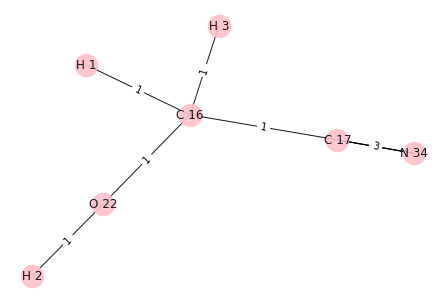

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
C 17 0
N 34 0
H 2 0
O 22 1
C 16 0
H 1 0


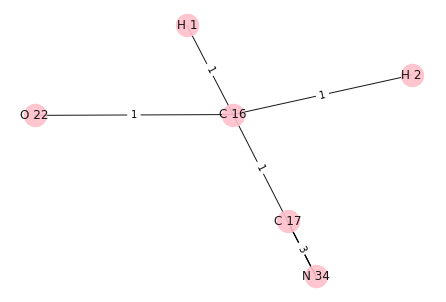

C 17 0
N 34 0
O 22 1
C 16 0
[O 22] H 3


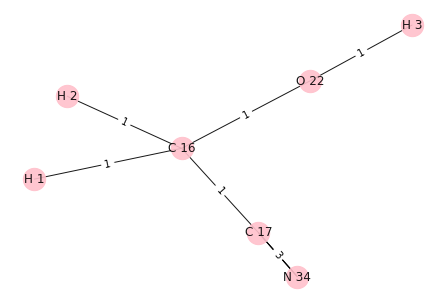

[{N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


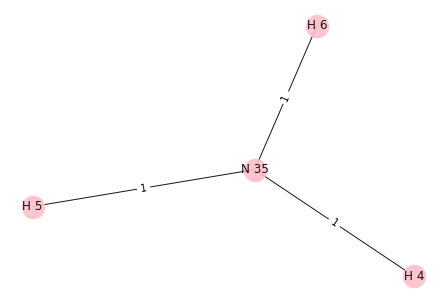

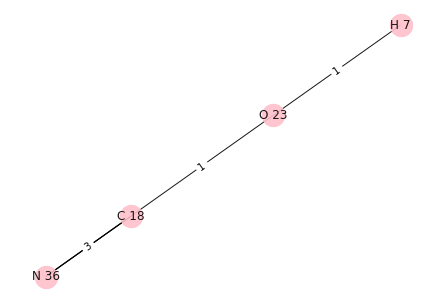

H 4
H 7
N 35 O 23


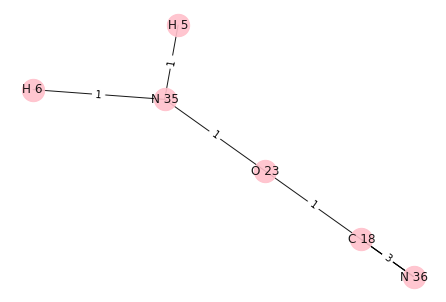

{O 23, H 6, C 18, H 5, N 36, N 35}
[O 23, C 18, N 36, N 35]
i: 0
Removing edge between: O 23 C 18
Adding edge between: O 23 H 4
O 23 0
H 4 0
H 5 0
N 35 0
H 6 0


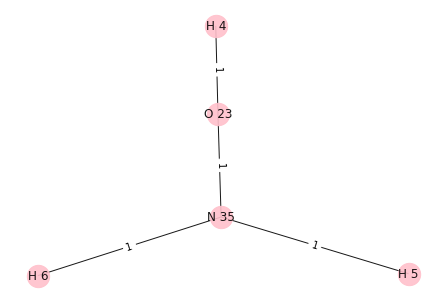

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


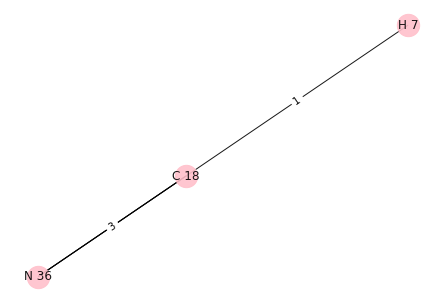

i: 1
Removing edge between: C 18 O 23
Adding edge between: C 18 H 4
C 18 0
H 4 0
N 36 0


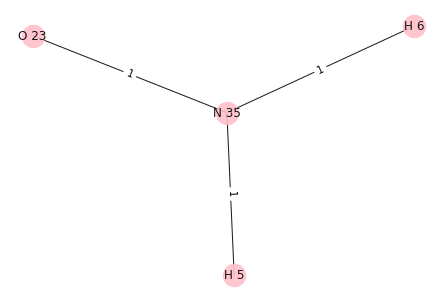

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


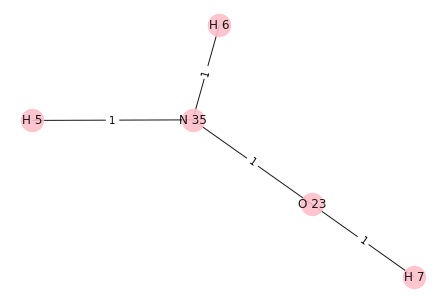

i: 2
Removing edge between: N 36 C 18
Adding edge between: N 36 H 4
O 23 0
H 4 0
H 6 0
C 18 1
N 36 0
H 5 0
N 35 0


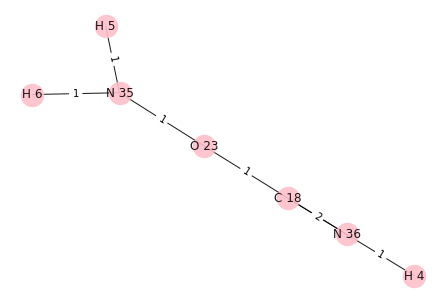

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


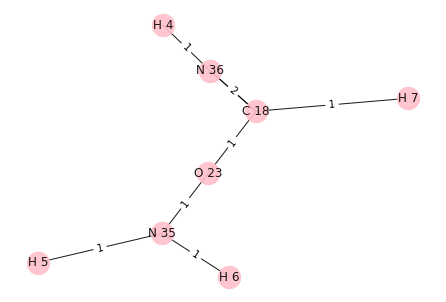

i: 3
Removing edge between: N 35 O 23
Adding edge between: N 35 H 4
N 35 0
H 6 0
H 4 0
H 5 0


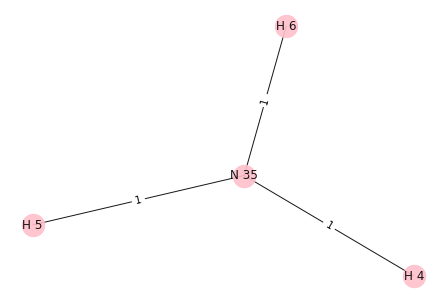

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


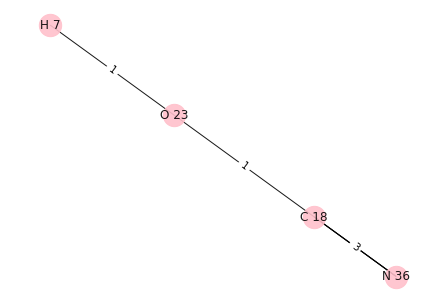

[{H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


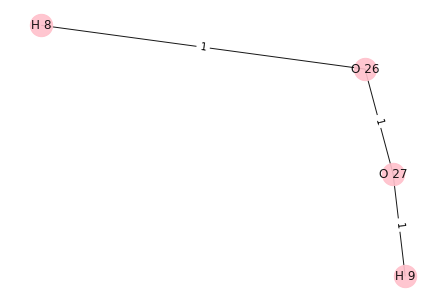

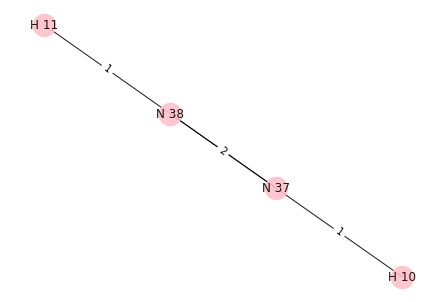

H 8
H 10
O 26 N 37


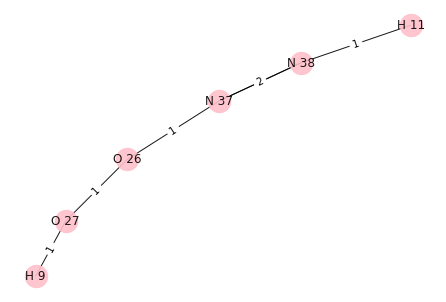

{O 26, N 38, O 27, H 9, N 37, H 11}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 8
O 26 0
H 8 0
N 38 0
N 37 0
H 11 0


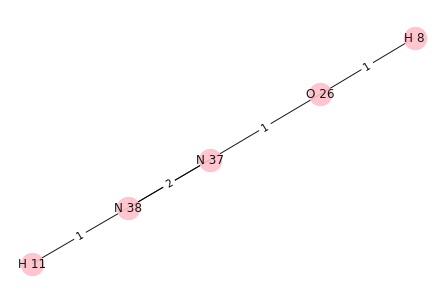

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


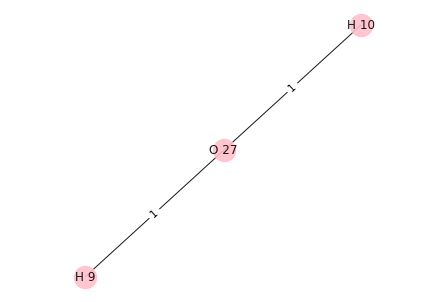

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 8
O 26 0
N 37 1
H 8 0
N 38 0
O 27 0
H 9 0
H 11 0


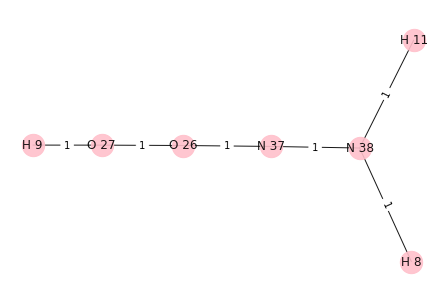

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


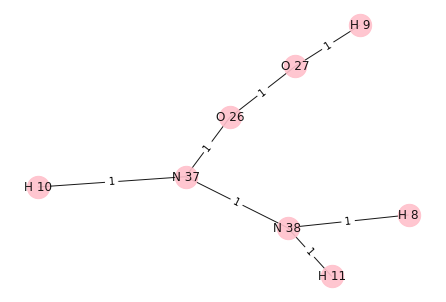

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 8
H 8 0
H 9 0
O 27 0


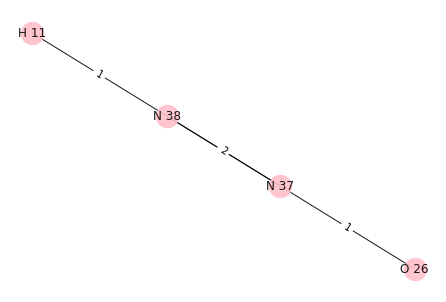

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


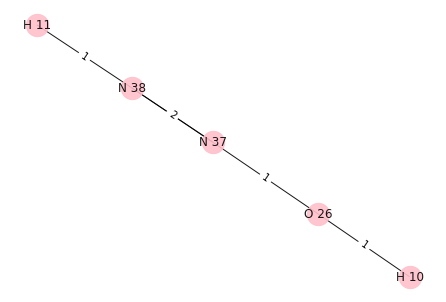

i: 3
Removing edge between: N 37 O 26
Adding edge between: N 37 H 8
H 8 0
N 38 0
N 37 0
H 11 0


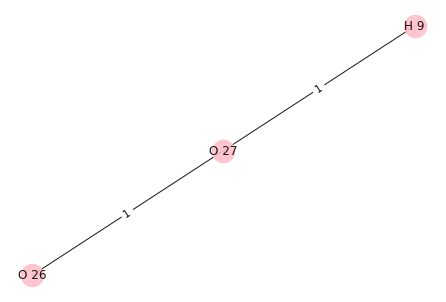

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


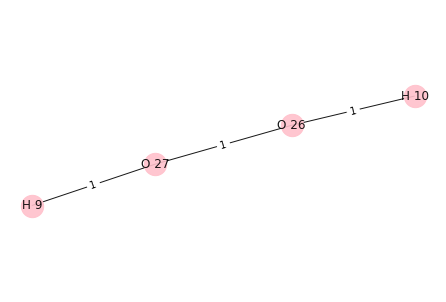

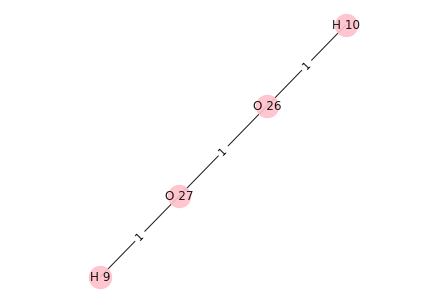

Enter G value of [O 26, H 9, O 27, H 10]: -309.1934413
[{O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


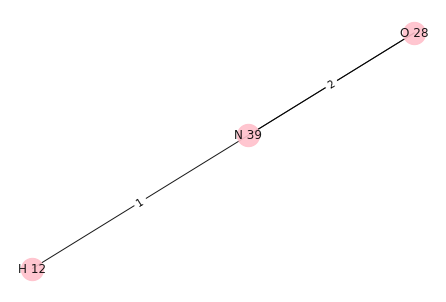

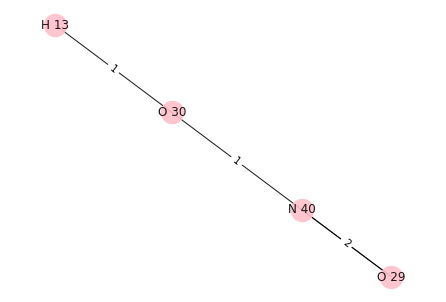

H 12
H 13
N 39 O 30


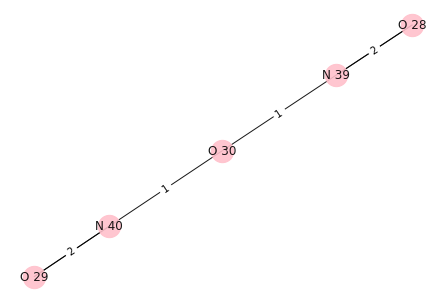

{O 30, N 40, O 28, N 39, O 29}
[O 30, N 40, N 39, O 28, O 29]
i: 0
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
H 12 0
O 30 0


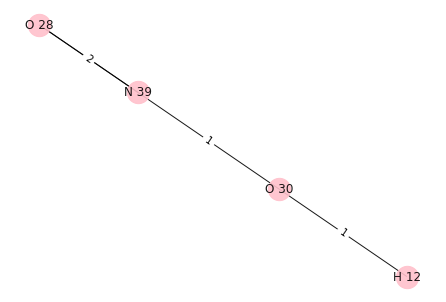

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


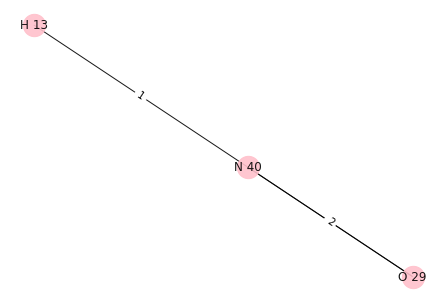

i: 1
Removing edge between: N 40 O 30
Adding edge between: N 40 H 12
O 29 0
H 12 0
N 40 0


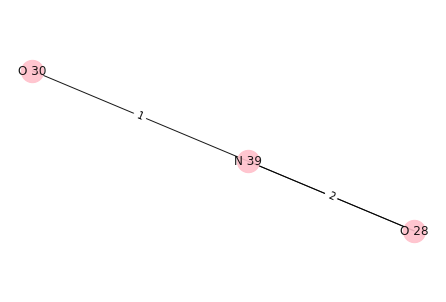

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


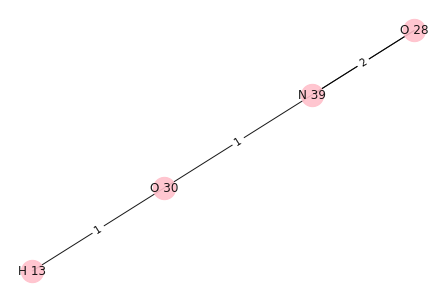

i: 2
Removing edge between: N 39 O 30
Adding edge between: N 39 H 12
O 28 0
H 12 0
N 39 0


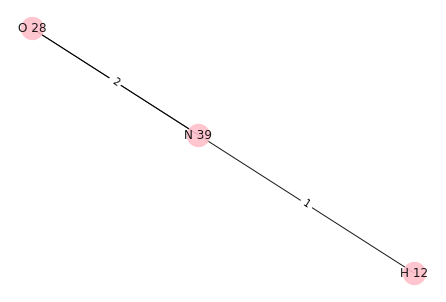

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


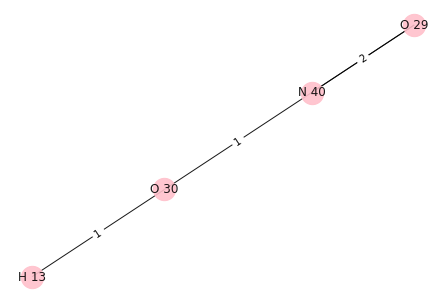

i: 3
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
O 29 0
O 30 0
H 12 0
O 28 0
N 39 1
N 40 0


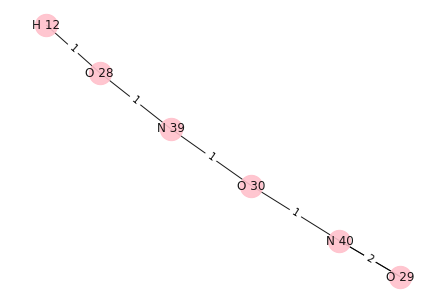

O 30 0
N 40 0
N 39 1
O 28 0
O 29 0
[N 39] H 13


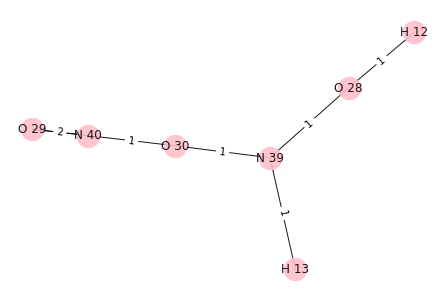

i: 4
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
O 30 0
H 12 0
N 40 1
N 39 0
O 28 0
O 29 0


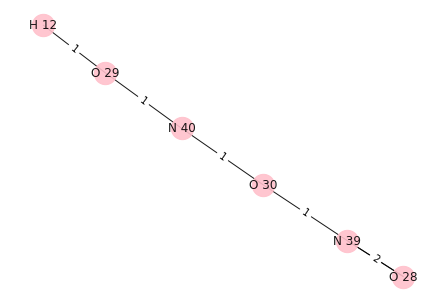

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


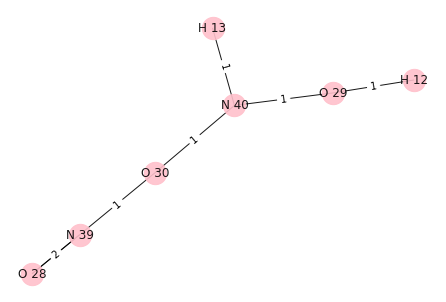

[{O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


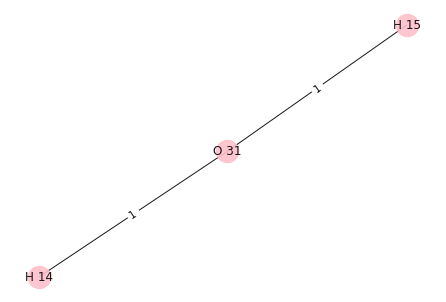

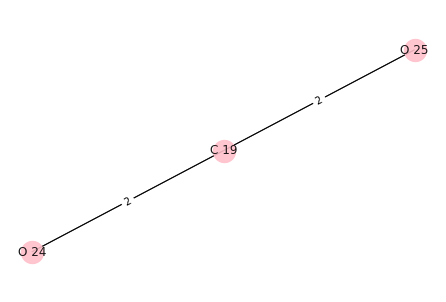

[{O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


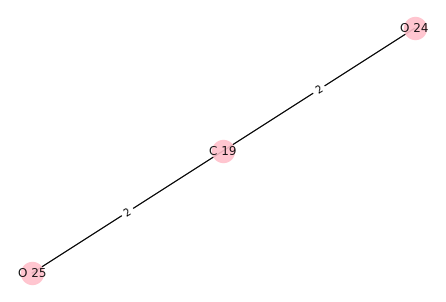

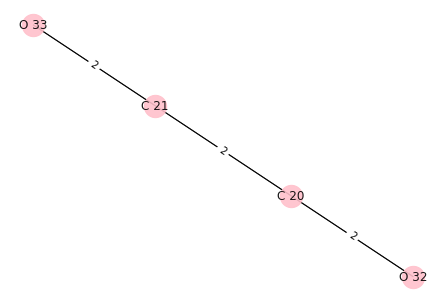

[{C 20, O 32, C 21, O 33}]
11
[{C 16, O 22, H 1, H 2}, {C 17, N 34, H 3}, {N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]
{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
7


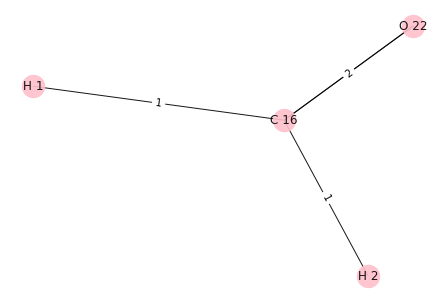

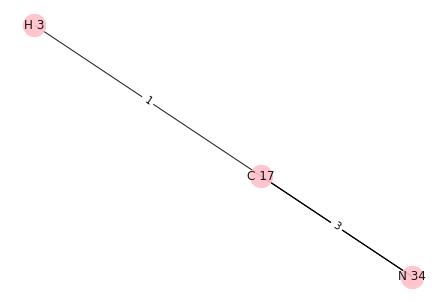

H 1
H 3
C 16 C 17


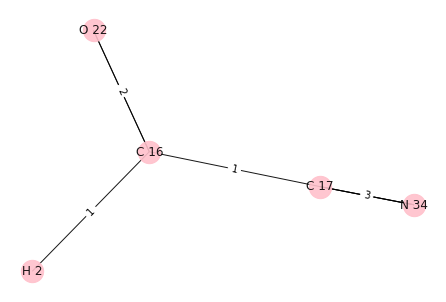

{C 17, O 22, H 2, C 16, N 34}
[C 17, N 34, O 22, C 16]
i: 0
Removing edge between: C 17 N 34
Adding edge between: C 17 H 1
O 22 0
H 2 0
H 1 0
C 17 0
N 34 1
C 16 0


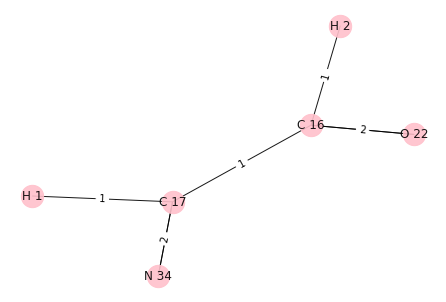

C 17 0
N 34 1
O 22 0
C 16 0
[N 34] H 3


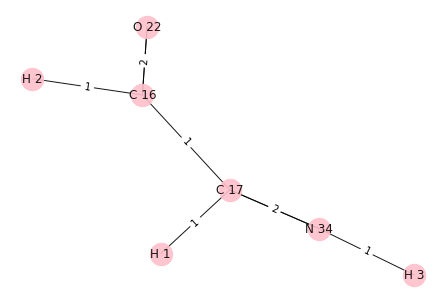

i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 1
O 22 0
H 2 0
H 1 0
C 17 1
N 34 0
C 16 0


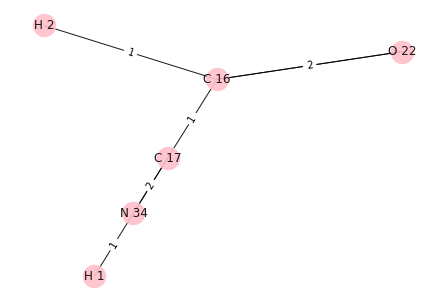

C 17 1
N 34 0
O 22 0
C 16 0
[C 17] H 3


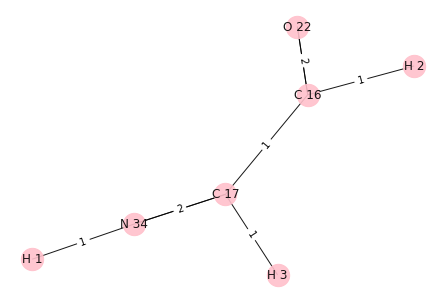

i: 2
Removing edge between: O 22 C 16
Adding edge between: O 22 H 1
N 34 0
O 22 0
H 2 0
C 17 0
H 1 0
C 16 1


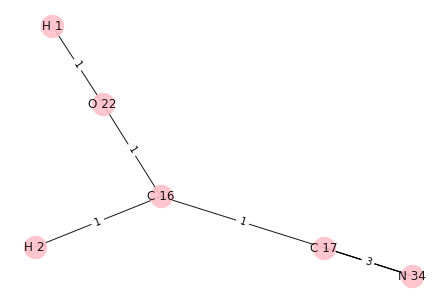

C 17 0
N 34 0
O 22 0
C 16 1
[C 16] H 3


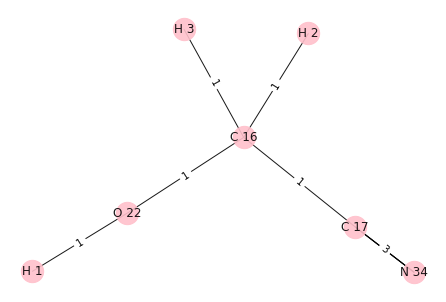

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 1
C 17 0
N 34 0
O 22 1
H 2 0
C 16 0
H 1 0


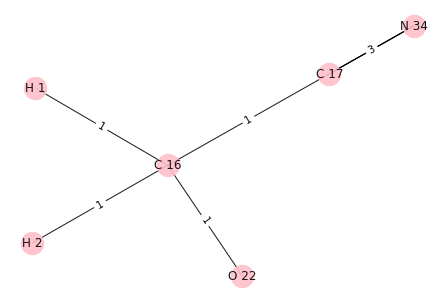

C 17 0
N 34 0
O 22 1
C 16 0
[O 22] H 3


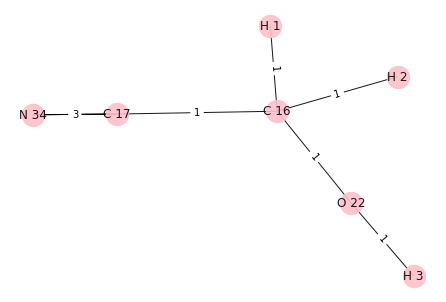

[{N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


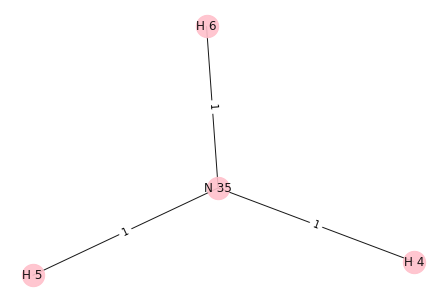

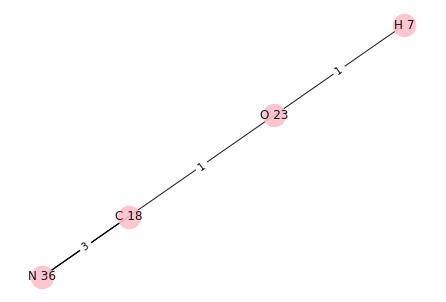

H 4
H 7
N 35 O 23


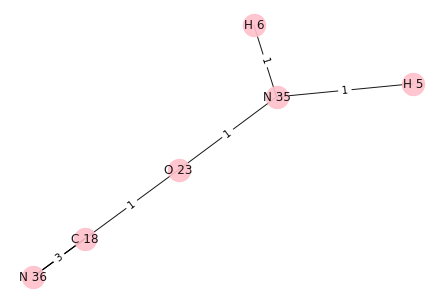

{O 23, H 6, C 18, H 5, N 36, N 35}
[O 23, C 18, N 36, N 35]
i: 0
Removing edge between: O 23 C 18
Adding edge between: O 23 H 4
O 23 0
H 4 0
H 5 0
N 35 0
H 6 0


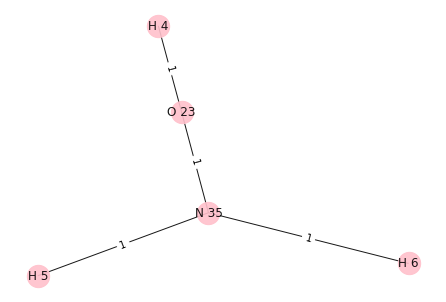

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


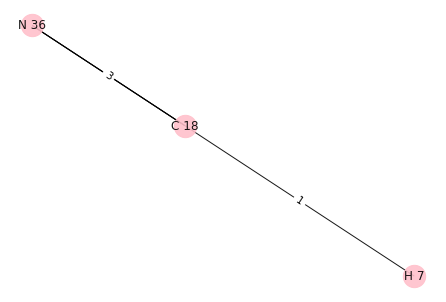

i: 1
Removing edge between: C 18 O 23
Adding edge between: C 18 H 4
C 18 0
H 4 0
N 36 0


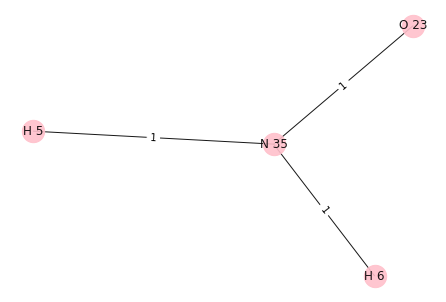

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


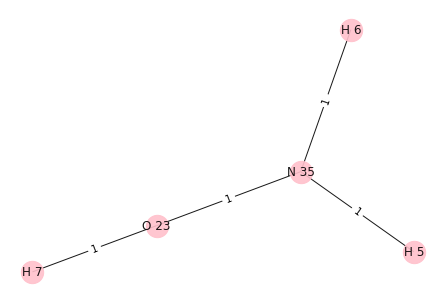

i: 2
Removing edge between: N 36 C 18
Adding edge between: N 36 H 4
O 23 0
H 4 0
H 6 0
C 18 1
N 36 0
H 5 0
N 35 0


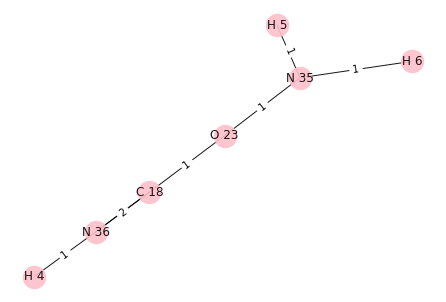

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


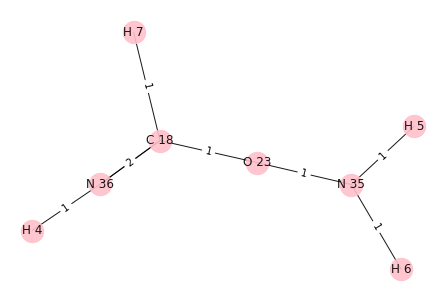

i: 3
Removing edge between: N 35 O 23
Adding edge between: N 35 H 4
N 35 0
H 6 0
H 4 0
H 5 0


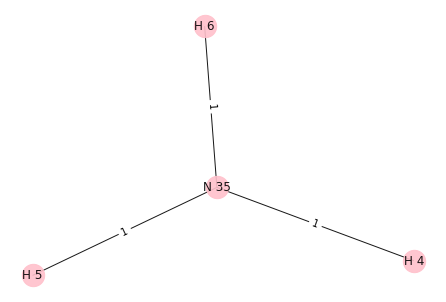

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


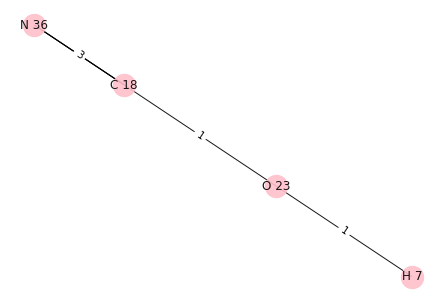

[{H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


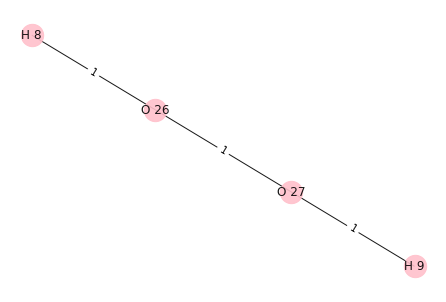

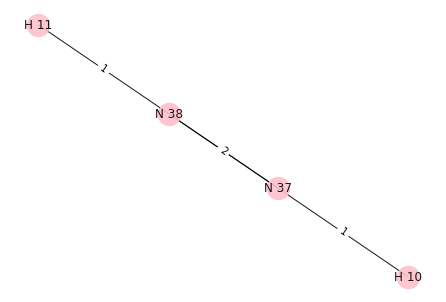

H 9
H 10
O 27 N 37


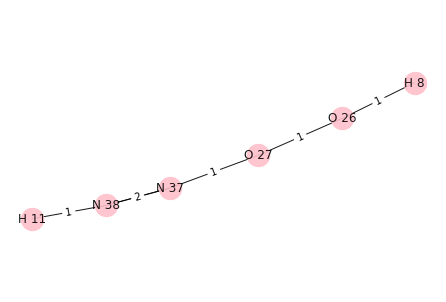

{O 26, H 8, N 38, O 27, N 37, H 11}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
H 9 0
H 8 0
O 26 0


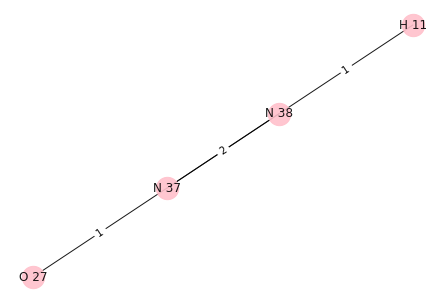

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


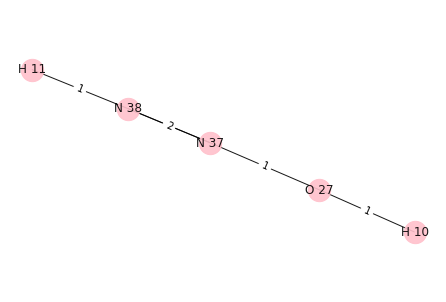

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
N 37 1
N 38 0
H 8 0
O 27 0
H 9 0
H 11 0


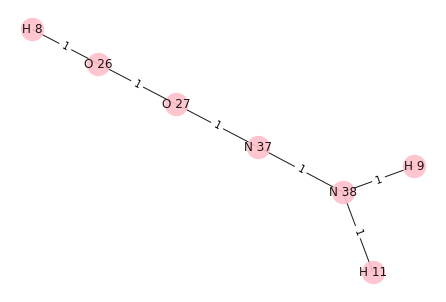

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


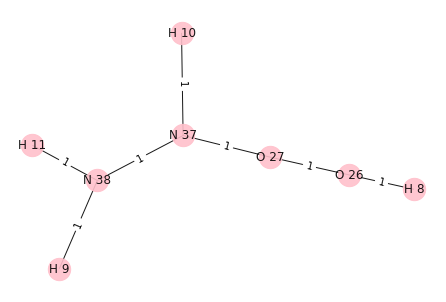

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
N 38 0
O 27 0
H 9 0
N 37 0
H 11 0


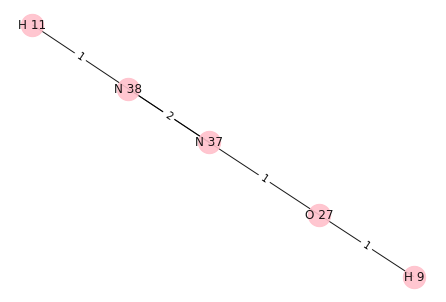

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


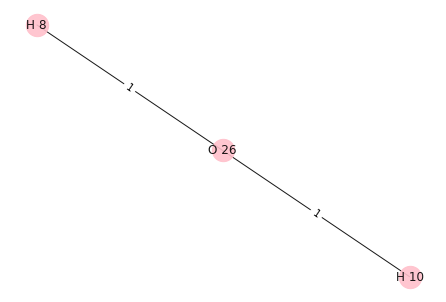

i: 3
Removing edge between: N 37 N 38
Adding edge between: N 37 H 9
O 26 0
N 38 1
H 8 0
O 27 0
H 9 0
N 37 0
H 11 0


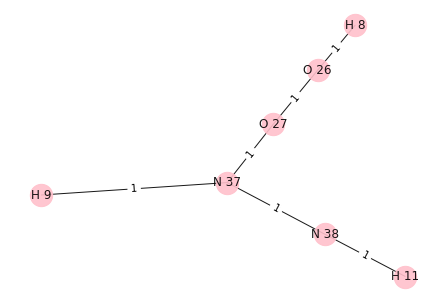

O 26 0
N 38 1
O 27 0
N 37 0
[N 38] H 10


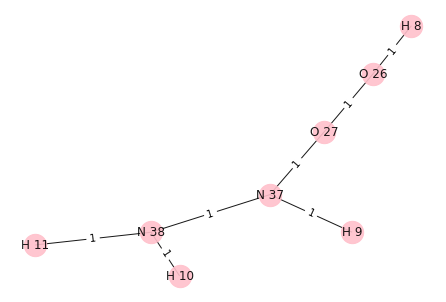

[{O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


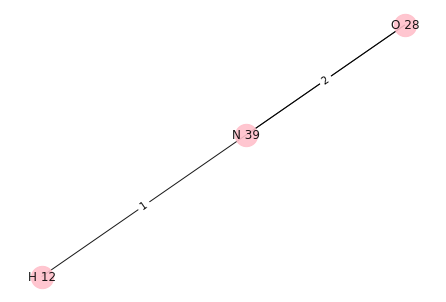

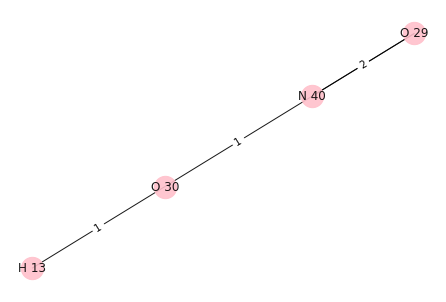

H 12
H 13
N 39 O 30


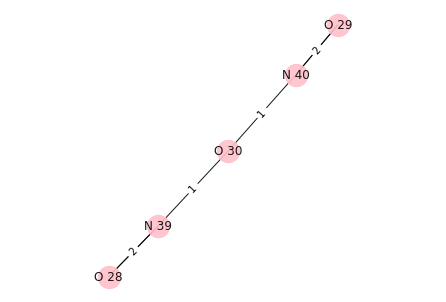

{O 30, N 40, O 28, N 39, O 29}
[O 30, N 40, N 39, O 28, O 29]
i: 0
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
H 12 0
O 30 0


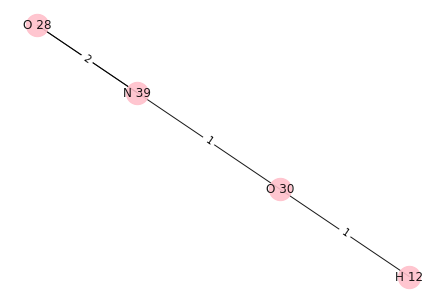

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


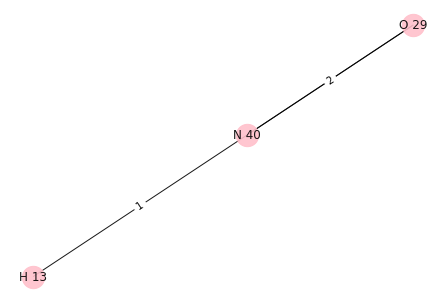

i: 1
Removing edge between: N 40 O 30
Adding edge between: N 40 H 12
O 29 0
H 12 0
N 40 0


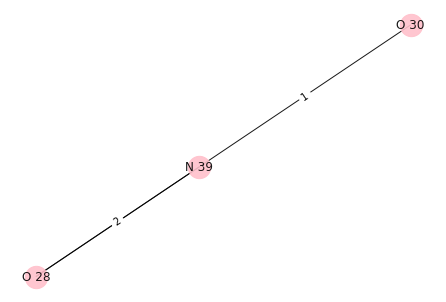

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


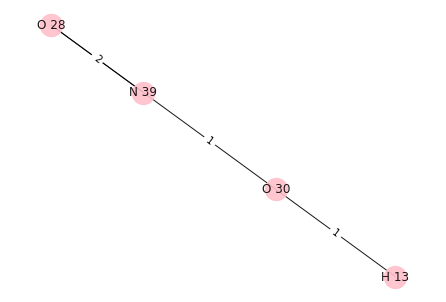

i: 2
Removing edge between: N 39 O 30
Adding edge between: N 39 H 12
O 28 0
H 12 0
N 39 0


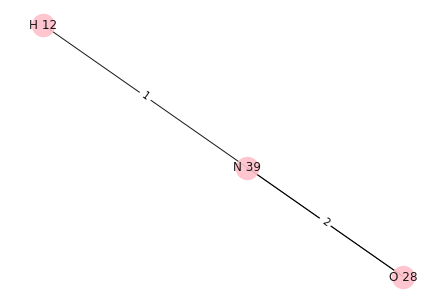

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


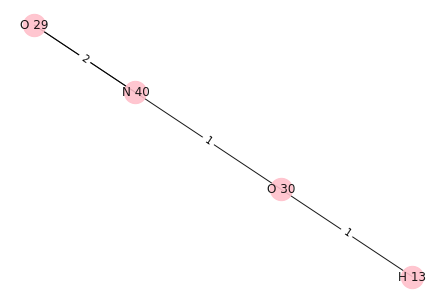

i: 3
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
O 29 0
O 30 0
H 12 0
O 28 0
N 39 1
N 40 0


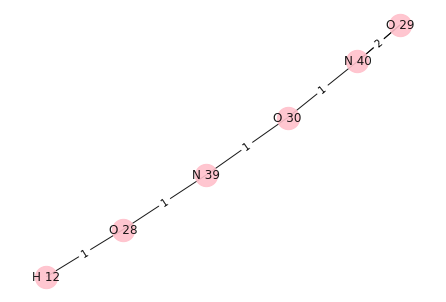

O 30 0
N 40 0
N 39 1
O 28 0
O 29 0
[N 39] H 13


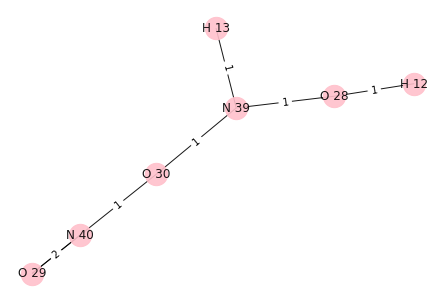

i: 4
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
O 30 0
H 12 0
N 40 1
N 39 0
O 28 0
O 29 0


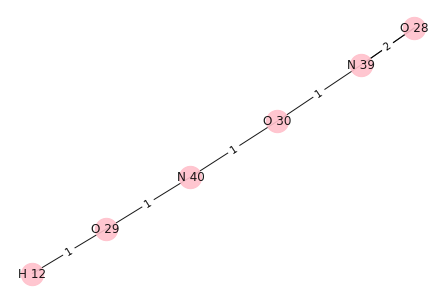

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


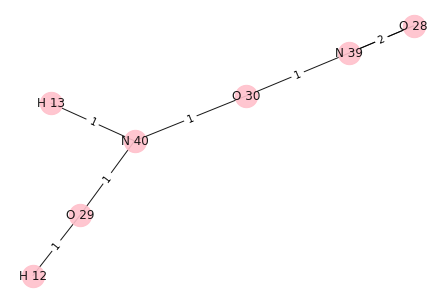

[{O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


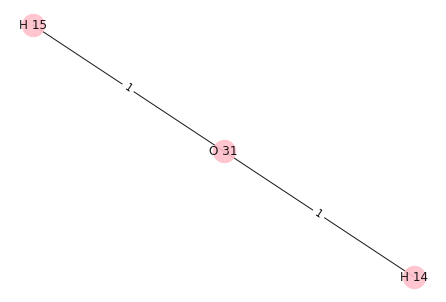

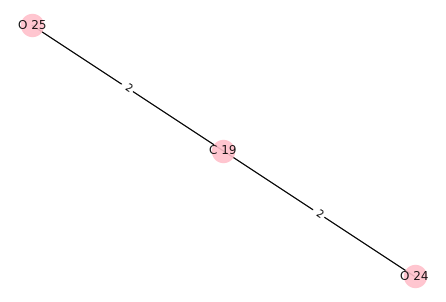

[{O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


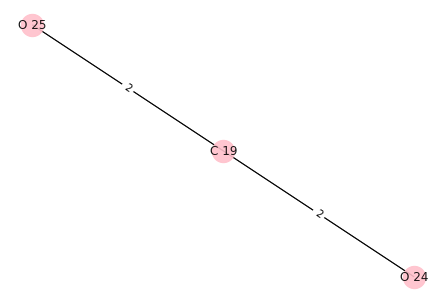

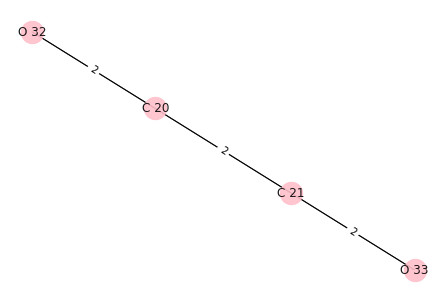

[{C 20, O 32, C 21, O 33}]
11
[{C 16, O 22, H 1, H 2}, {C 17, N 34, H 3}, {N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]
{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
7


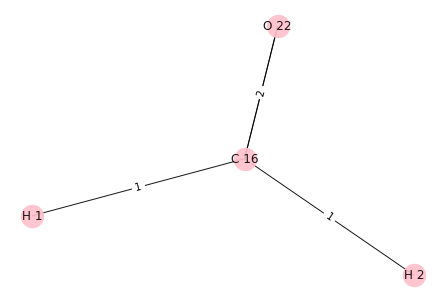

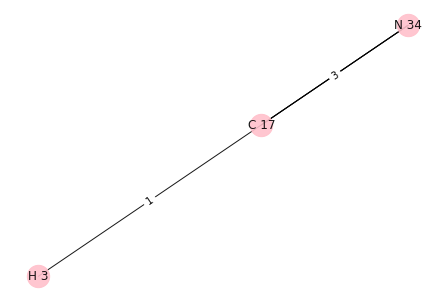

H 2
H 3
C 16 C 17


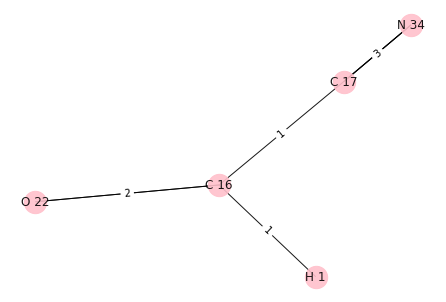

{C 17, O 22, H 1, C 16, N 34}
[C 17, N 34, O 22, C 16]
i: 0
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
H 2 0
O 22 0
H 1 0
C 17 0
N 34 1
C 16 0


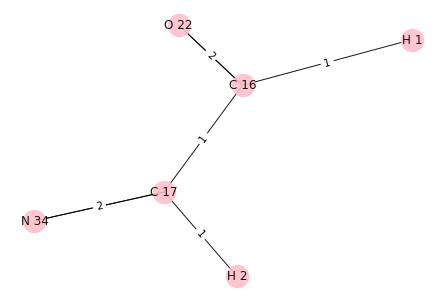

C 17 0
N 34 1
O 22 0
C 16 0
[N 34] H 3


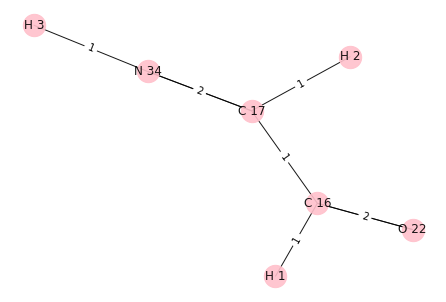

i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
H 2 0
O 22 0
H 1 0
C 17 1
N 34 0
C 16 0


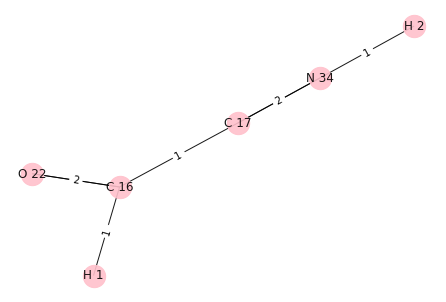

C 17 1
N 34 0
O 22 0
C 16 0
[C 17] H 3


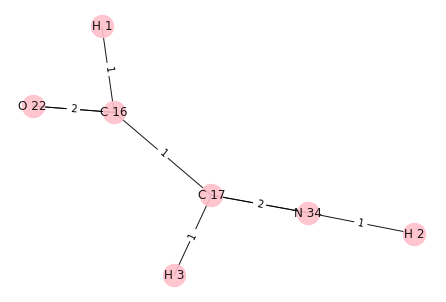

i: 2
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
N 34 0
O 22 0
H 2 0
C 17 0
H 1 0
C 16 1


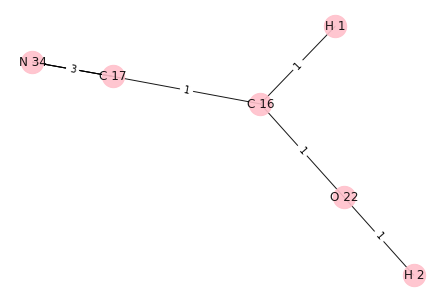

C 17 0
N 34 0
O 22 0
C 16 1
[C 16] H 3


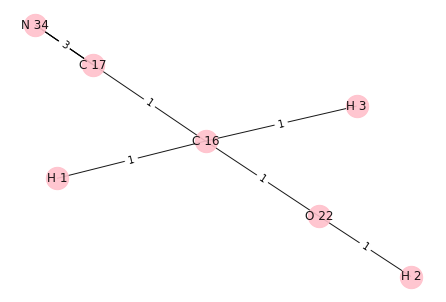

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
C 17 0
N 34 0
H 2 0
O 22 1
C 16 0
H 1 0


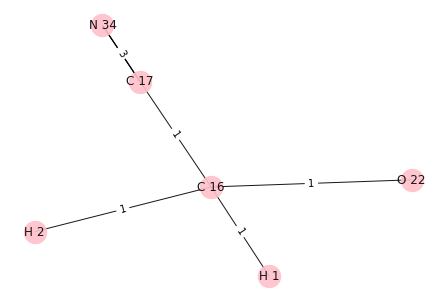

C 17 0
N 34 0
O 22 1
C 16 0
[O 22] H 3


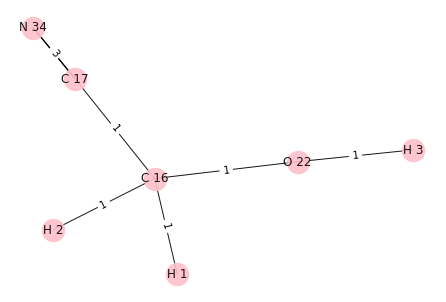

[{N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


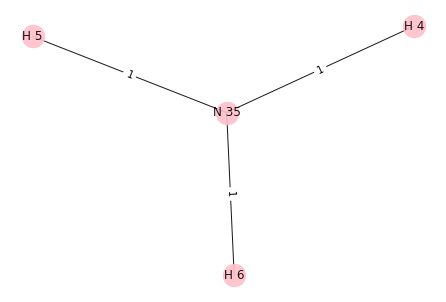

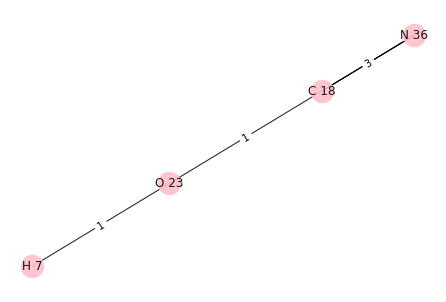

H 4
H 7
N 35 O 23


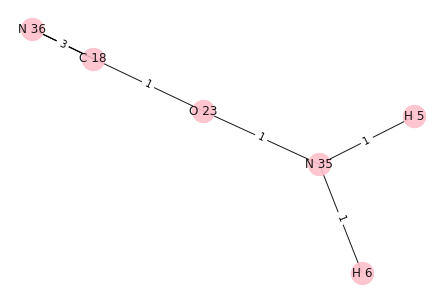

{O 23, H 6, C 18, H 5, N 36, N 35}
[O 23, C 18, N 36, N 35]
i: 0
Removing edge between: O 23 C 18
Adding edge between: O 23 H 4
O 23 0
H 4 0
H 5 0
N 35 0
H 6 0


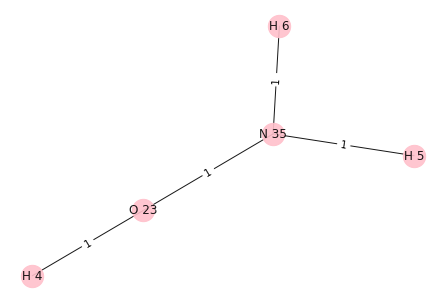

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


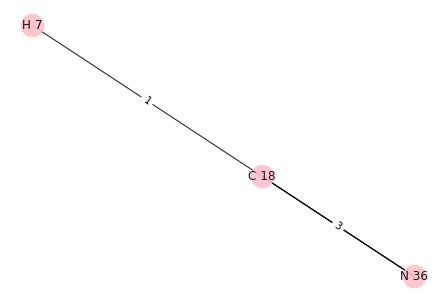

i: 1
Removing edge between: C 18 O 23
Adding edge between: C 18 H 4
C 18 0
H 4 0
N 36 0


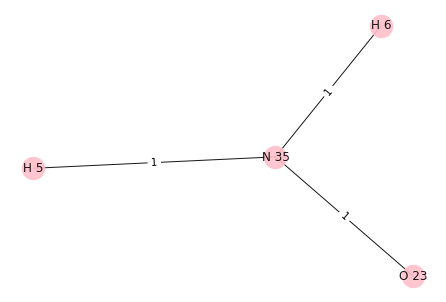

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


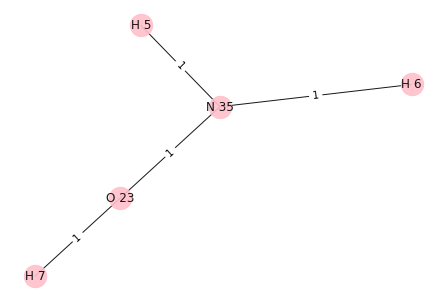

i: 2
Removing edge between: N 36 C 18
Adding edge between: N 36 H 4
O 23 0
H 4 0
H 6 0
C 18 1
N 36 0
H 5 0
N 35 0


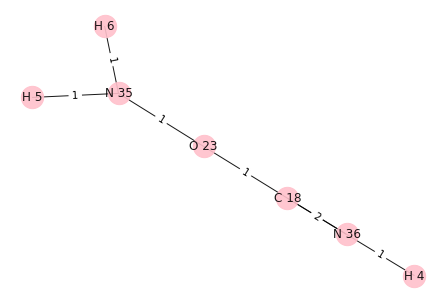

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


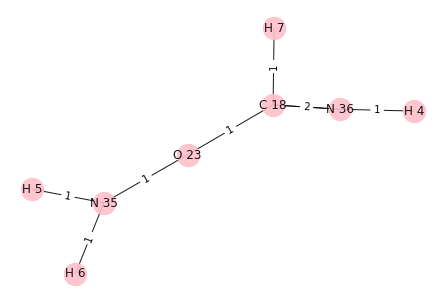

i: 3
Removing edge between: N 35 O 23
Adding edge between: N 35 H 4
N 35 0
H 6 0
H 4 0
H 5 0


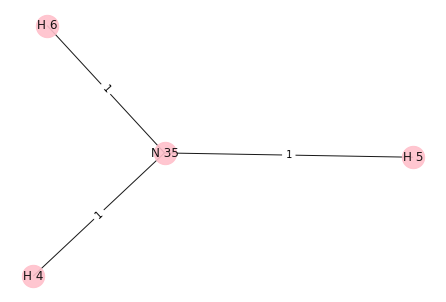

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


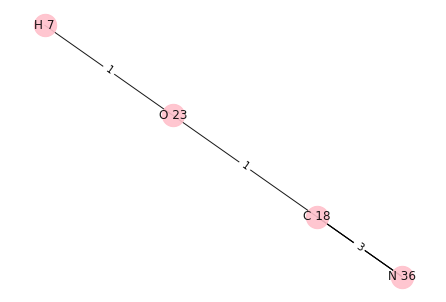

[{H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


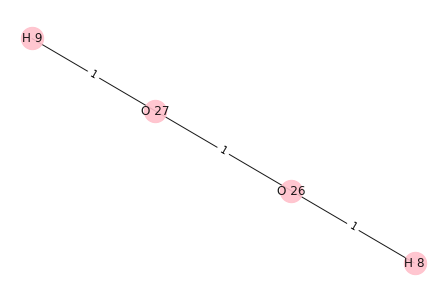

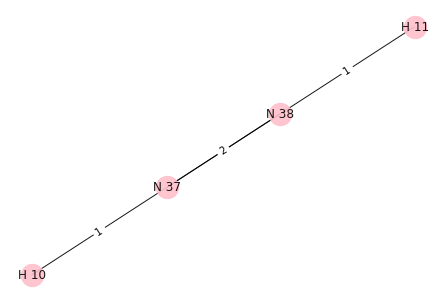

H 8
H 10
O 26 N 37


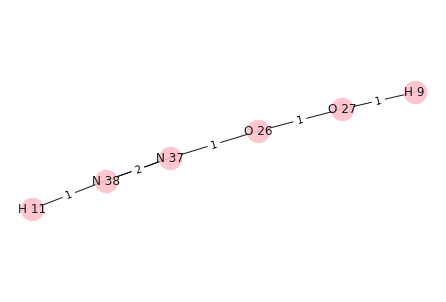

{O 26, N 38, O 27, H 9, N 37, H 11}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 8
O 26 0
H 8 0
N 38 0
N 37 0
H 11 0


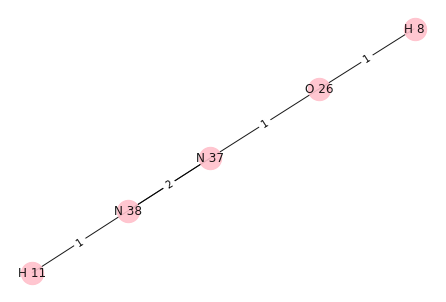

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


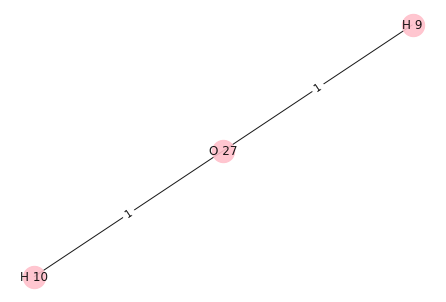

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 8
O 26 0
N 37 1
H 8 0
N 38 0
O 27 0
H 9 0
H 11 0


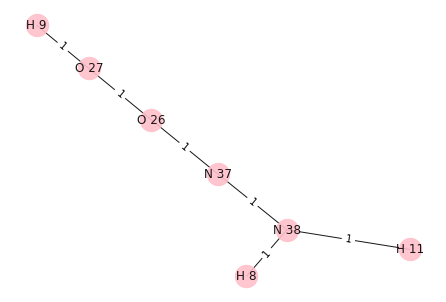

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


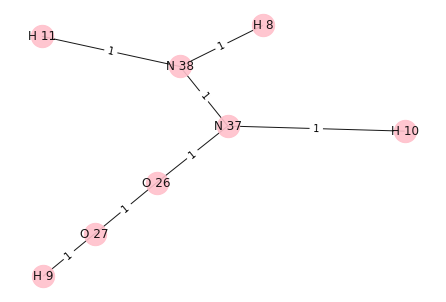

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 8
H 8 0
H 9 0
O 27 0


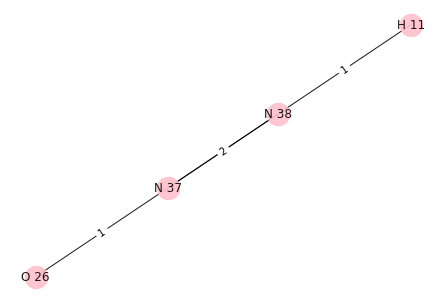

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


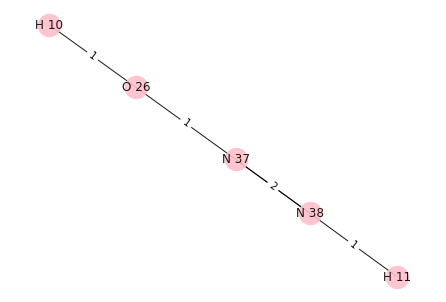

i: 3
Removing edge between: N 37 O 26
Adding edge between: N 37 H 8
H 8 0
N 38 0
N 37 0
H 11 0


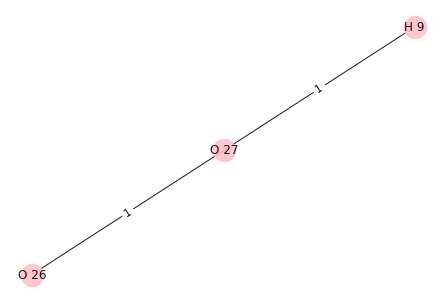

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


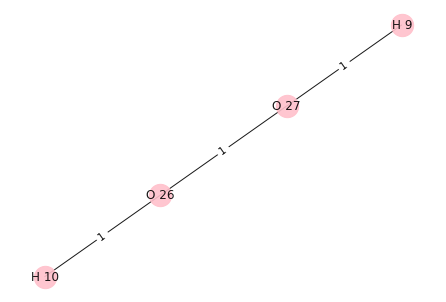

[{O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


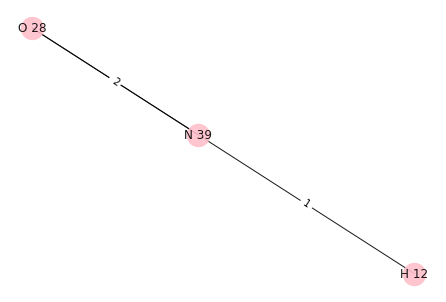

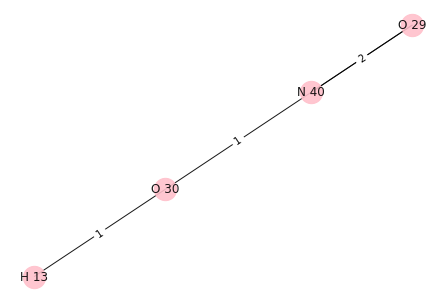

H 12
H 13
N 39 O 30


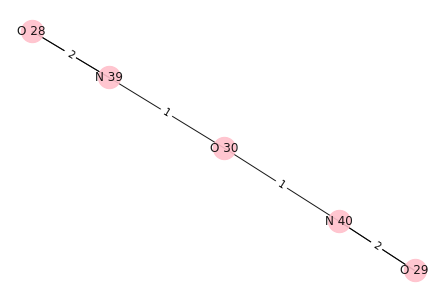

{O 30, N 40, O 28, N 39, O 29}
[O 30, N 40, N 39, O 28, O 29]
i: 0
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
H 12 0
O 30 0


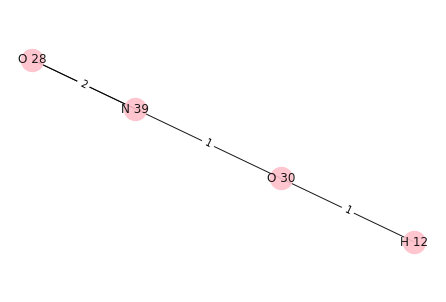

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


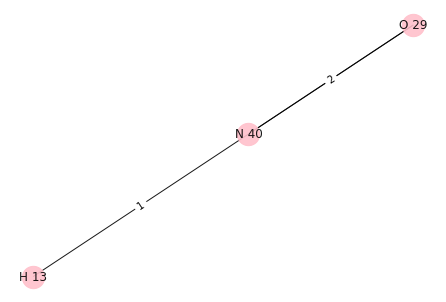

i: 1
Removing edge between: N 40 O 30
Adding edge between: N 40 H 12
O 29 0
H 12 0
N 40 0


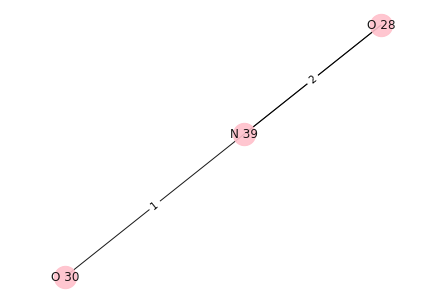

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


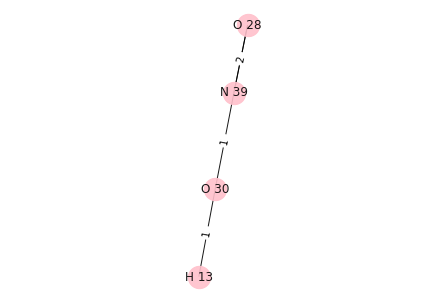

i: 2
Removing edge between: N 39 O 30
Adding edge between: N 39 H 12
O 28 0
H 12 0
N 39 0


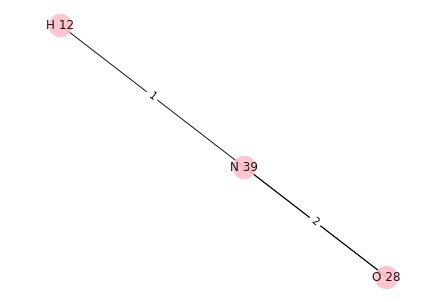

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


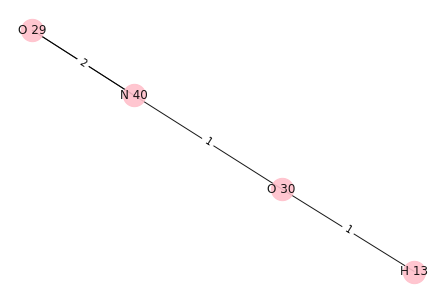

i: 3
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
O 29 0
O 30 0
H 12 0
O 28 0
N 39 1
N 40 0


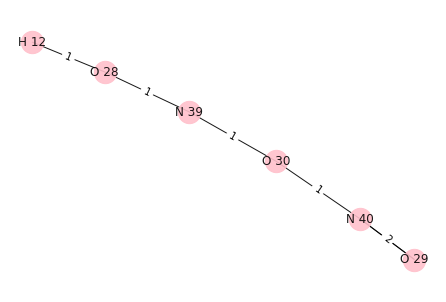

O 30 0
N 40 0
N 39 1
O 28 0
O 29 0
[N 39] H 13


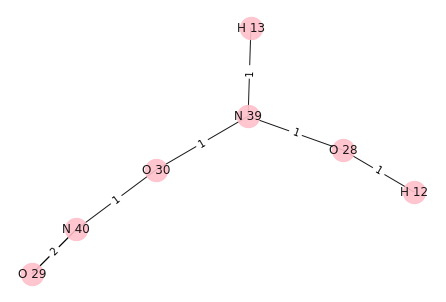

i: 4
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
O 30 0
H 12 0
N 40 1
N 39 0
O 28 0
O 29 0


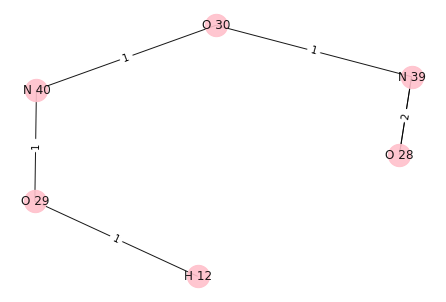

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


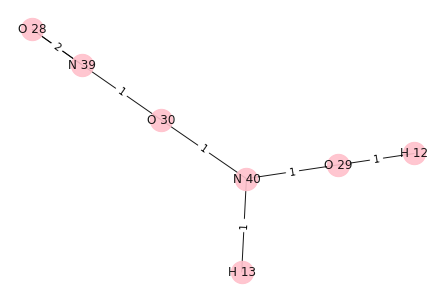

[{O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


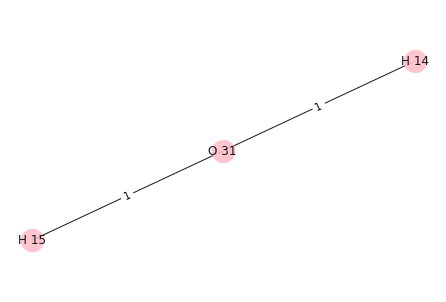

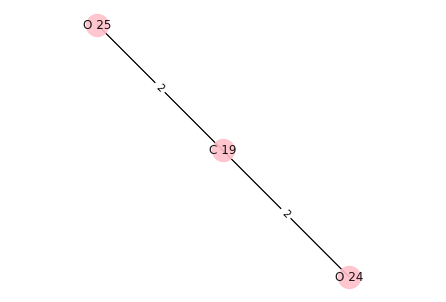

[{O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


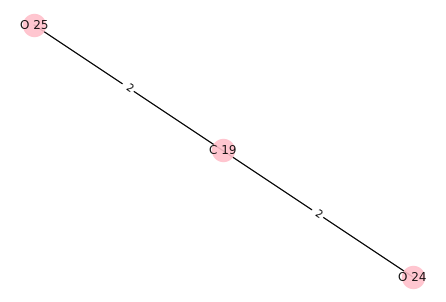

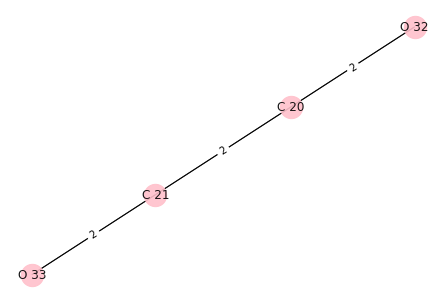

[{C 20, O 32, C 21, O 33}]
11
[{C 16, O 22, H 1, H 2}, {C 17, N 34, H 3}, {N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]
{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
7


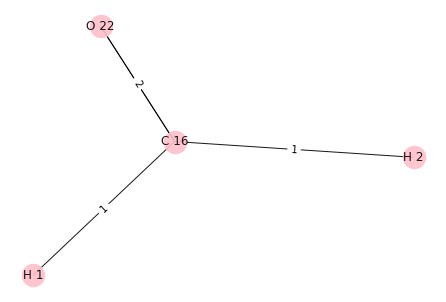

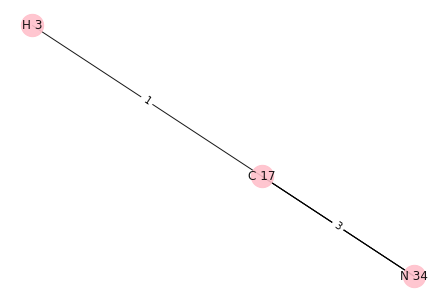

H 2
H 3
C 16 C 17


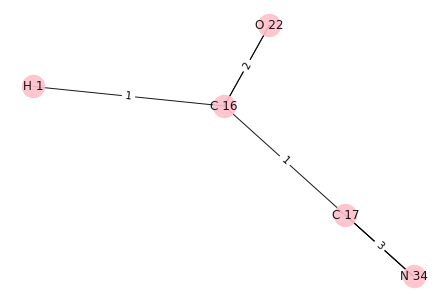

{C 17, O 22, H 1, C 16, N 34}
[C 17, N 34, O 22, C 16]
i: 0
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
H 2 0
O 22 0
H 1 0
C 17 0
N 34 1
C 16 0


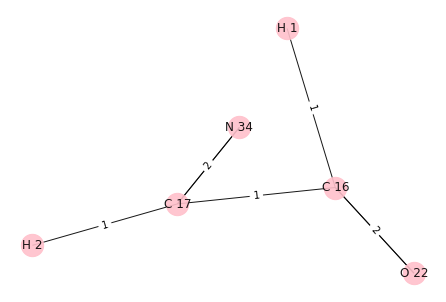

C 17 0
N 34 1
O 22 0
C 16 0
[N 34] H 3


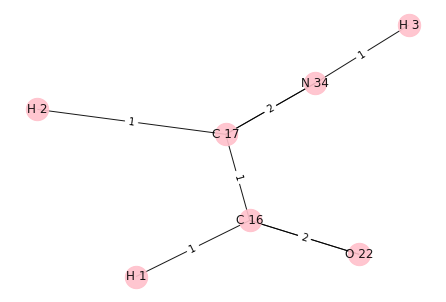

i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
H 2 0
O 22 0
H 1 0
C 17 1
N 34 0
C 16 0


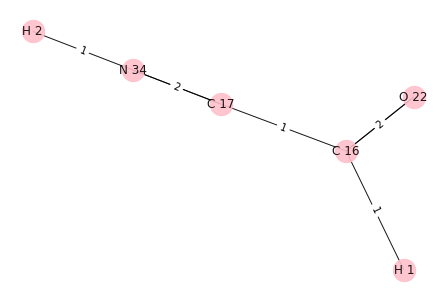

C 17 1
N 34 0
O 22 0
C 16 0
[C 17] H 3


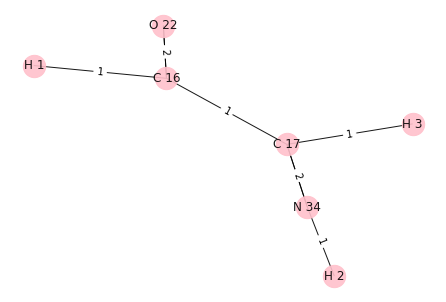

i: 2
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
N 34 0
O 22 0
H 2 0
C 17 0
H 1 0
C 16 1


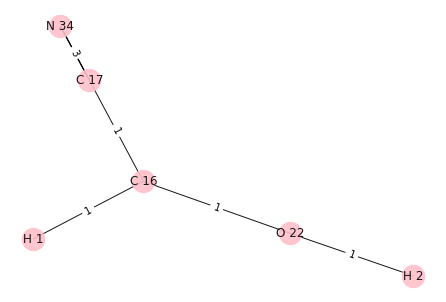

C 17 0
N 34 0
O 22 0
C 16 1
[C 16] H 3


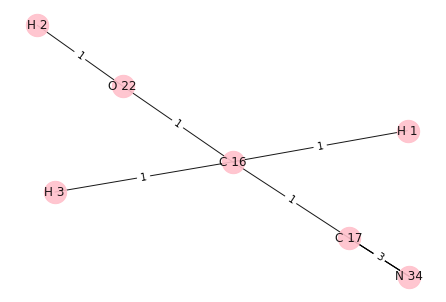

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
C 17 0
N 34 0
H 2 0
O 22 1
C 16 0
H 1 0


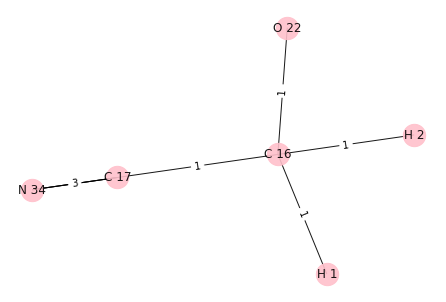

C 17 0
N 34 0
O 22 1
C 16 0
[O 22] H 3


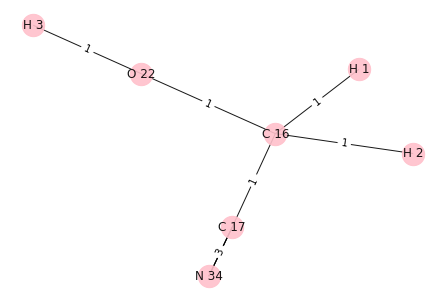

[{N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


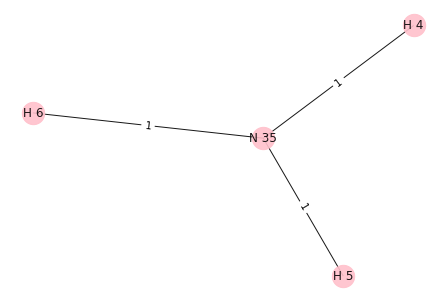

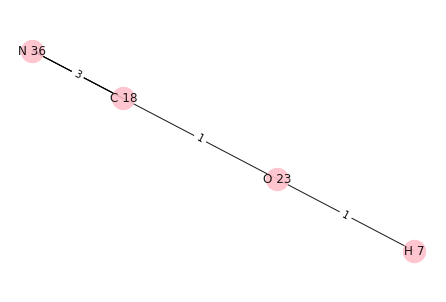

H 4
H 7
N 35 O 23


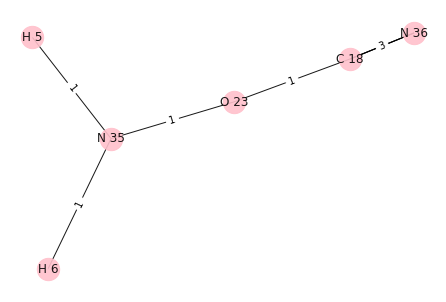

{O 23, H 6, C 18, H 5, N 36, N 35}
[O 23, C 18, N 36, N 35]
i: 0
Removing edge between: O 23 C 18
Adding edge between: O 23 H 4
O 23 0
H 4 0
H 5 0
N 35 0
H 6 0


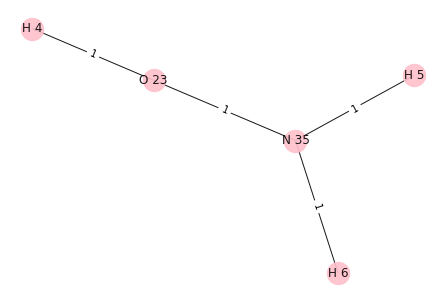

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


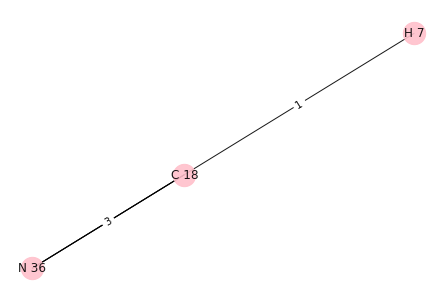

i: 1
Removing edge between: C 18 O 23
Adding edge between: C 18 H 4
C 18 0
H 4 0
N 36 0


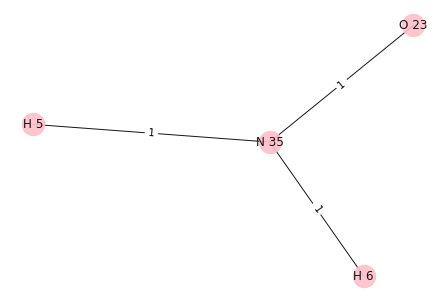

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


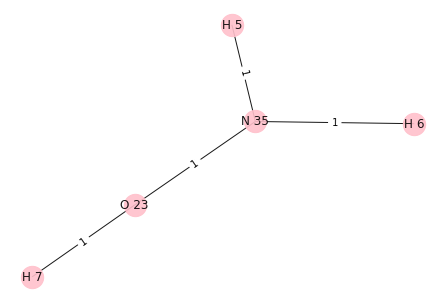

i: 2
Removing edge between: N 36 C 18
Adding edge between: N 36 H 4
O 23 0
H 4 0
H 6 0
C 18 1
N 36 0
H 5 0
N 35 0


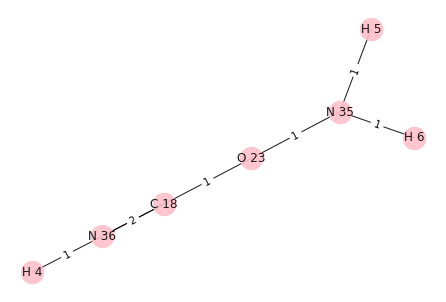

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


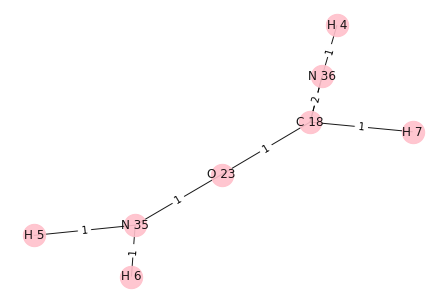

i: 3
Removing edge between: N 35 O 23
Adding edge between: N 35 H 4
N 35 0
H 6 0
H 4 0
H 5 0


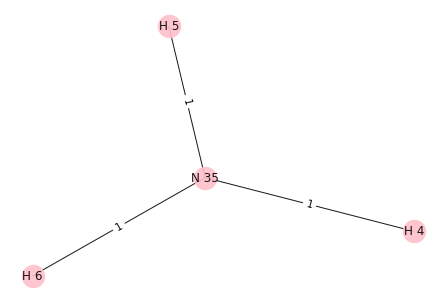

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


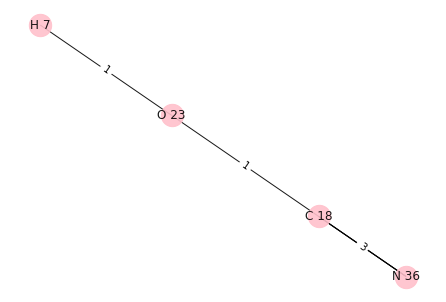

[{H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


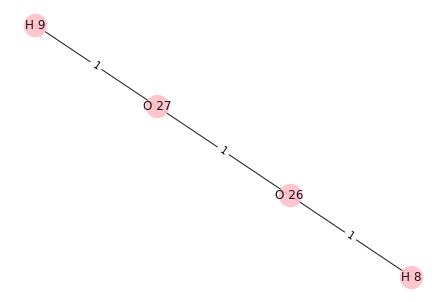

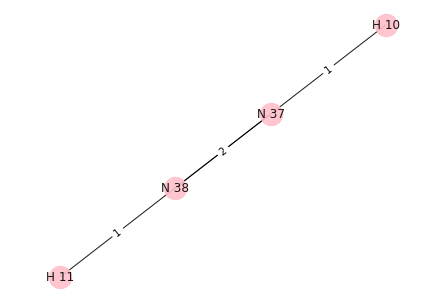

H 9
H 10
O 27 N 37


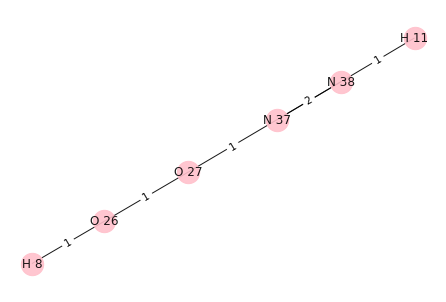

{O 26, H 8, N 38, O 27, N 37, H 11}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
H 9 0
H 8 0
O 26 0


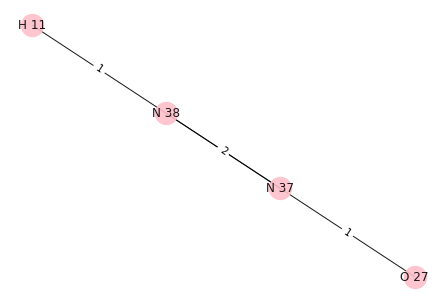

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


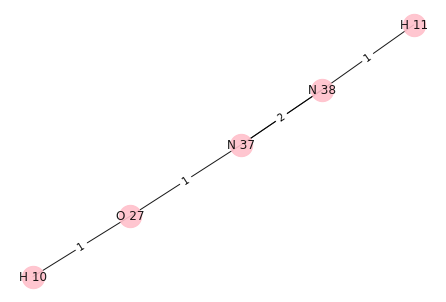

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
N 37 1
N 38 0
H 8 0
O 27 0
H 9 0
H 11 0


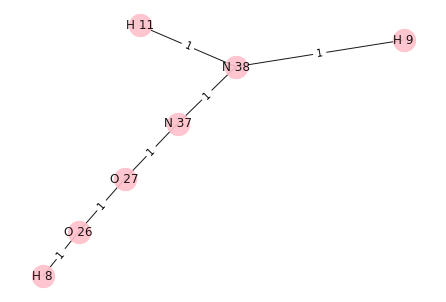

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


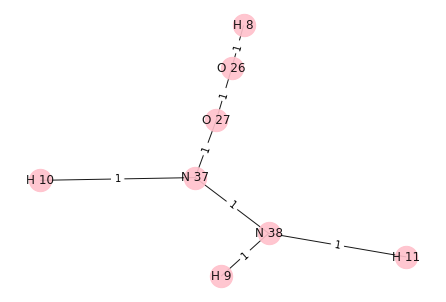

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
N 38 0
O 27 0
H 9 0
N 37 0
H 11 0


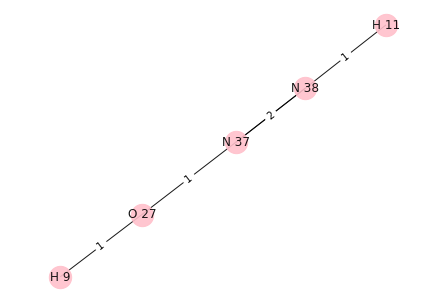

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


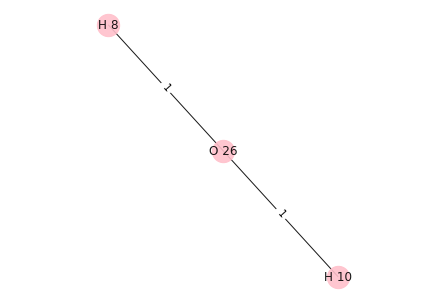

i: 3
Removing edge between: N 37 N 38
Adding edge between: N 37 H 9
O 26 0
N 38 1
H 8 0
O 27 0
H 9 0
N 37 0
H 11 0


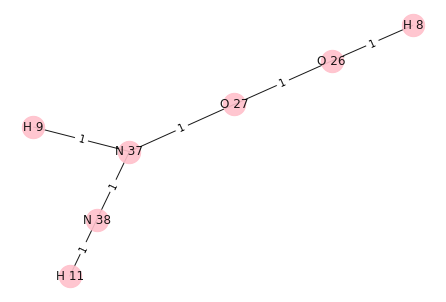

O 26 0
N 38 1
O 27 0
N 37 0
[N 38] H 10


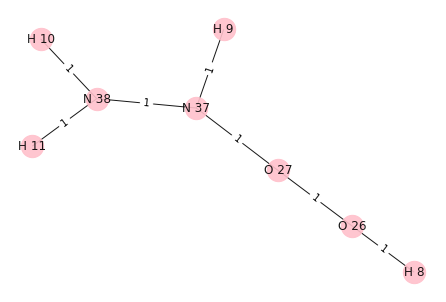

[{O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


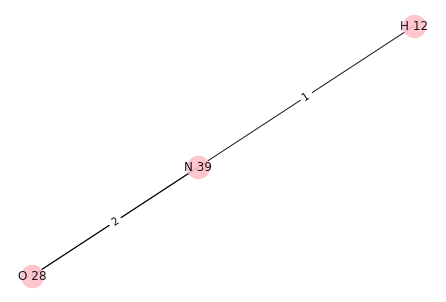

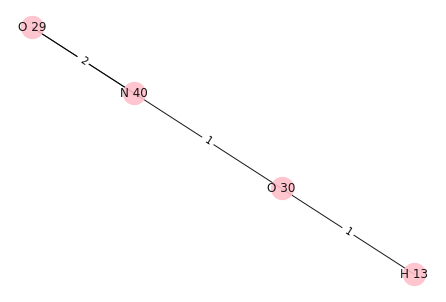

H 12
H 13
N 39 O 30


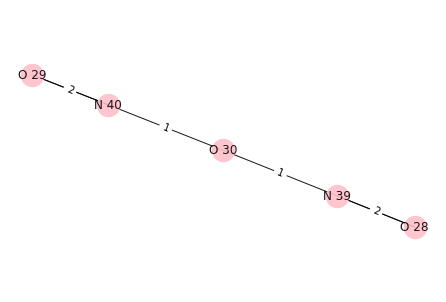

{O 30, N 40, O 28, N 39, O 29}
[O 30, N 40, N 39, O 28, O 29]
i: 0
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
H 12 0
O 30 0


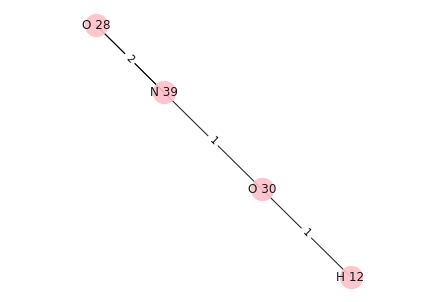

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


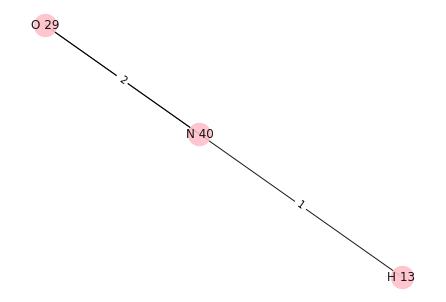

i: 1
Removing edge between: N 40 O 30
Adding edge between: N 40 H 12
O 29 0
H 12 0
N 40 0


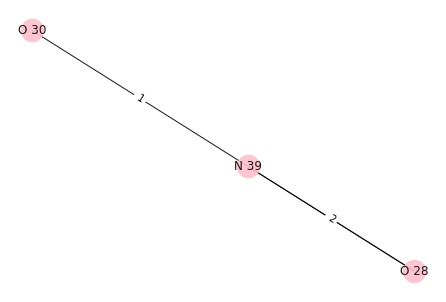

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


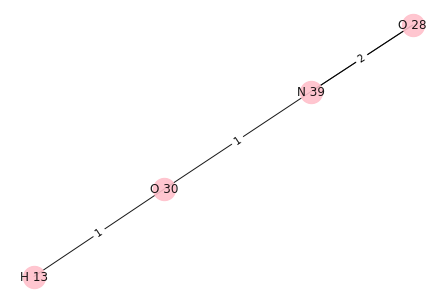

i: 2
Removing edge between: N 39 O 30
Adding edge between: N 39 H 12
O 28 0
H 12 0
N 39 0


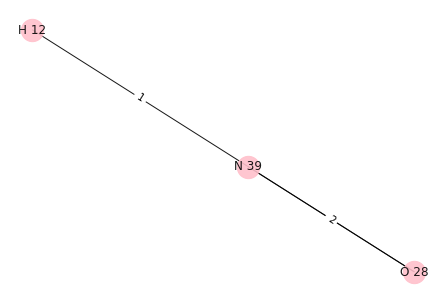

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


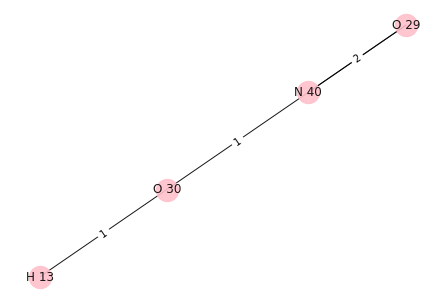

i: 3
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
O 29 0
O 30 0
H 12 0
O 28 0
N 39 1
N 40 0


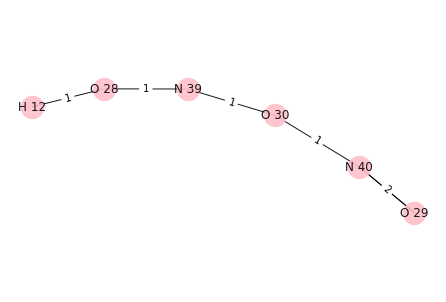

O 30 0
N 40 0
N 39 1
O 28 0
O 29 0
[N 39] H 13


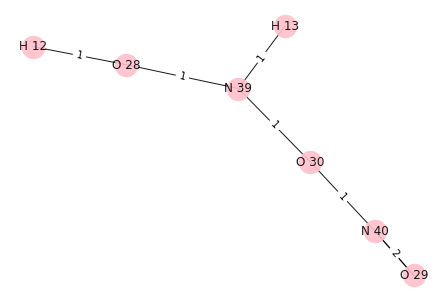

i: 4
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
O 30 0
H 12 0
N 40 1
N 39 0
O 28 0
O 29 0


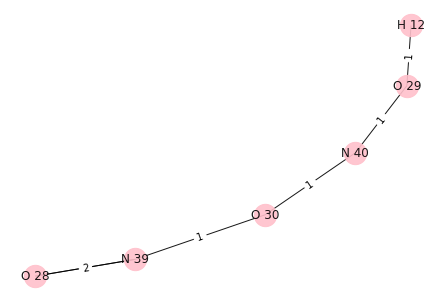

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


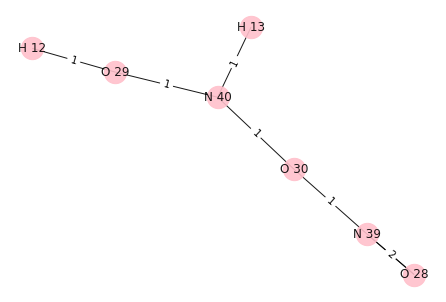

[{O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


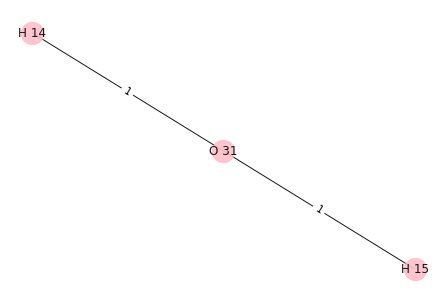

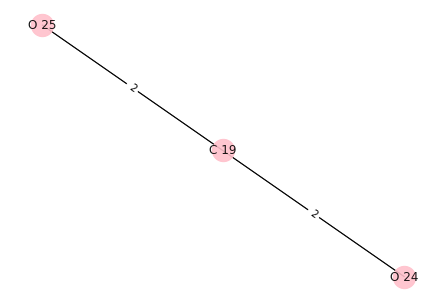

[{O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


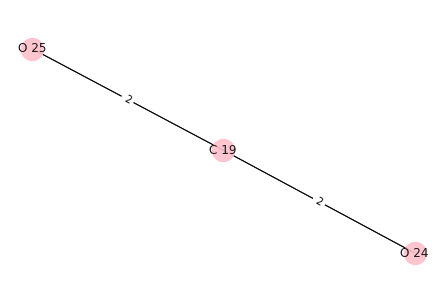

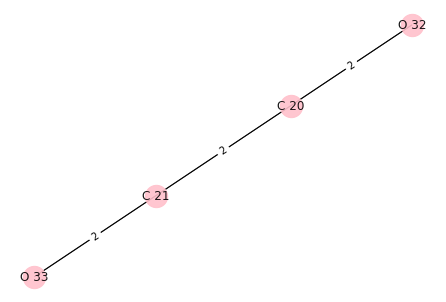

[{C 20, O 32, C 21, O 33}]
11
[{C 16, O 22, H 1, H 2}, {C 17, N 34, H 3}, {N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]
{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
7


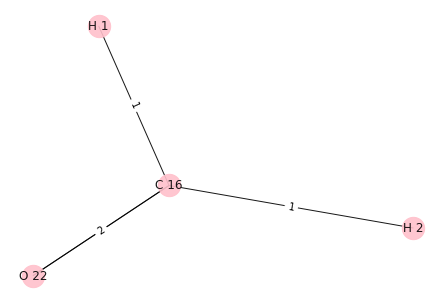

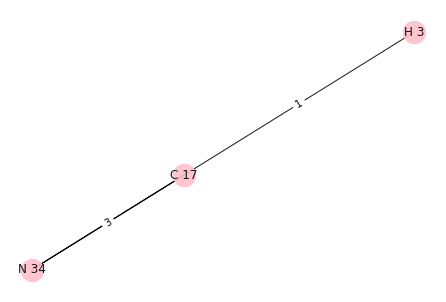

H 2
H 3
C 16 C 17


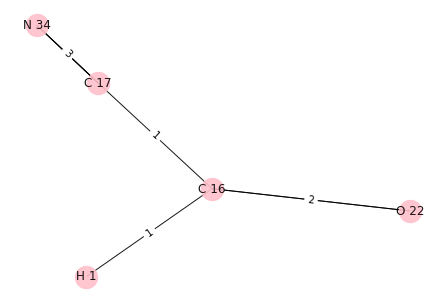

{C 17, O 22, H 1, C 16, N 34}
[C 17, N 34, O 22, C 16]
i: 0
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
H 2 0
O 22 0
H 1 0
C 17 0
N 34 1
C 16 0


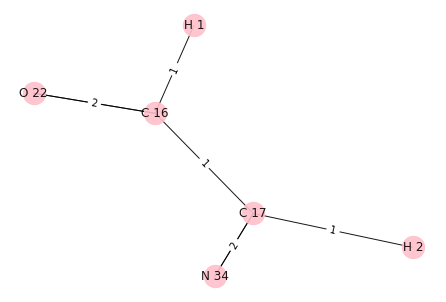

C 17 0
N 34 1
O 22 0
C 16 0
[N 34] H 3


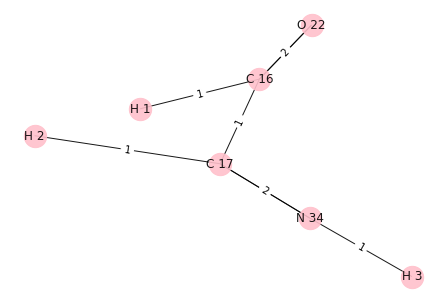

i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
H 2 0
O 22 0
H 1 0
C 17 1
N 34 0
C 16 0


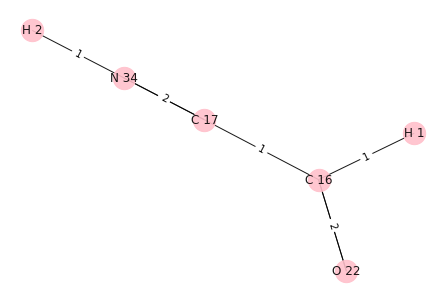

C 17 1
N 34 0
O 22 0
C 16 0
[C 17] H 3


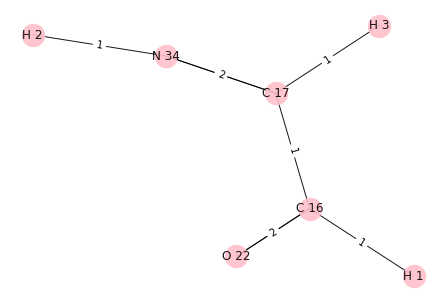

i: 2
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
N 34 0
O 22 0
H 2 0
C 17 0
H 1 0
C 16 1


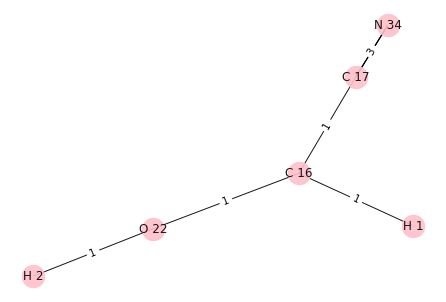

C 17 0
N 34 0
O 22 0
C 16 1
[C 16] H 3


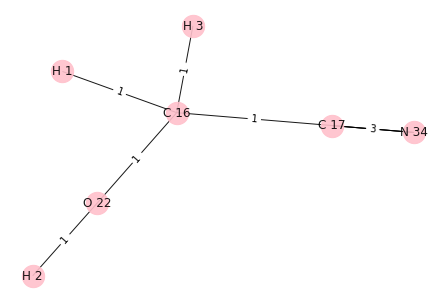

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
C 17 0
N 34 0
H 2 0
O 22 1
C 16 0
H 1 0


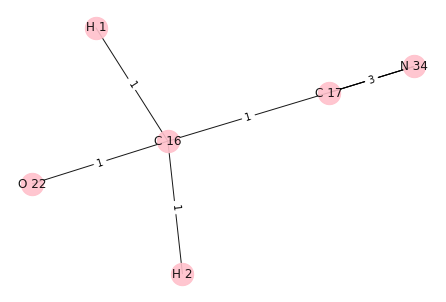

C 17 0
N 34 0
O 22 1
C 16 0
[O 22] H 3


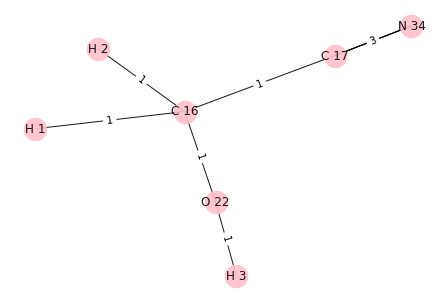

[{N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


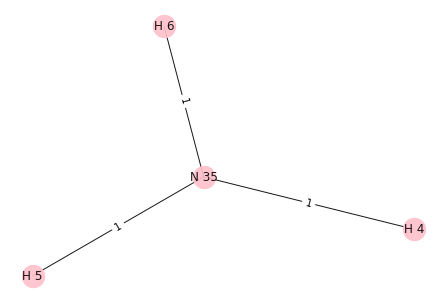

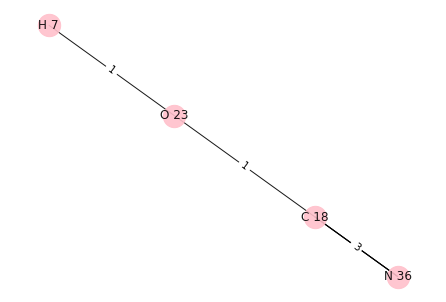

H 6
H 7
N 35 O 23


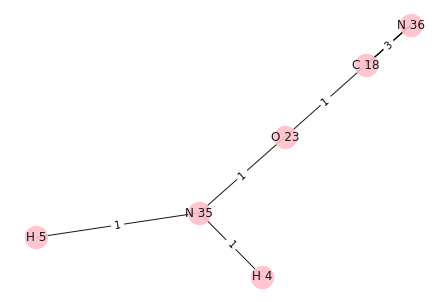

{O 23, H 4, C 18, H 5, N 36, N 35}
[O 23, C 18, N 36, N 35]
i: 0
Removing edge between: O 23 C 18
Adding edge between: O 23 H 6
O 23 0
H 4 0
H 5 0
N 35 0
H 6 0


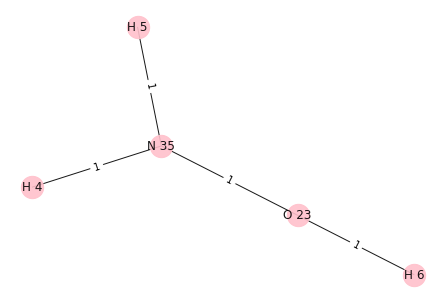

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


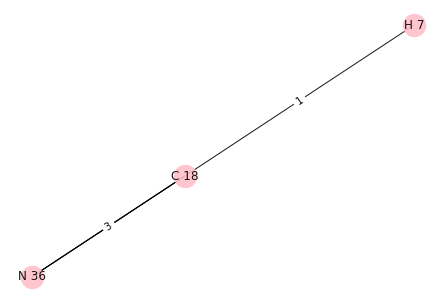

i: 1
Removing edge between: C 18 O 23
Adding edge between: C 18 H 6
H 6 0
C 18 0
N 36 0


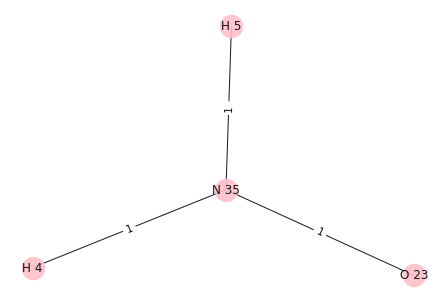

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


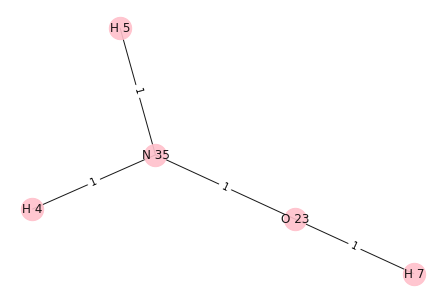

i: 2
Removing edge between: N 36 C 18
Adding edge between: N 36 H 6
O 23 0
H 4 0
C 18 1
N 36 0
N 35 0
H 5 0
H 6 0


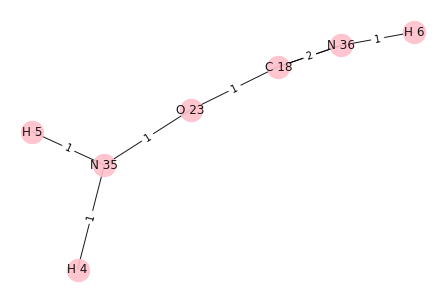

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


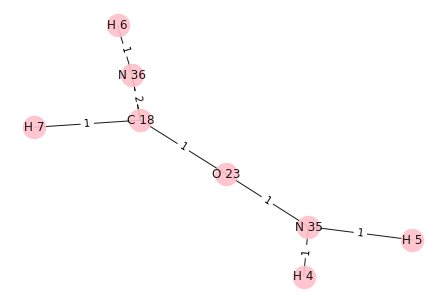

i: 3
Removing edge between: N 35 O 23
Adding edge between: N 35 H 6
H 6 0
H 4 0
H 5 0
N 35 0


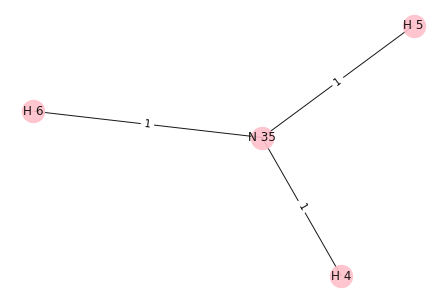

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


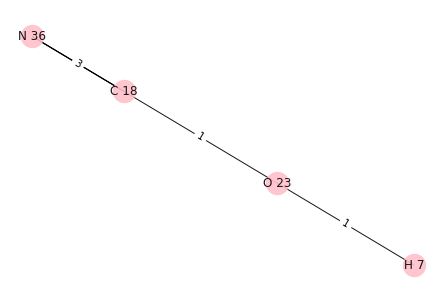

[{H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


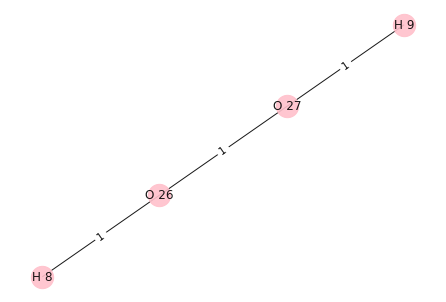

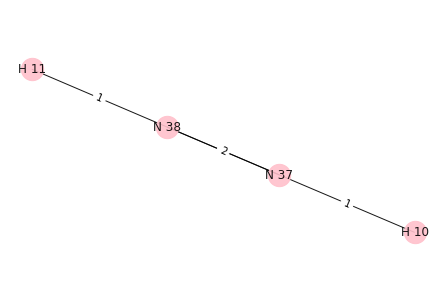

H 8
H 11
O 26 N 38


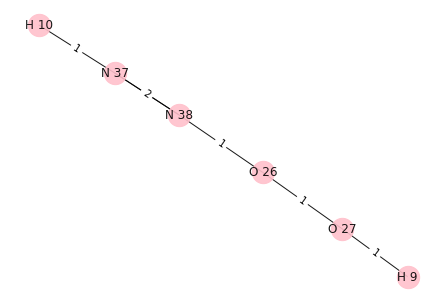

{O 26, N 38, O 27, H 9, H 10, N 37}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 8
O 26 0
H 8 0
N 38 0
H 10 0
N 37 0


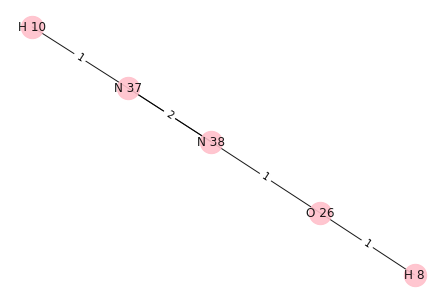

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 11


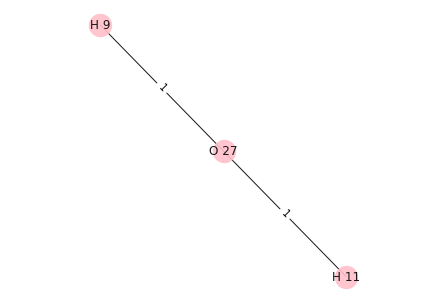

i: 1
Removing edge between: N 38 O 26
Adding edge between: N 38 H 8
H 8 0
N 38 0
N 37 0
H 10 0


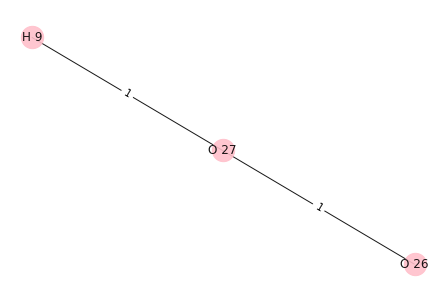

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 11


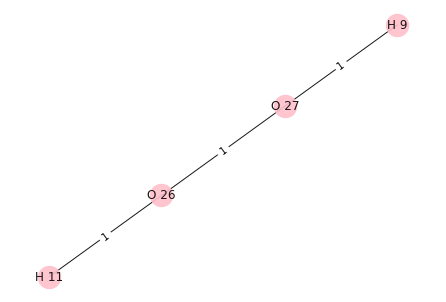

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 8
H 8 0
H 9 0
O 27 0


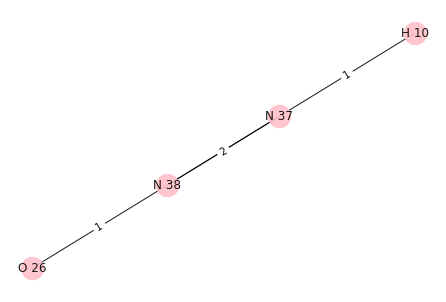

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 11


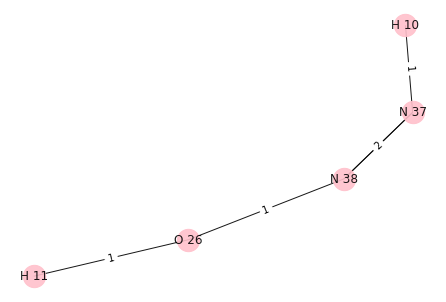

i: 3
Removing edge between: N 37 N 38
Adding edge between: N 37 H 8
O 26 0
H 8 0
N 38 1
O 27 0
H 9 0
H 10 0
N 37 0


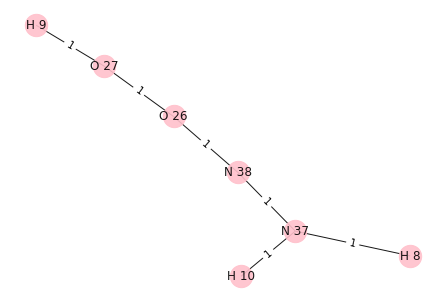

O 26 0
N 38 1
O 27 0
N 37 0
[N 38] H 11


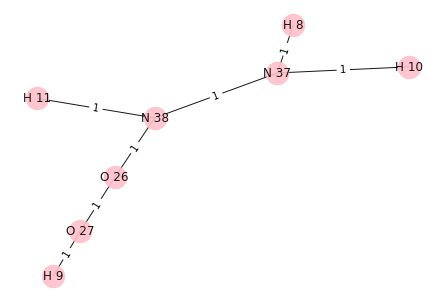

[{O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


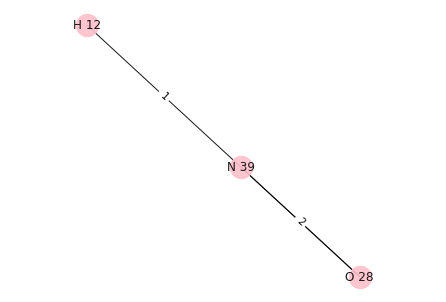

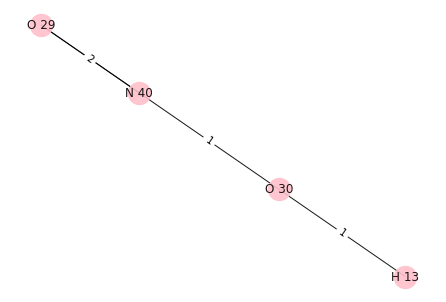

H 12
H 13
N 39 O 30


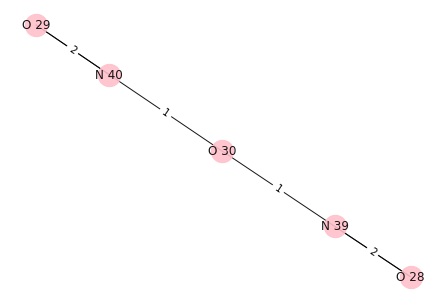

{O 30, N 40, O 28, N 39, O 29}
[O 30, N 40, N 39, O 28, O 29]
i: 0
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
H 12 0
O 30 0


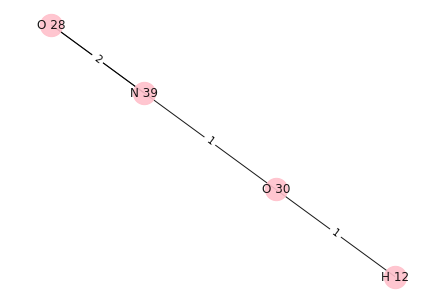

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


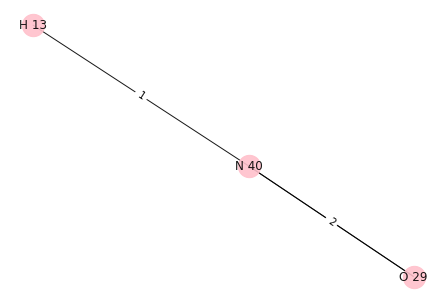

i: 1
Removing edge between: N 40 O 30
Adding edge between: N 40 H 12
O 29 0
H 12 0
N 40 0


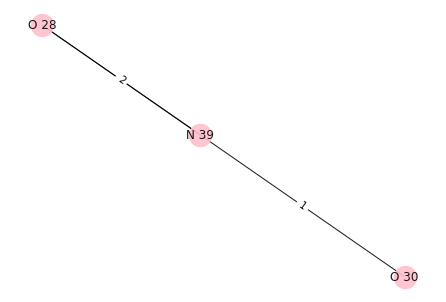

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


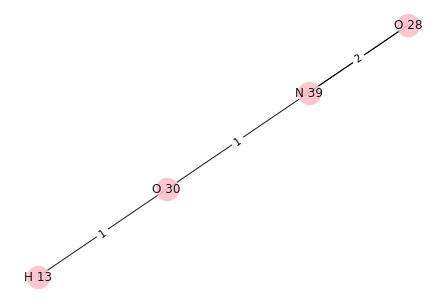

i: 2
Removing edge between: N 39 O 30
Adding edge between: N 39 H 12
O 28 0
H 12 0
N 39 0


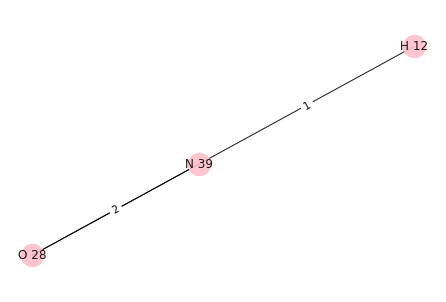

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


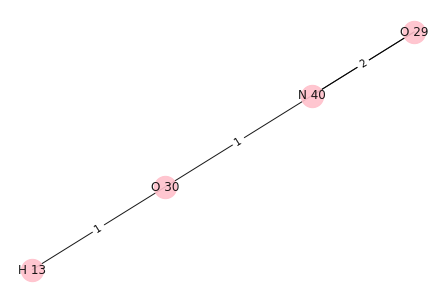

i: 3
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
O 29 0
O 30 0
H 12 0
O 28 0
N 39 1
N 40 0


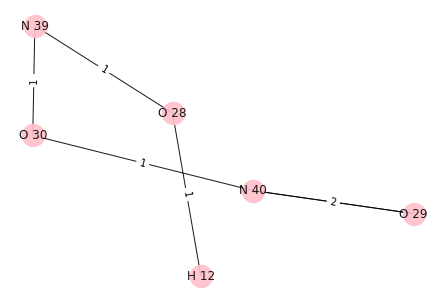

O 30 0
N 40 0
N 39 1
O 28 0
O 29 0
[N 39] H 13


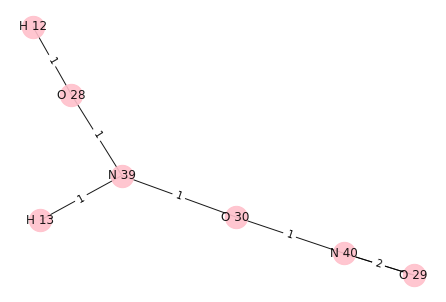

i: 4
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
O 30 0
H 12 0
N 40 1
N 39 0
O 28 0
O 29 0


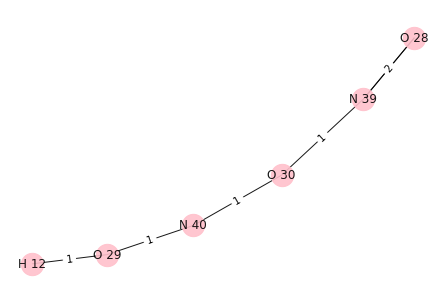

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


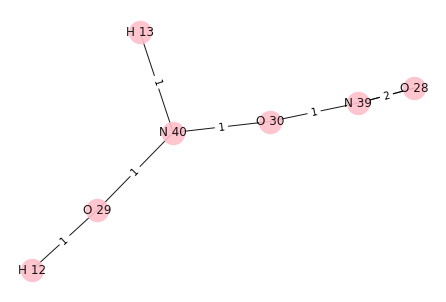

[{O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


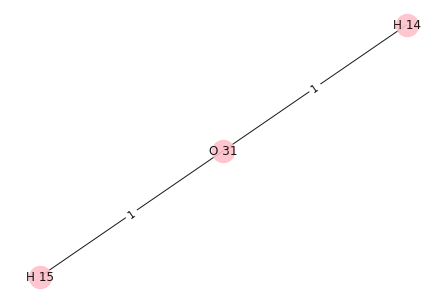

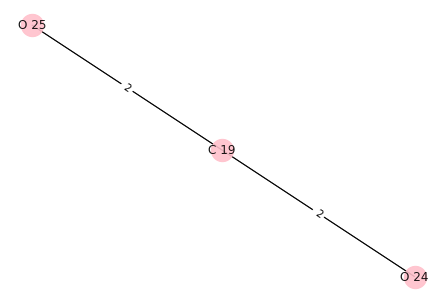

[{O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


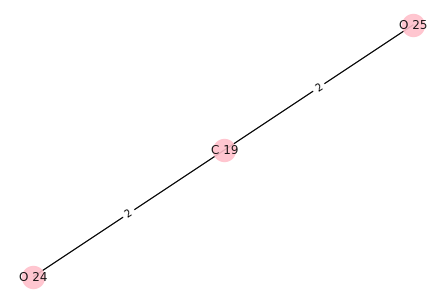

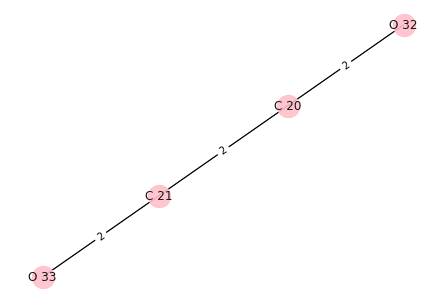

[{C 20, O 32, C 21, O 33}]
11
[{C 16, O 22, H 1, H 2}, {C 17, N 34, H 3}, {N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]
{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
7


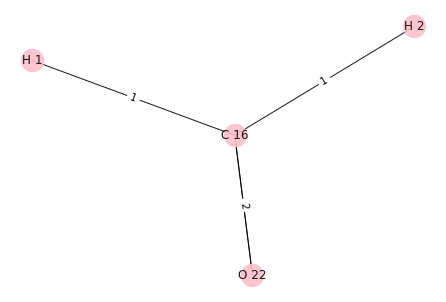

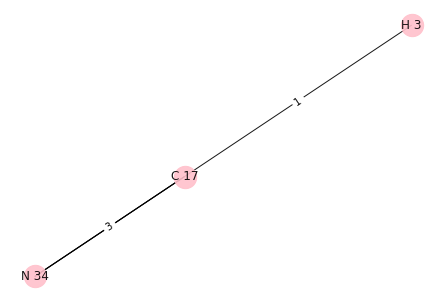

H 1
H 3
C 16 C 17


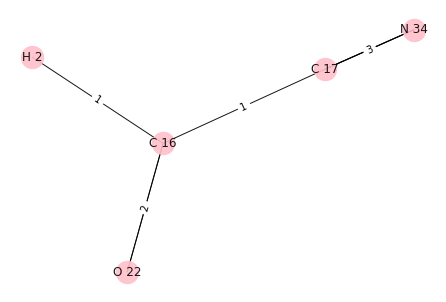

{C 17, O 22, H 2, C 16, N 34}
[C 17, N 34, O 22, C 16]
i: 0
Removing edge between: C 17 N 34
Adding edge between: C 17 H 1
O 22 0
H 2 0
H 1 0
C 17 0
N 34 1
C 16 0


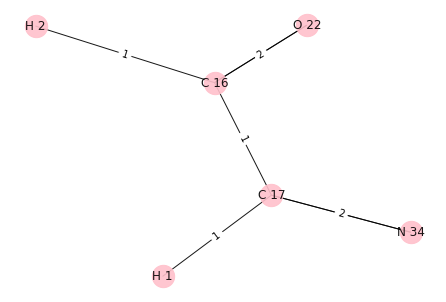

C 17 0
N 34 1
O 22 0
C 16 0
[N 34] H 3


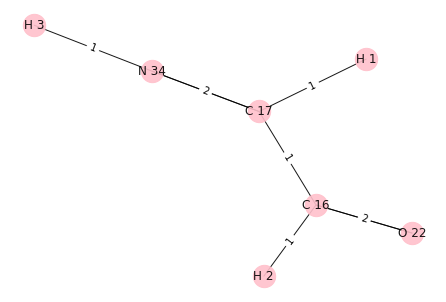

i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 1
O 22 0
H 2 0
H 1 0
C 17 1
N 34 0
C 16 0


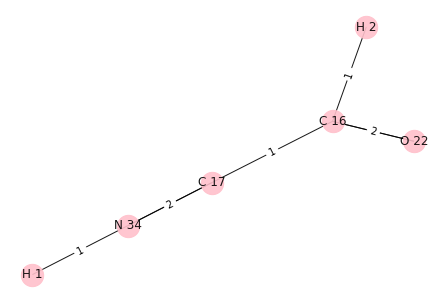

C 17 1
N 34 0
O 22 0
C 16 0
[C 17] H 3


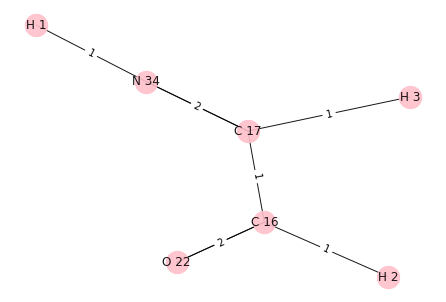

i: 2
Removing edge between: O 22 C 16
Adding edge between: O 22 H 1
N 34 0
O 22 0
H 2 0
C 17 0
H 1 0
C 16 1


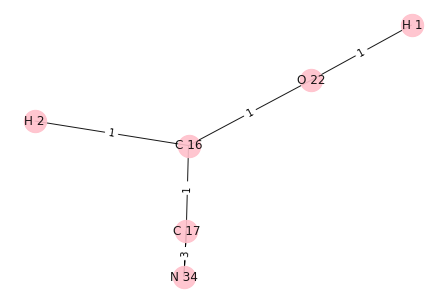

C 17 0
N 34 0
O 22 0
C 16 1
[C 16] H 3


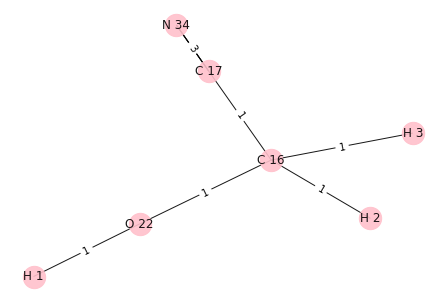

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 1
C 17 0
N 34 0
O 22 1
H 2 0
C 16 0
H 1 0


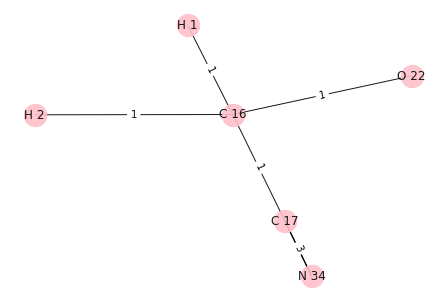

C 17 0
N 34 0
O 22 1
C 16 0
[O 22] H 3


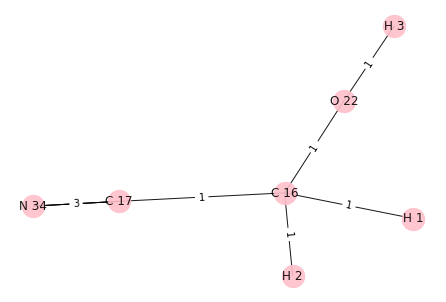

[{N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


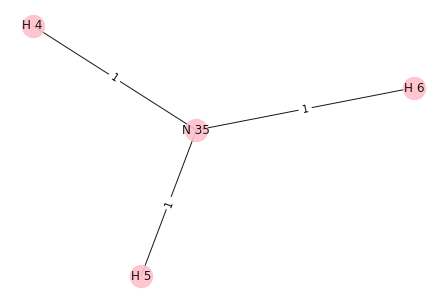

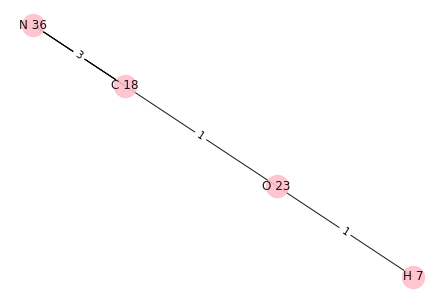

H 6
H 7
N 35 O 23


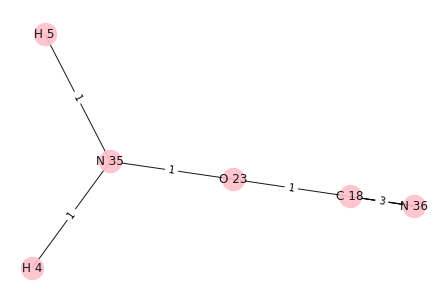

{O 23, H 4, C 18, H 5, N 36, N 35}
[O 23, C 18, N 36, N 35]
i: 0
Removing edge between: O 23 C 18
Adding edge between: O 23 H 6
O 23 0
H 4 0
H 5 0
N 35 0
H 6 0


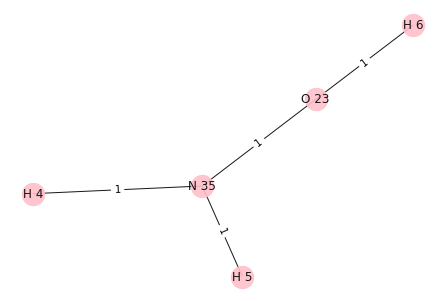

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


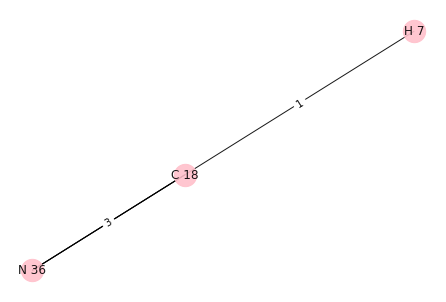

i: 1
Removing edge between: C 18 O 23
Adding edge between: C 18 H 6
H 6 0
C 18 0
N 36 0


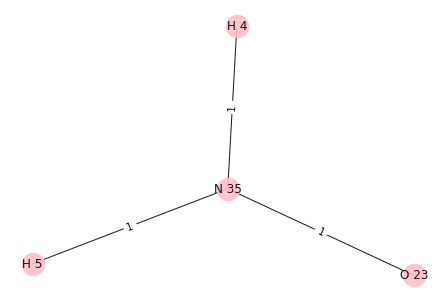

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


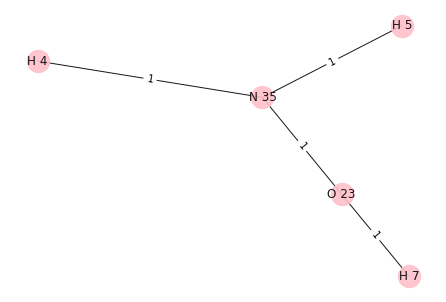

i: 2
Removing edge between: N 36 C 18
Adding edge between: N 36 H 6
O 23 0
H 4 0
C 18 1
N 36 0
N 35 0
H 5 0
H 6 0


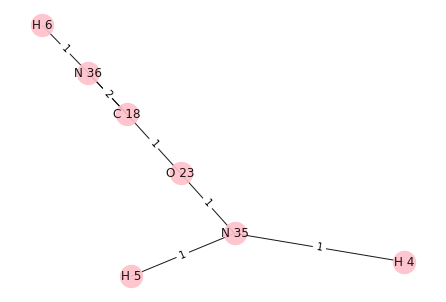

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


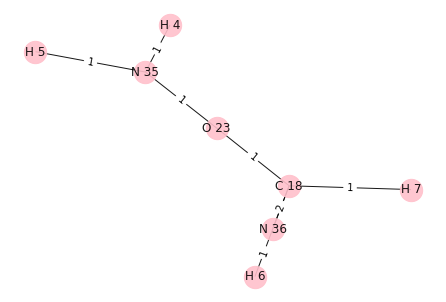

i: 3
Removing edge between: N 35 O 23
Adding edge between: N 35 H 6
H 6 0
H 4 0
H 5 0
N 35 0


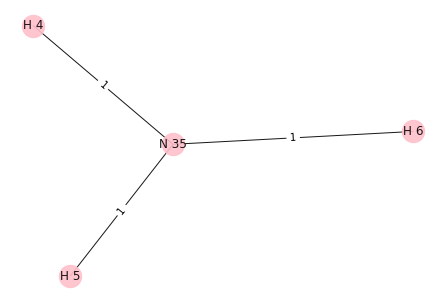

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


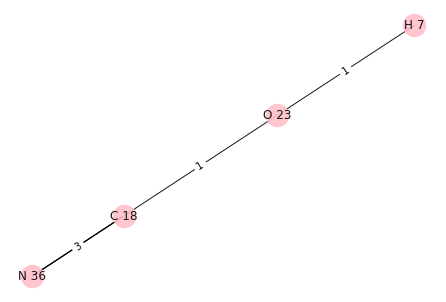

[{H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


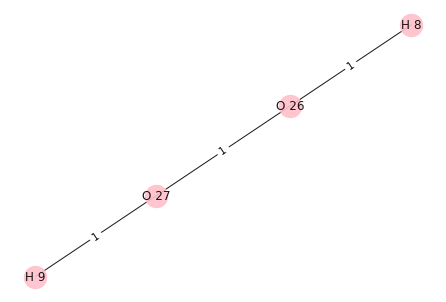

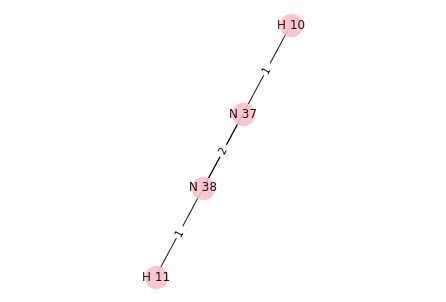

H 8
H 10
O 26 N 37


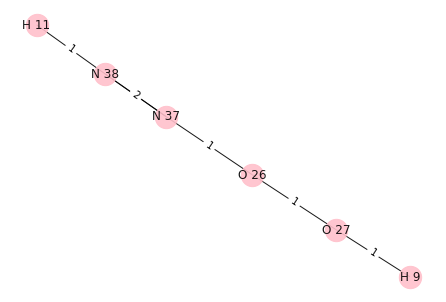

{O 26, N 38, O 27, H 9, N 37, H 11}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 8
O 26 0
H 8 0
N 38 0
N 37 0
H 11 0


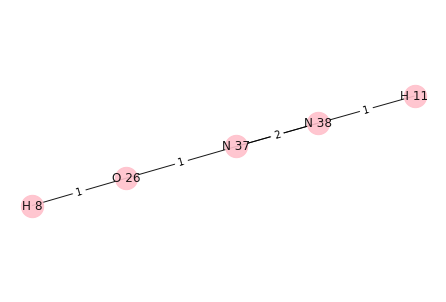

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


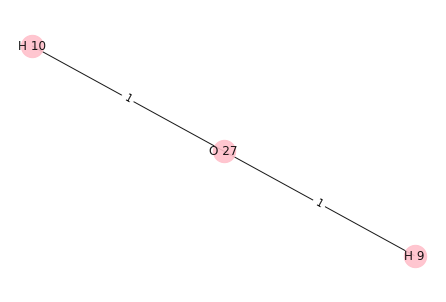

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 8
O 26 0
N 37 1
H 8 0
N 38 0
O 27 0
H 9 0
H 11 0


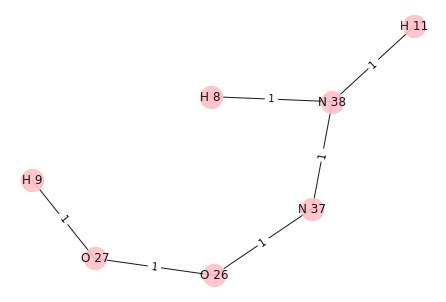

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


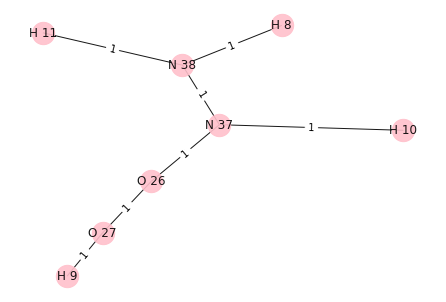

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 8
H 8 0
H 9 0
O 27 0


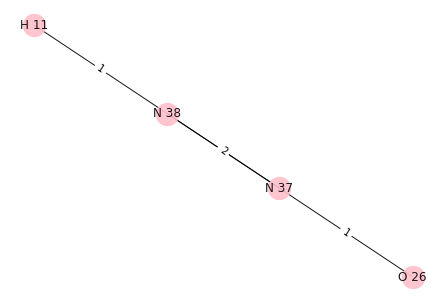

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


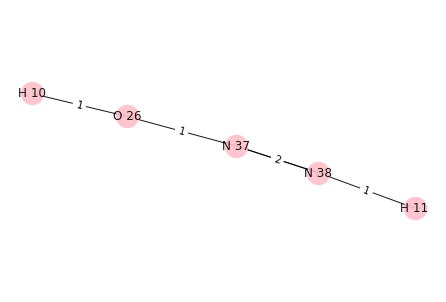

i: 3
Removing edge between: N 37 O 26
Adding edge between: N 37 H 8
H 8 0
N 38 0
N 37 0
H 11 0


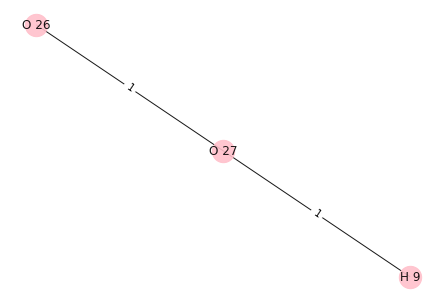

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


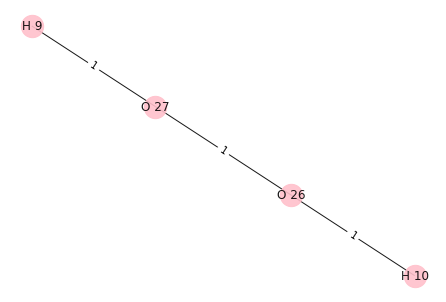

[{O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


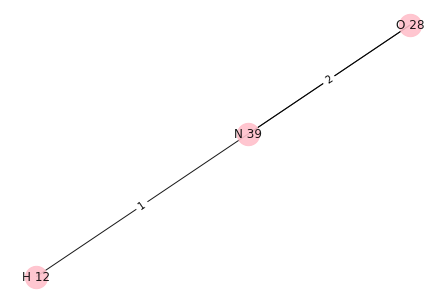

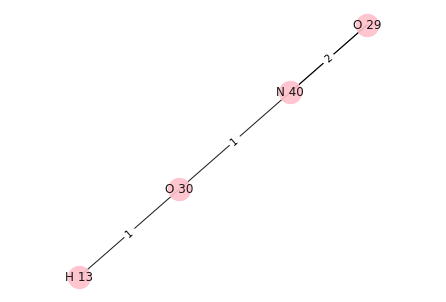

H 12
H 13
N 39 O 30


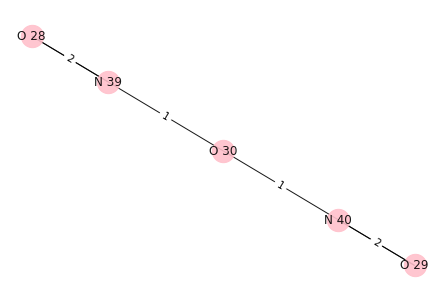

{O 30, N 40, O 28, N 39, O 29}
[O 30, N 40, N 39, O 28, O 29]
i: 0
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
H 12 0
O 30 0


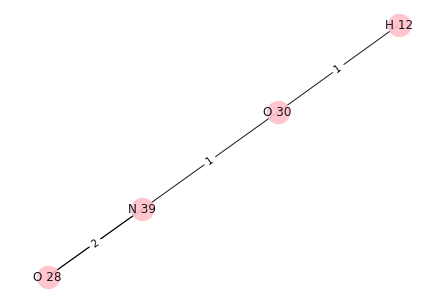

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


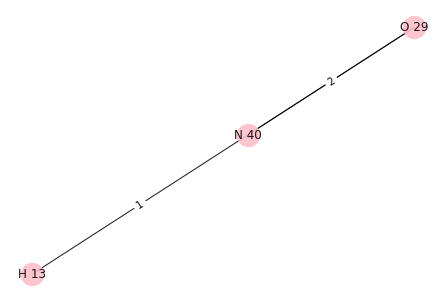

i: 1
Removing edge between: N 40 O 30
Adding edge between: N 40 H 12
O 29 0
H 12 0
N 40 0


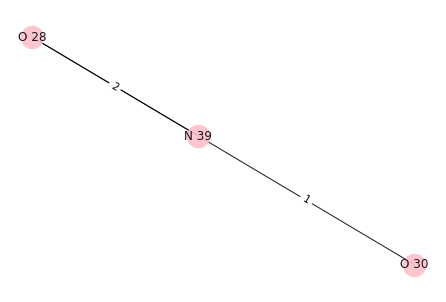

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


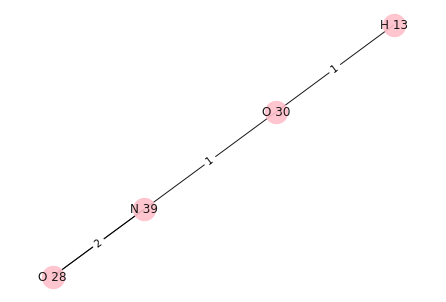

i: 2
Removing edge between: N 39 O 30
Adding edge between: N 39 H 12
O 28 0
H 12 0
N 39 0


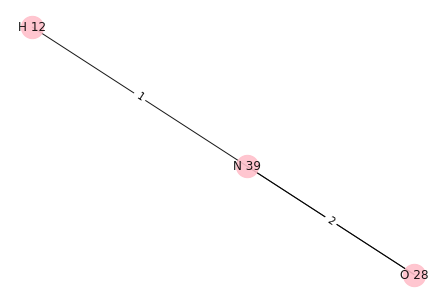

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


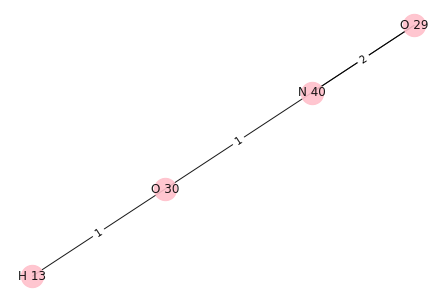

i: 3
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
O 29 0
O 30 0
H 12 0
O 28 0
N 39 1
N 40 0


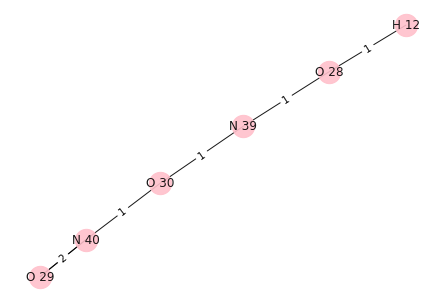

O 30 0
N 40 0
N 39 1
O 28 0
O 29 0
[N 39] H 13


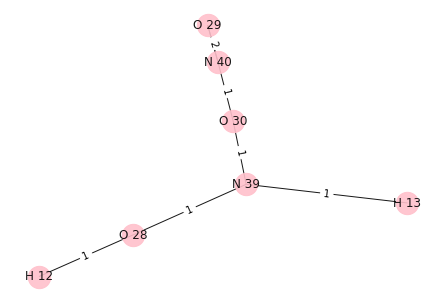

i: 4
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
O 30 0
H 12 0
N 40 1
N 39 0
O 28 0
O 29 0


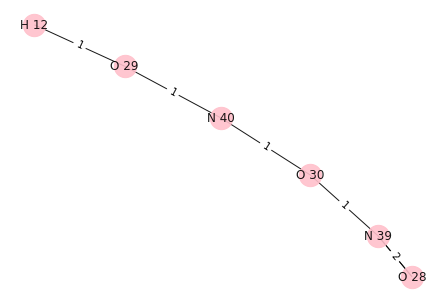

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


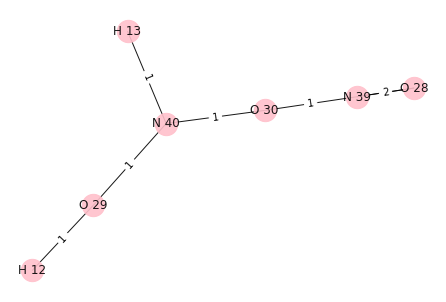

[{O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


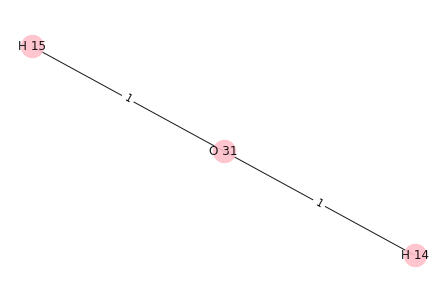

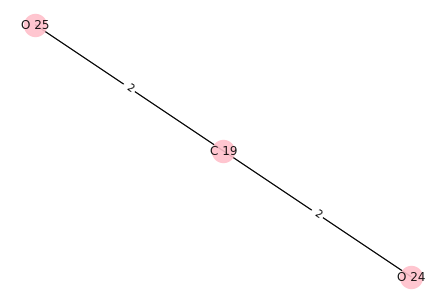

[{O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


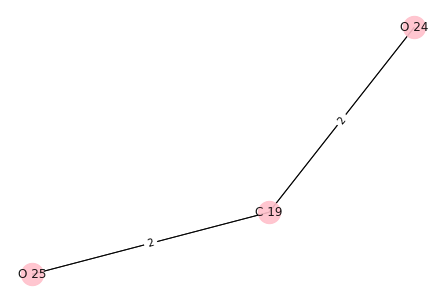

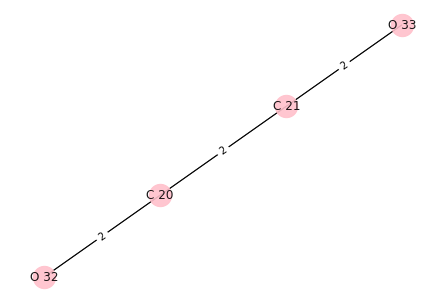

[{C 20, O 32, C 21, O 33}]
11
[{C 16, O 22, H 1, H 2}, {C 17, N 34, H 3}, {N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]
{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
7


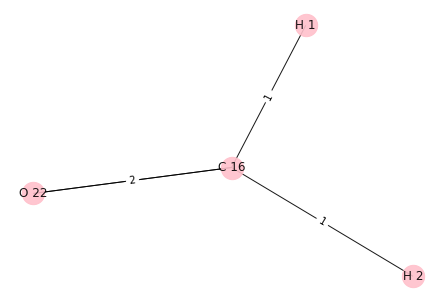

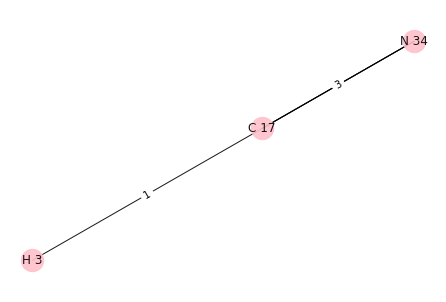

H 2
H 3
C 16 C 17


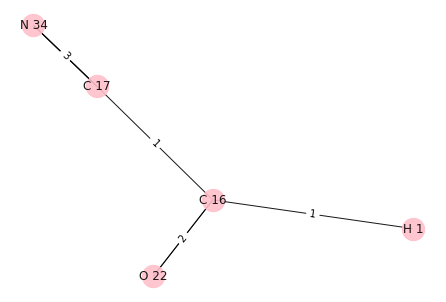

{C 17, O 22, H 1, C 16, N 34}
[C 17, N 34, O 22, C 16]
i: 0
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
H 2 0
O 22 0
H 1 0
C 17 0
N 34 1
C 16 0


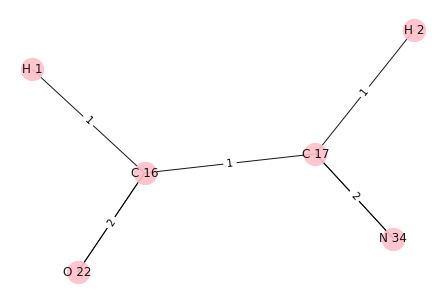

C 17 0
N 34 1
O 22 0
C 16 0
[N 34] H 3


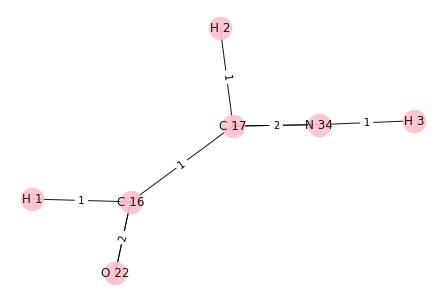

i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
H 2 0
O 22 0
H 1 0
C 17 1
N 34 0
C 16 0


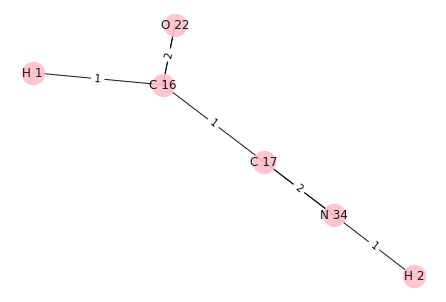

C 17 1
N 34 0
O 22 0
C 16 0
[C 17] H 3


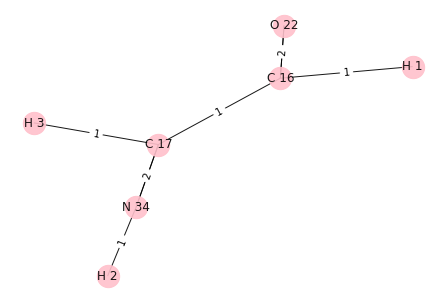

i: 2
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
N 34 0
O 22 0
H 2 0
C 17 0
H 1 0
C 16 1


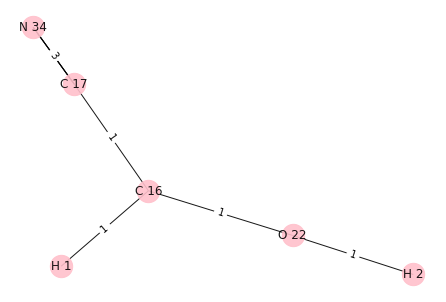

C 17 0
N 34 0
O 22 0
C 16 1
[C 16] H 3


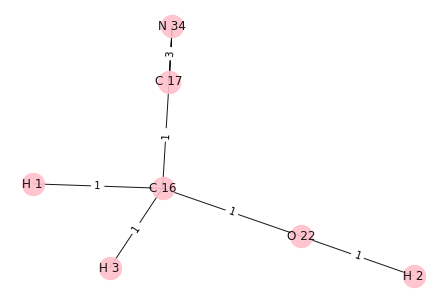

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
C 17 0
N 34 0
H 2 0
O 22 1
C 16 0
H 1 0


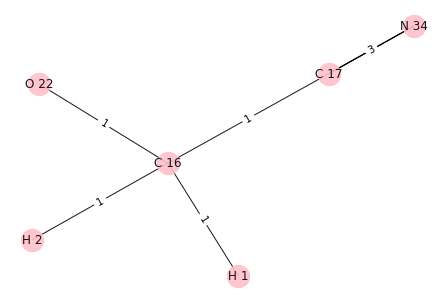

C 17 0
N 34 0
O 22 1
C 16 0
[O 22] H 3


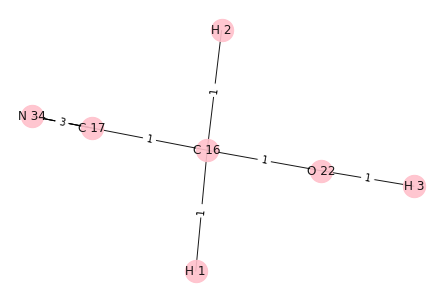

[{N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


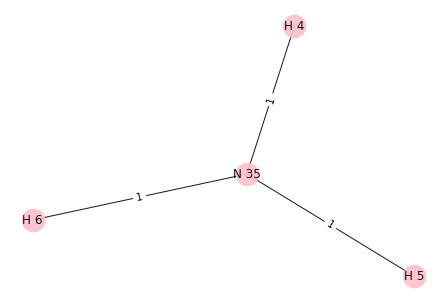

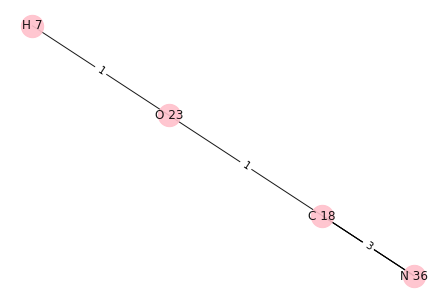

H 5
H 7
N 35 O 23


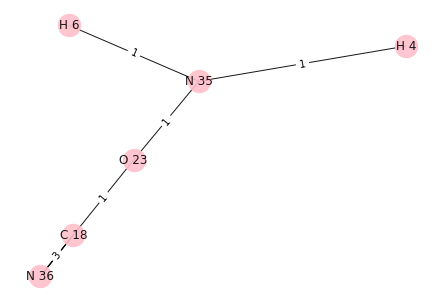

{O 23, H 4, H 6, C 18, N 36, N 35}
[O 23, C 18, N 36, N 35]
i: 0
Removing edge between: O 23 C 18
Adding edge between: O 23 H 5
O 23 0
H 4 0
H 5 0
N 35 0
H 6 0


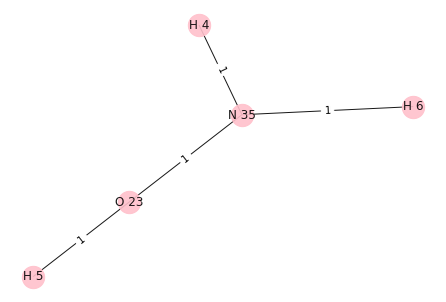

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


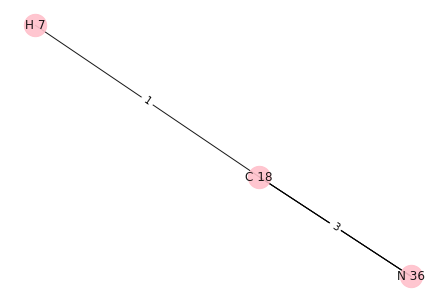

i: 1
Removing edge between: C 18 O 23
Adding edge between: C 18 H 5
C 18 0
H 5 0
N 36 0


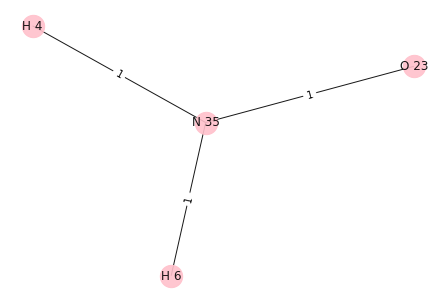

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


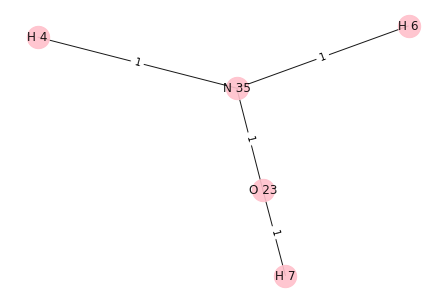

i: 2
Removing edge between: N 36 C 18
Adding edge between: N 36 H 5
O 23 0
H 4 0
H 6 0
C 18 1
H 5 0
N 36 0
N 35 0


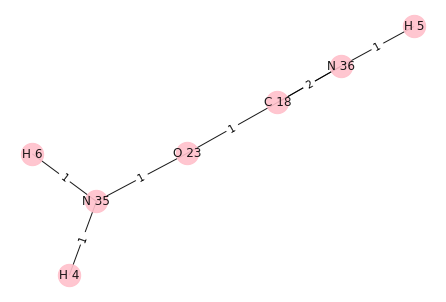

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


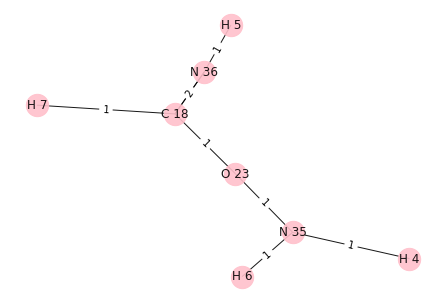

i: 3
Removing edge between: N 35 O 23
Adding edge between: N 35 H 5
N 35 0
H 6 0
H 5 0
H 4 0


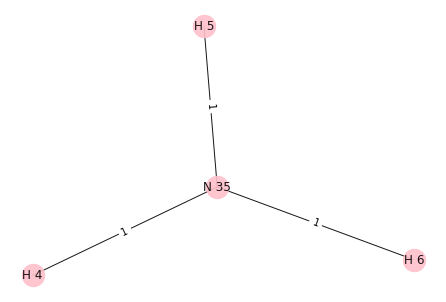

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


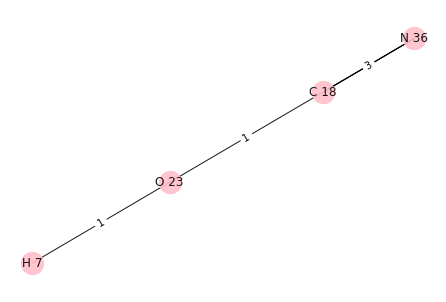

[{H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


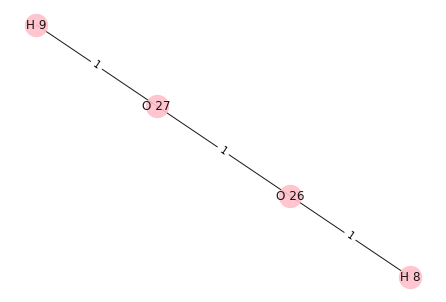

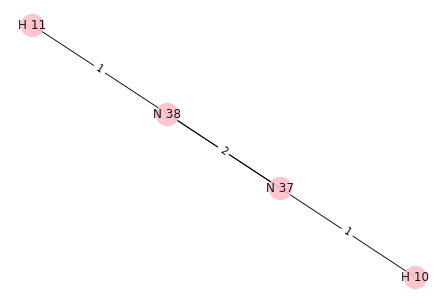

H 9
H 11
O 27 N 38


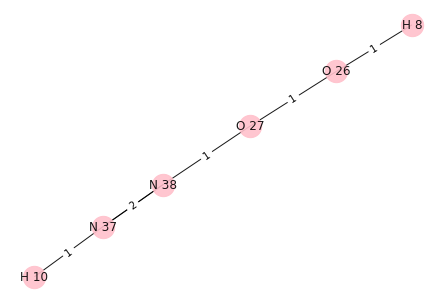

{O 26, N 38, H 8, O 27, H 10, N 37}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
H 9 0
H 8 0
O 26 0


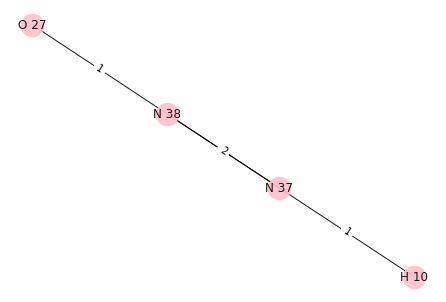

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 11


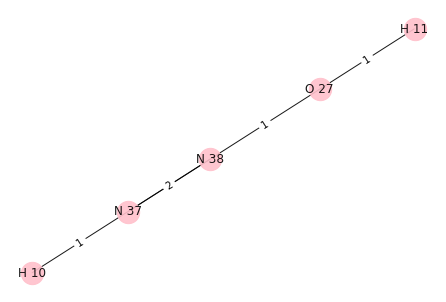

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
N 38 0
H 8 0
O 27 0
H 9 0
H 10 0
N 37 1


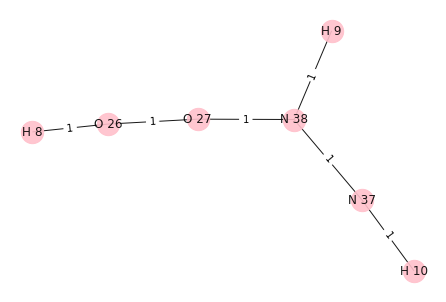

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 11


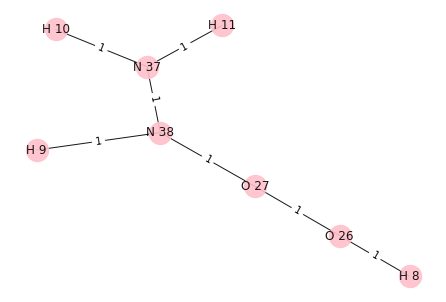

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
N 38 0
O 27 0
H 9 0
H 10 0
N 37 0


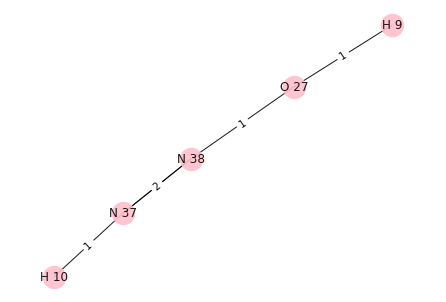

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 11


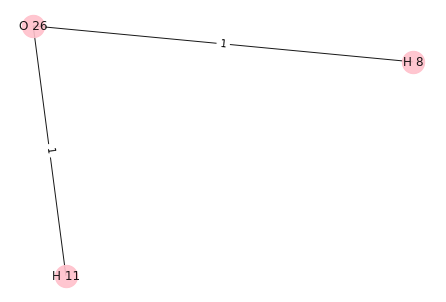

i: 3
Removing edge between: N 37 N 38
Adding edge between: N 37 H 9
O 26 0
N 38 1
H 8 0
O 27 0
H 9 0
H 10 0
N 37 0


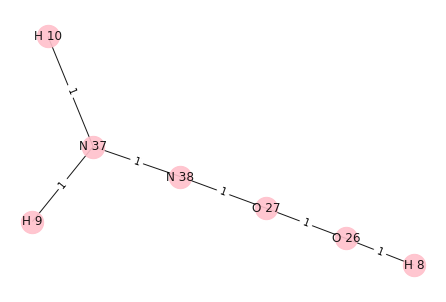

O 26 0
N 38 1
O 27 0
N 37 0
[N 38] H 11


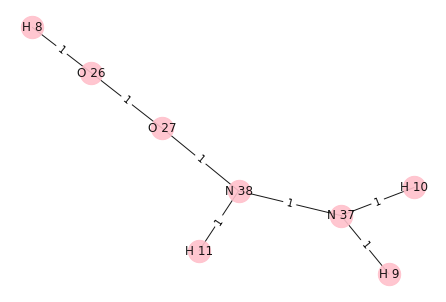

[{O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


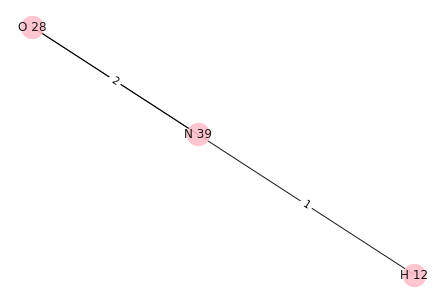

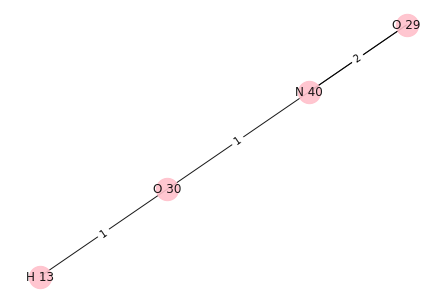

H 12
H 13
N 39 O 30


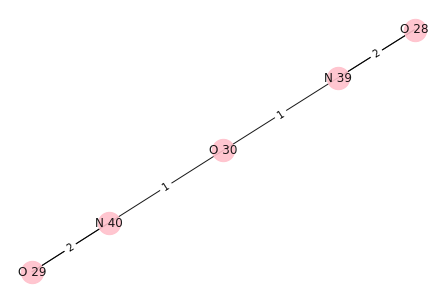

{O 30, N 40, O 28, N 39, O 29}
[O 30, N 40, N 39, O 28, O 29]
i: 0
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
H 12 0
O 30 0


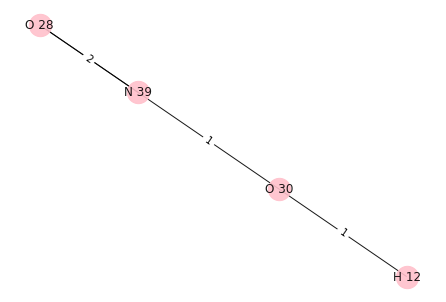

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


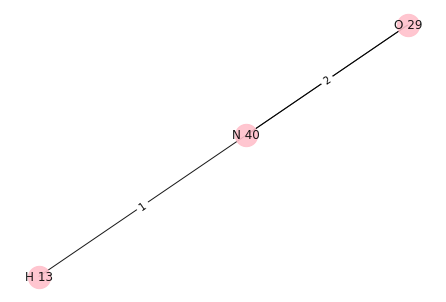

i: 1
Removing edge between: N 40 O 30
Adding edge between: N 40 H 12
O 29 0
H 12 0
N 40 0


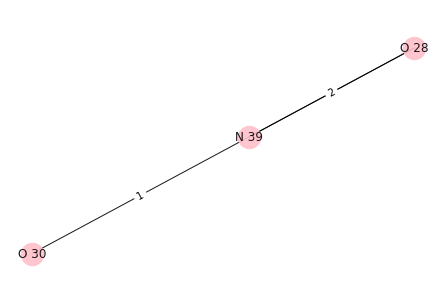

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


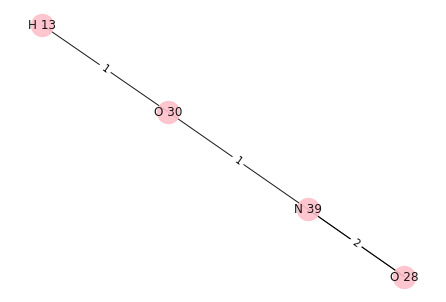

i: 2
Removing edge between: N 39 O 30
Adding edge between: N 39 H 12
O 28 0
H 12 0
N 39 0


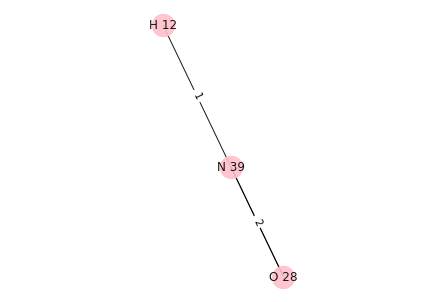

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


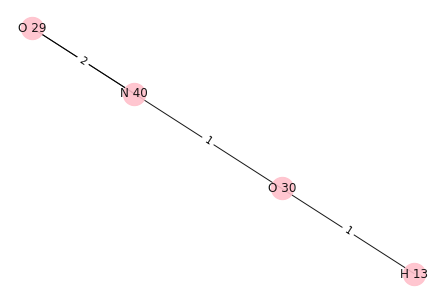

i: 3
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
O 29 0
O 30 0
H 12 0
O 28 0
N 39 1
N 40 0


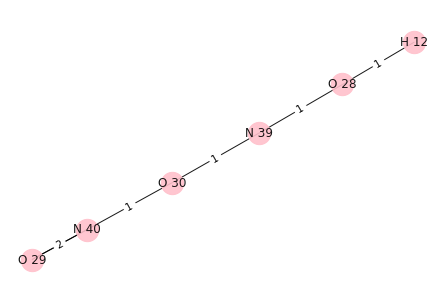

O 30 0
N 40 0
N 39 1
O 28 0
O 29 0
[N 39] H 13


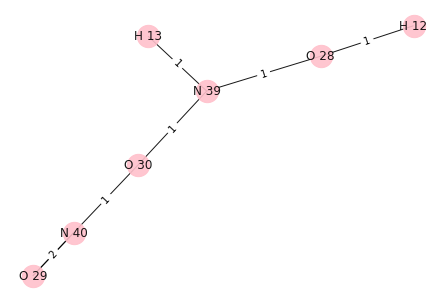

i: 4
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
O 30 0
H 12 0
N 40 1
N 39 0
O 28 0
O 29 0


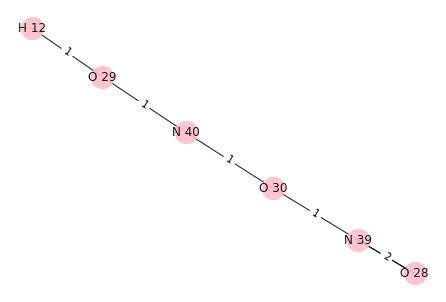

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


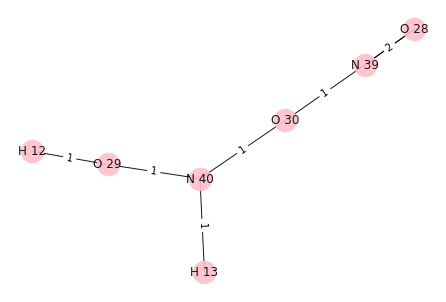

[{O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


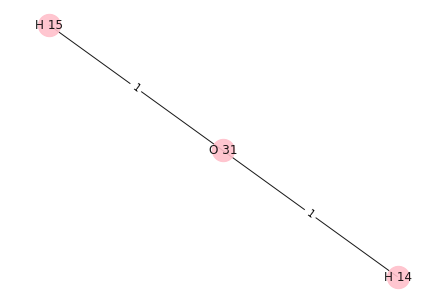

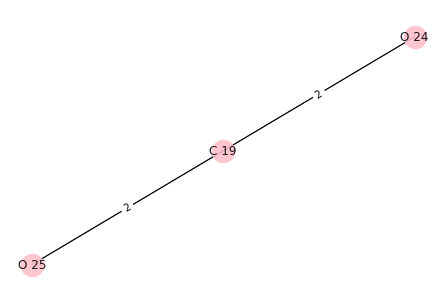

[{O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


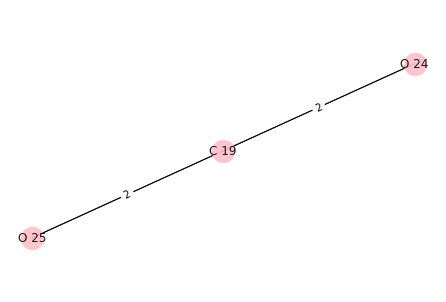

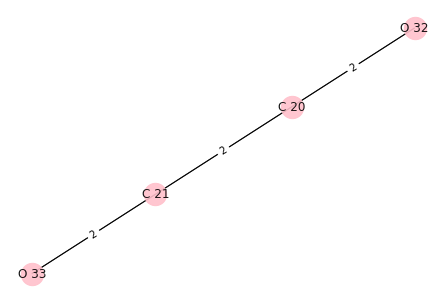

[{C 20, O 32, C 21, O 33}]
11
[{C 16, O 22, H 1, H 2}, {C 17, N 34, H 3}, {N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]
{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
7


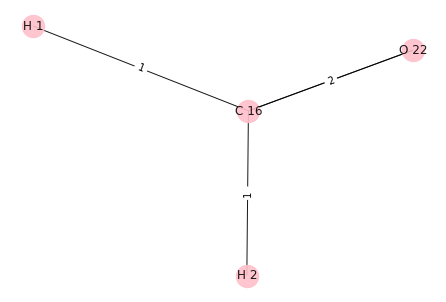

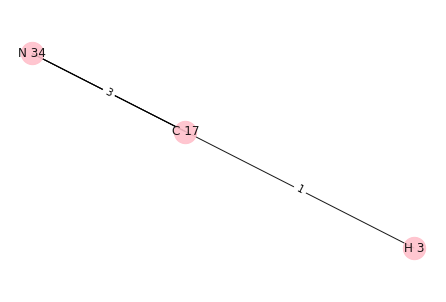

H 1
H 3
C 16 C 17


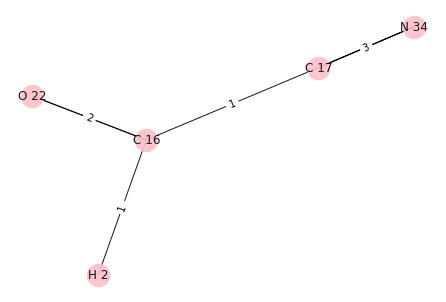

{C 17, O 22, H 2, C 16, N 34}
[C 17, N 34, O 22, C 16]
i: 0
Removing edge between: C 17 N 34
Adding edge between: C 17 H 1
O 22 0
H 2 0
H 1 0
C 17 0
N 34 1
C 16 0


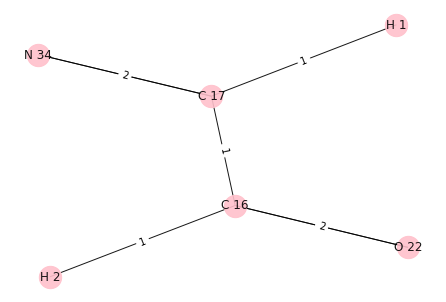

C 17 0
N 34 1
O 22 0
C 16 0
[N 34] H 3


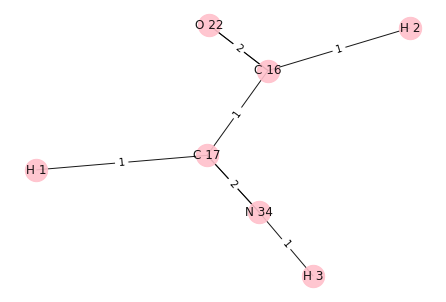

i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 1
O 22 0
H 2 0
H 1 0
C 17 1
N 34 0
C 16 0


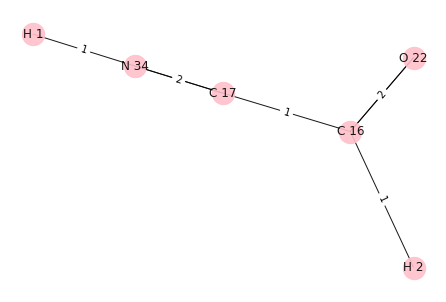

C 17 1
N 34 0
O 22 0
C 16 0
[C 17] H 3


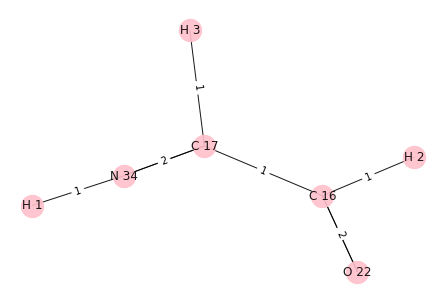

i: 2
Removing edge between: O 22 C 16
Adding edge between: O 22 H 1
N 34 0
O 22 0
H 2 0
C 17 0
H 1 0
C 16 1


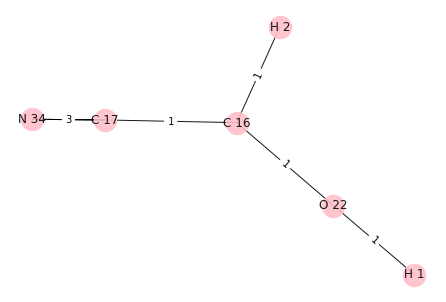

C 17 0
N 34 0
O 22 0
C 16 1
[C 16] H 3


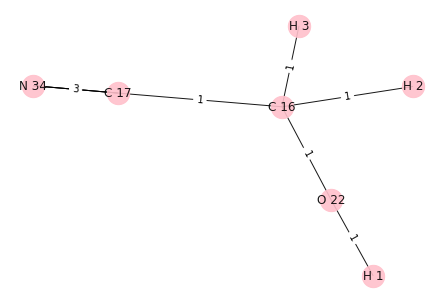

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 1
C 17 0
N 34 0
O 22 1
H 2 0
C 16 0
H 1 0


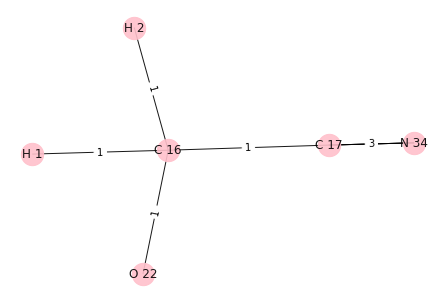

C 17 0
N 34 0
O 22 1
C 16 0
[O 22] H 3


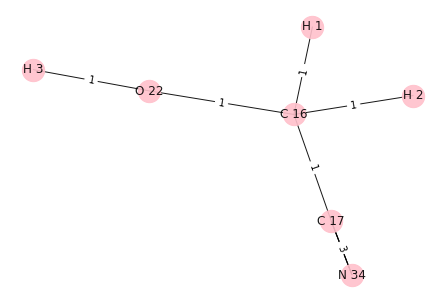

[{N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


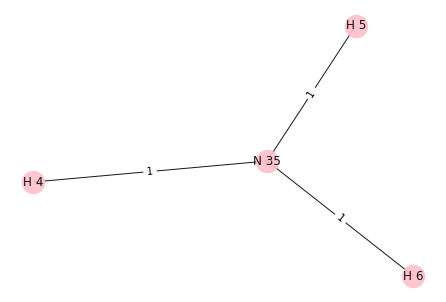

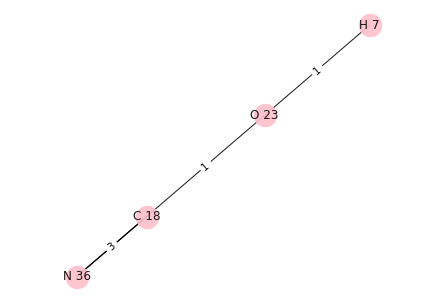

H 5
H 7
N 35 O 23


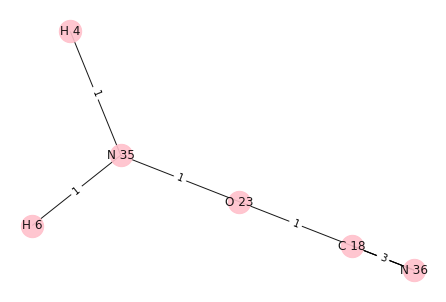

{O 23, H 4, H 6, C 18, N 36, N 35}
[O 23, C 18, N 36, N 35]
i: 0
Removing edge between: O 23 C 18
Adding edge between: O 23 H 5
O 23 0
H 4 0
H 5 0
N 35 0
H 6 0


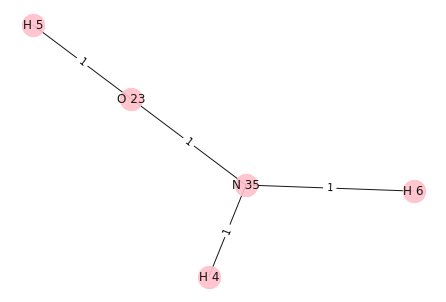

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


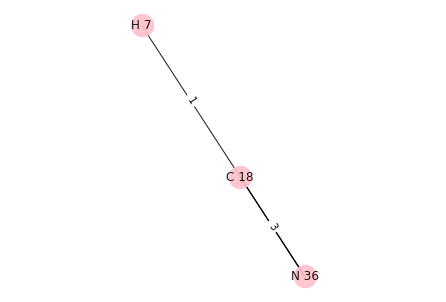

i: 1
Removing edge between: C 18 O 23
Adding edge between: C 18 H 5
C 18 0
H 5 0
N 36 0


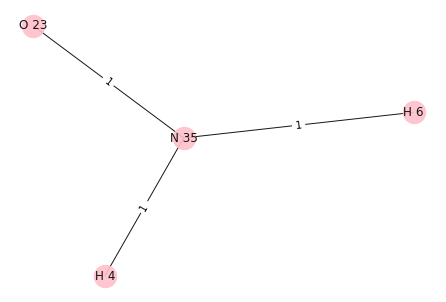

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


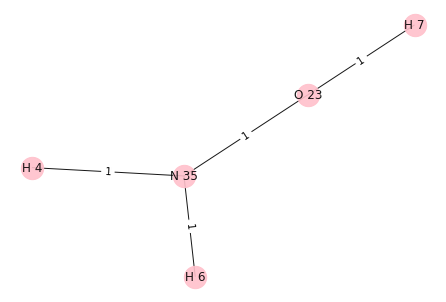

i: 2
Removing edge between: N 36 C 18
Adding edge between: N 36 H 5
O 23 0
H 4 0
H 6 0
C 18 1
H 5 0
N 36 0
N 35 0


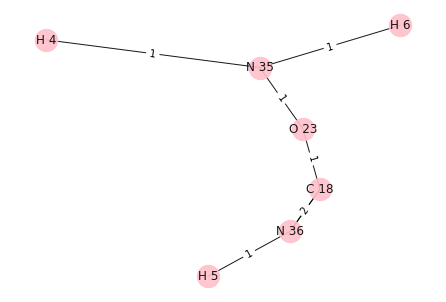

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


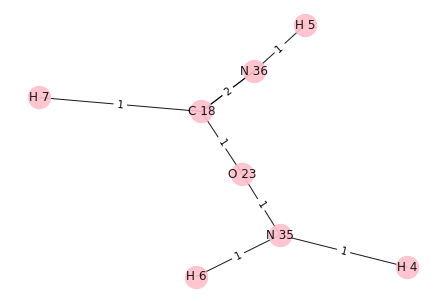

i: 3
Removing edge between: N 35 O 23
Adding edge between: N 35 H 5
N 35 0
H 6 0
H 5 0
H 4 0


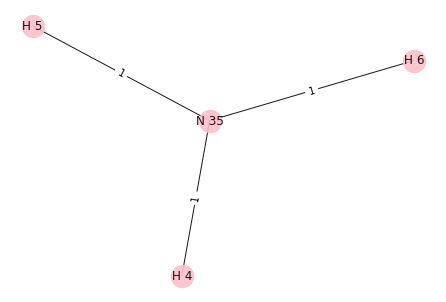

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


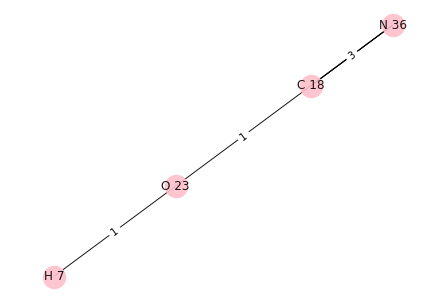

[{H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


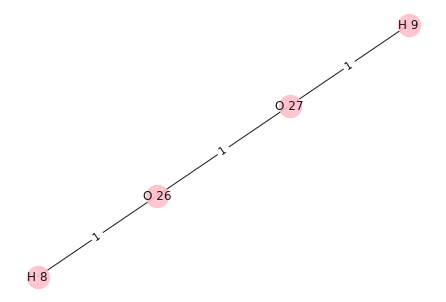

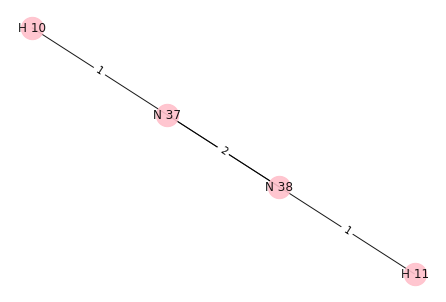

H 9
H 10
O 27 N 37


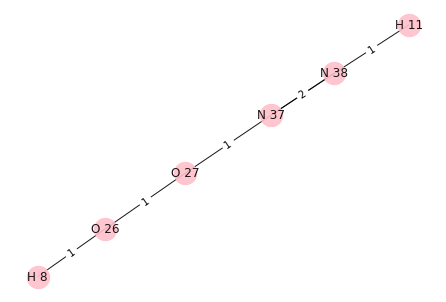

{O 26, H 8, N 38, O 27, N 37, H 11}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 9
H 9 0
H 8 0
O 26 0


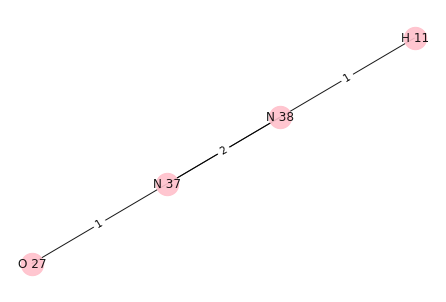

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 10


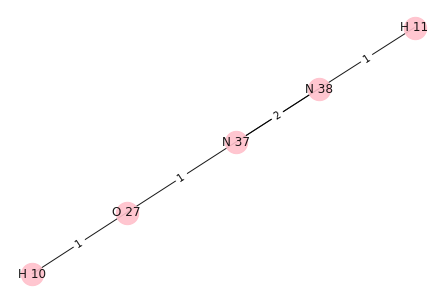

i: 1
Removing edge between: N 38 N 37
Adding edge between: N 38 H 9
O 26 0
N 37 1
N 38 0
H 8 0
O 27 0
H 9 0
H 11 0


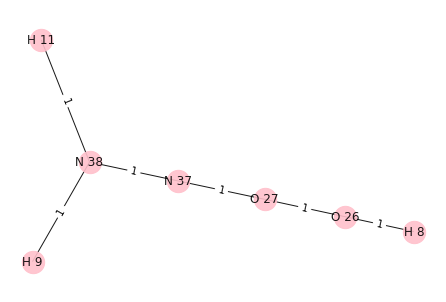

O 26 0
N 38 0
O 27 0
N 37 1
[N 37] H 10


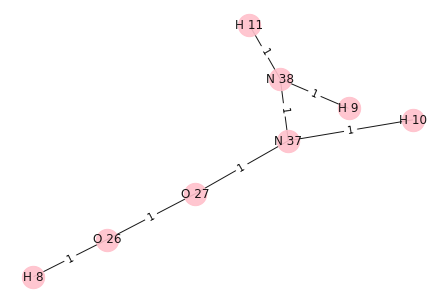

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 9
N 38 0
O 27 0
H 9 0
N 37 0
H 11 0


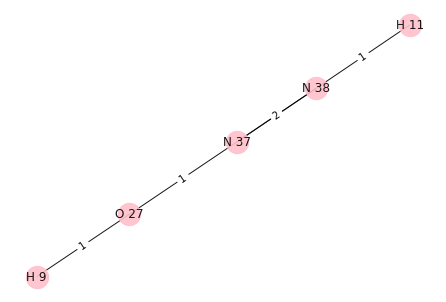

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 10


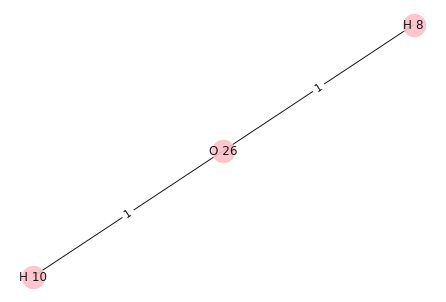

i: 3
Removing edge between: N 37 N 38
Adding edge between: N 37 H 9
O 26 0
N 38 1
H 8 0
O 27 0
H 9 0
N 37 0
H 11 0


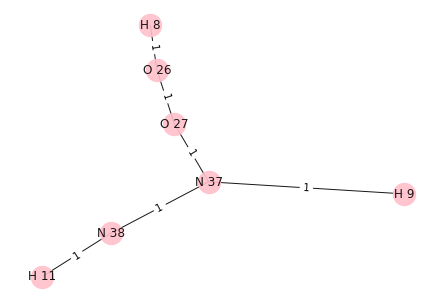

O 26 0
N 38 1
O 27 0
N 37 0
[N 38] H 10


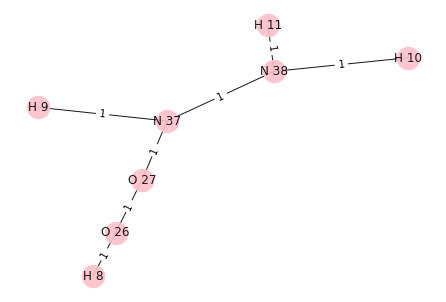

[{O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


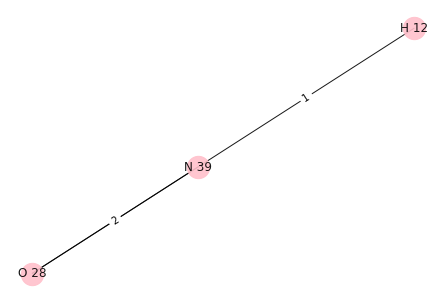

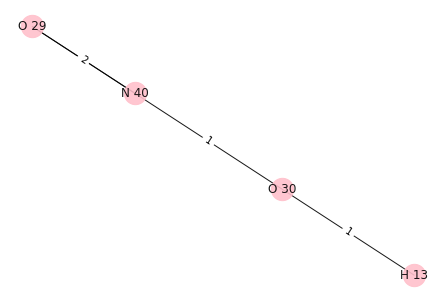

H 12
H 13
N 39 O 30


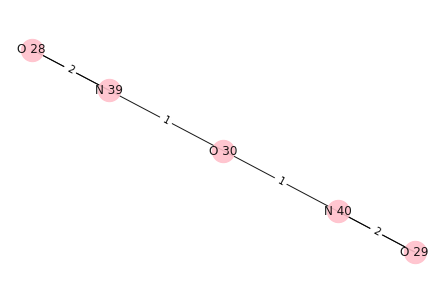

{O 30, N 40, O 28, N 39, O 29}
[O 30, N 40, N 39, O 28, O 29]
i: 0
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
H 12 0
O 30 0


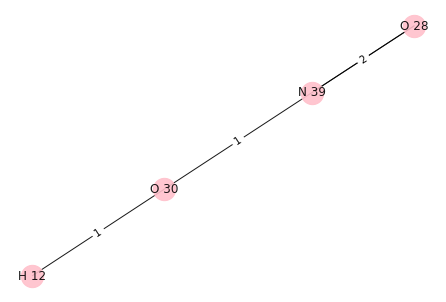

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


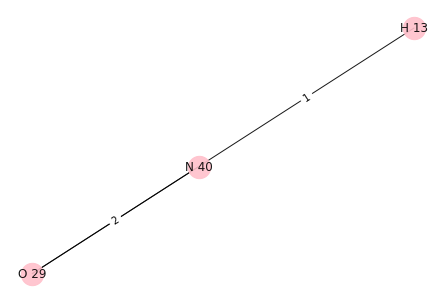

i: 1
Removing edge between: N 40 O 30
Adding edge between: N 40 H 12
O 29 0
H 12 0
N 40 0


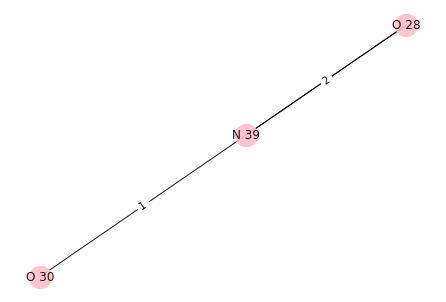

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


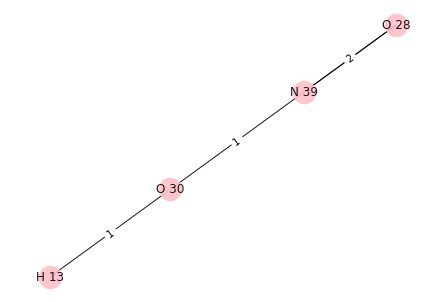

i: 2
Removing edge between: N 39 O 30
Adding edge between: N 39 H 12
O 28 0
H 12 0
N 39 0


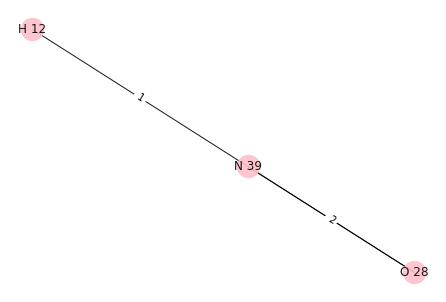

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


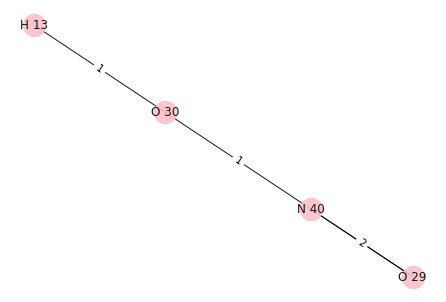

i: 3
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
O 29 0
O 30 0
H 12 0
O 28 0
N 39 1
N 40 0


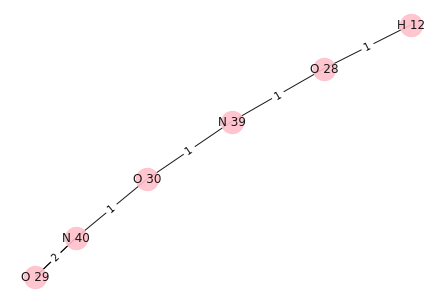

O 30 0
N 40 0
N 39 1
O 28 0
O 29 0
[N 39] H 13


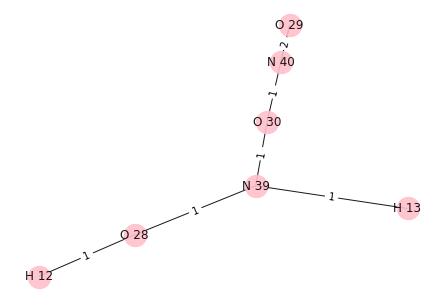

i: 4
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
O 30 0
H 12 0
N 40 1
N 39 0
O 28 0
O 29 0


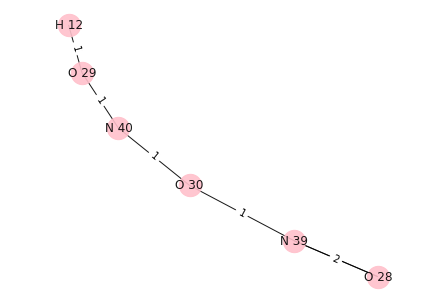

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


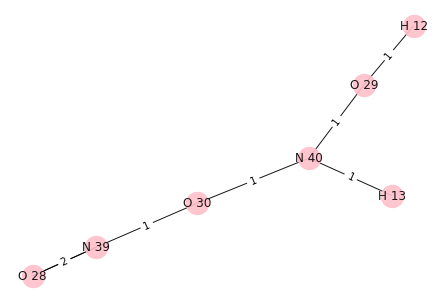

[{O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


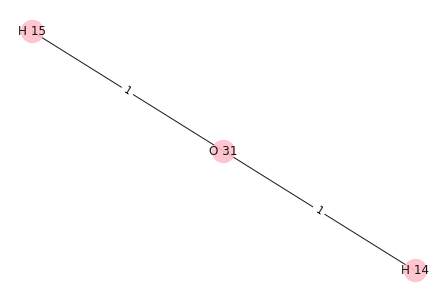

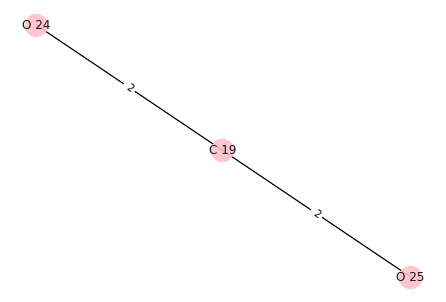

[{O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


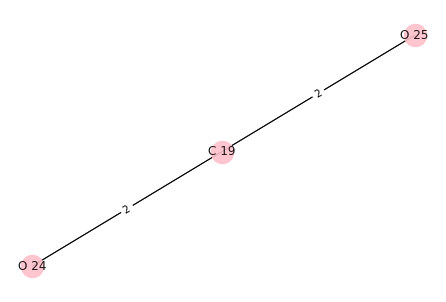

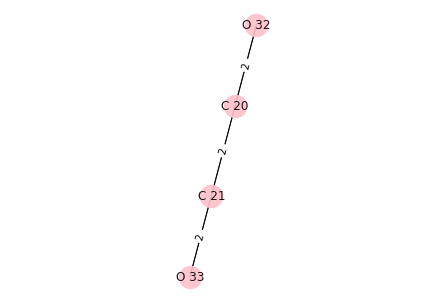

[{C 20, O 32, C 21, O 33}]
11
[{C 16, O 22, H 1, H 2}, {C 17, N 34, H 3}, {N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]
{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
7


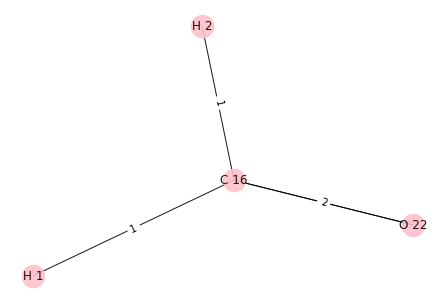

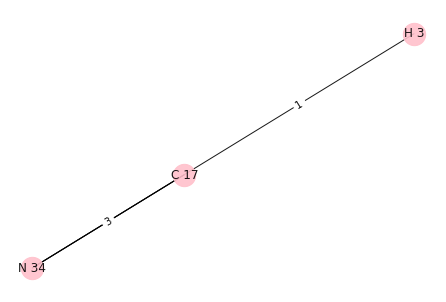

H 2
H 3
C 16 C 17


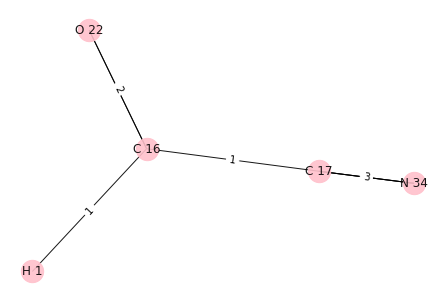

{C 17, O 22, H 1, C 16, N 34}
[C 17, N 34, O 22, C 16]
i: 0
Removing edge between: C 17 N 34
Adding edge between: C 17 H 2
H 2 0
O 22 0
H 1 0
C 17 0
N 34 1
C 16 0


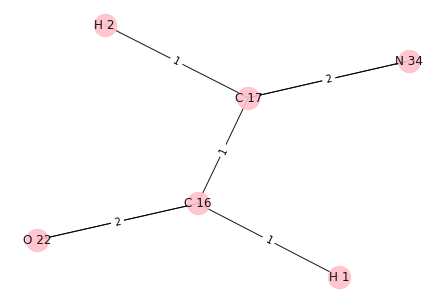

C 17 0
N 34 1
O 22 0
C 16 0
[N 34] H 3


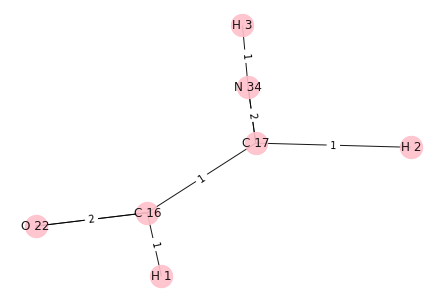

i: 1
Removing edge between: N 34 C 17
Adding edge between: N 34 H 2
H 2 0
O 22 0
H 1 0
C 17 1
N 34 0
C 16 0


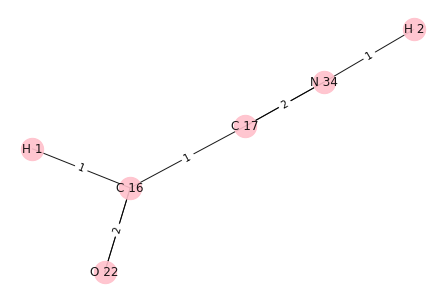

C 17 1
N 34 0
O 22 0
C 16 0
[C 17] H 3


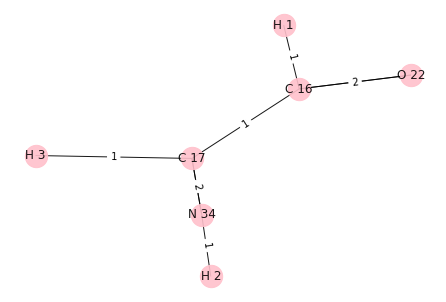

i: 2
Removing edge between: O 22 C 16
Adding edge between: O 22 H 2
N 34 0
O 22 0
H 2 0
C 17 0
H 1 0
C 16 1


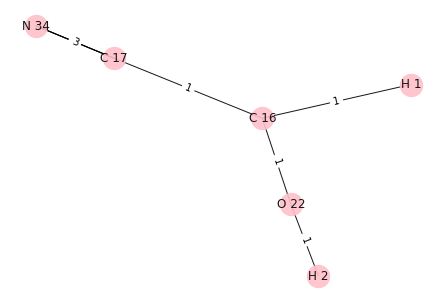

C 17 0
N 34 0
O 22 0
C 16 1
[C 16] H 3


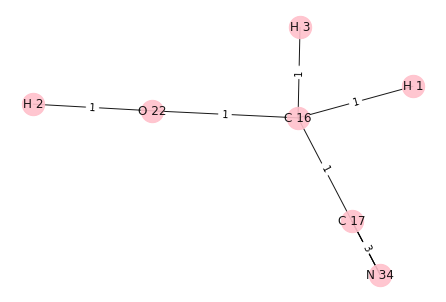

i: 3
Removing edge between: C 16 O 22
Adding edge between: C 16 H 2
C 17 0
N 34 0
H 2 0
O 22 1
C 16 0
H 1 0


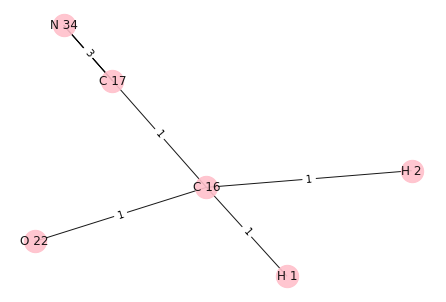

C 17 0
N 34 0
O 22 1
C 16 0
[O 22] H 3


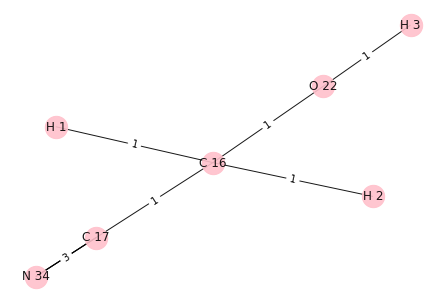

[{N 35, H 6, H 4, H 5}, {H 7, N 36, C 18, O 23}, {H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


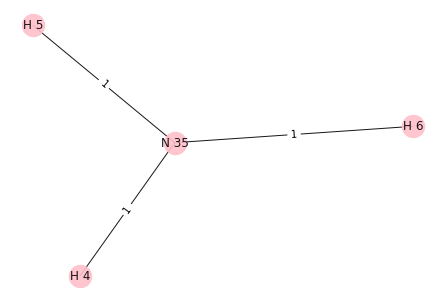

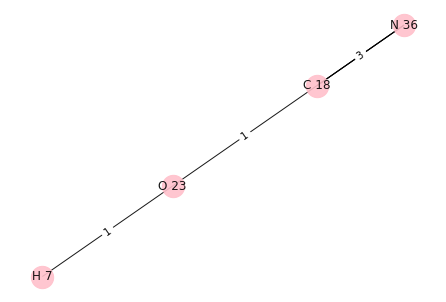

H 5
H 7
N 35 O 23


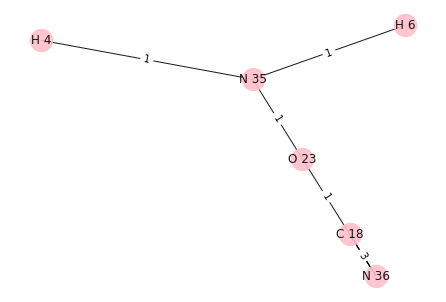

{O 23, H 4, H 6, C 18, N 36, N 35}
[O 23, C 18, N 36, N 35]
i: 0
Removing edge between: O 23 C 18
Adding edge between: O 23 H 5
O 23 0
H 4 0
H 5 0
N 35 0
H 6 0


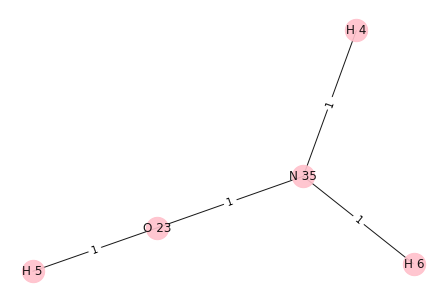

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


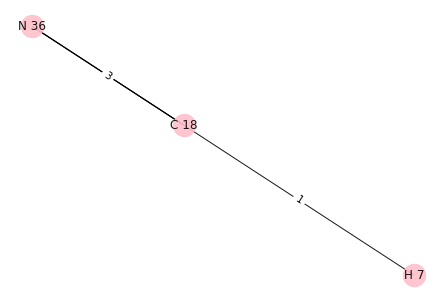

i: 1
Removing edge between: C 18 O 23
Adding edge between: C 18 H 5
C 18 0
H 5 0
N 36 0


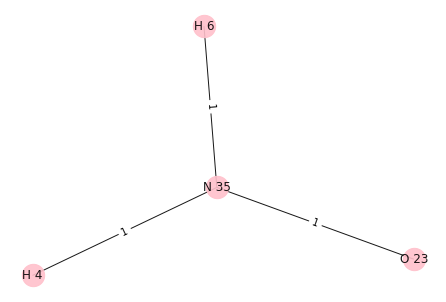

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


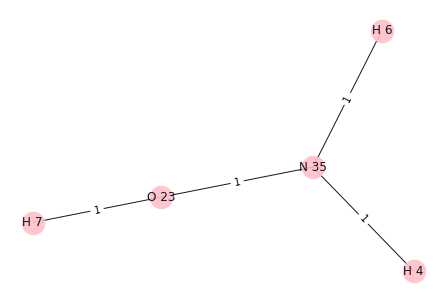

i: 2
Removing edge between: N 36 C 18
Adding edge between: N 36 H 5
O 23 0
H 4 0
H 6 0
C 18 1
H 5 0
N 36 0
N 35 0


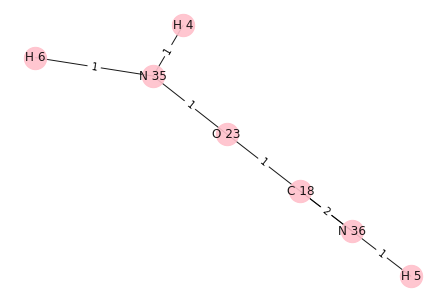

O 23 0
C 18 1
N 36 0
N 35 0
[C 18] H 7


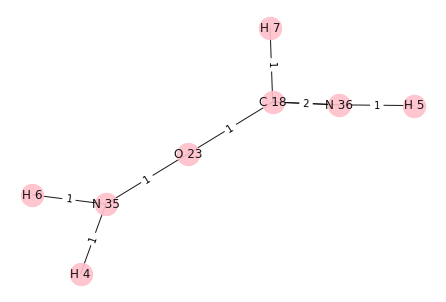

i: 3
Removing edge between: N 35 O 23
Adding edge between: N 35 H 5
N 35 0
H 6 0
H 5 0
H 4 0


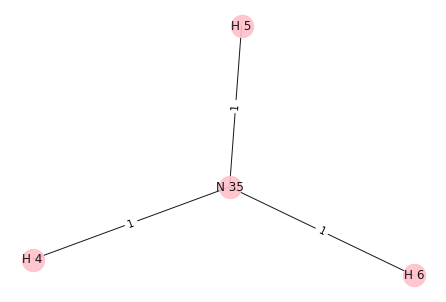

O 23 1
C 18 0
N 36 0
N 35 0
[O 23] H 7


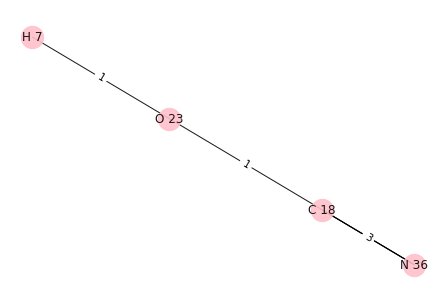

[{H 8, H 9, O 27, O 26}, {N 38, H 10, N 37, H 11}, {O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


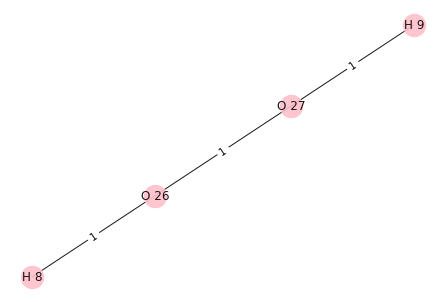

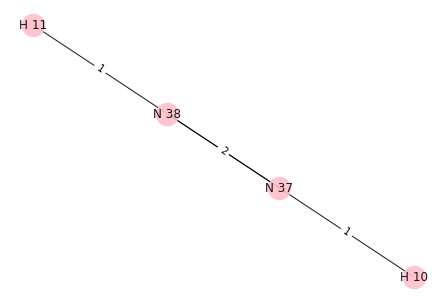

H 8
H 11
O 26 N 38


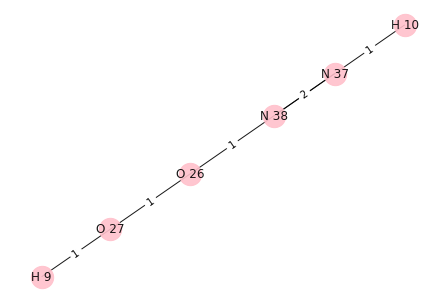

{O 26, N 38, O 27, H 9, H 10, N 37}
[O 26, N 38, O 27, N 37]
i: 0
Removing edge between: O 26 O 27
Adding edge between: O 26 H 8
O 26 0
H 8 0
N 38 0
H 10 0
N 37 0


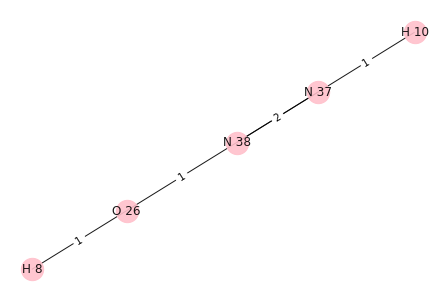

O 26 0
N 38 0
O 27 1
N 37 0
[O 27] H 11


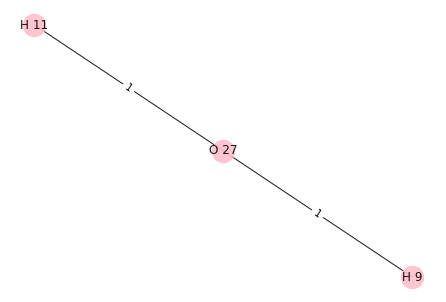

i: 1
Removing edge between: N 38 O 26
Adding edge between: N 38 H 8
H 8 0
N 38 0
N 37 0
H 10 0


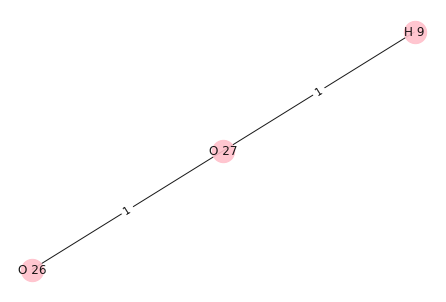

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 11


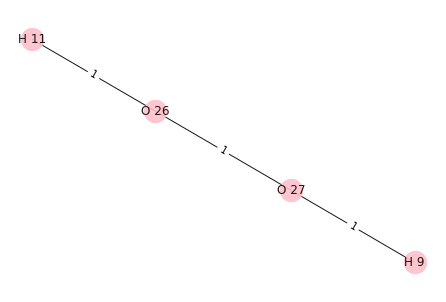

i: 2
Removing edge between: O 27 O 26
Adding edge between: O 27 H 8
H 8 0
H 9 0
O 27 0


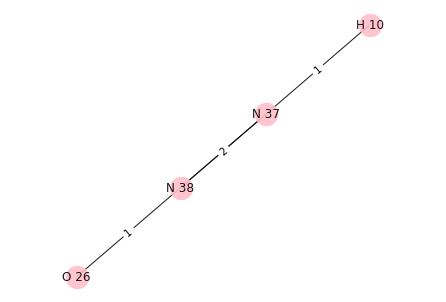

O 26 1
N 38 0
O 27 0
N 37 0
[O 26] H 11


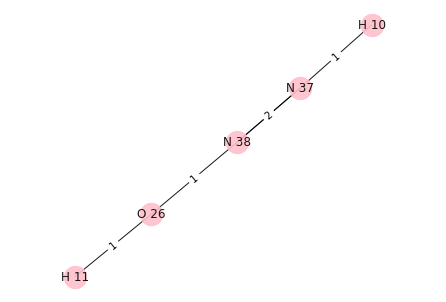

i: 3
Removing edge between: N 37 N 38
Adding edge between: N 37 H 8
O 26 0
H 8 0
N 38 1
O 27 0
H 9 0
H 10 0
N 37 0


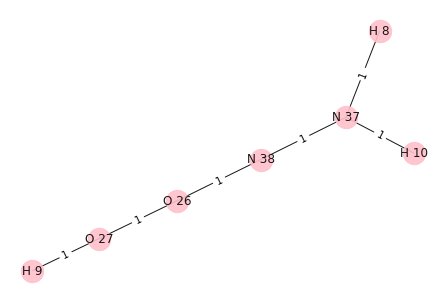

O 26 0
N 38 1
O 27 0
N 37 0
[N 38] H 11


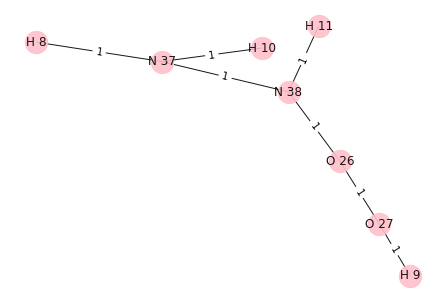

[{O 28, H 12, N 39}, {N 40, O 29, H 13, O 30}, {O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


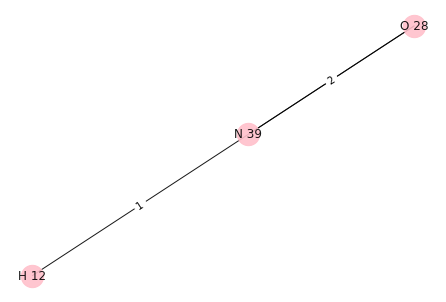

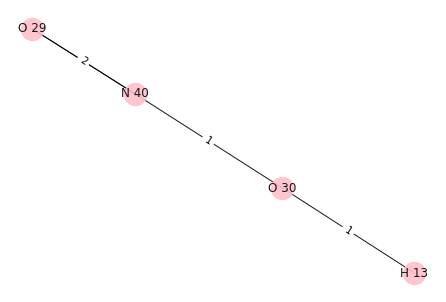

H 12
H 13
N 39 O 30


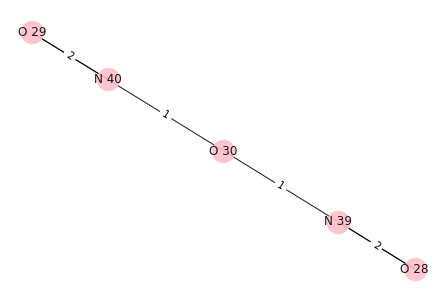

{O 30, N 40, O 28, N 39, O 29}
[O 30, N 40, N 39, O 28, O 29]
i: 0
Removing edge between: O 30 N 40
Adding edge between: O 30 H 12
N 39 0
O 28 0
H 12 0
O 30 0


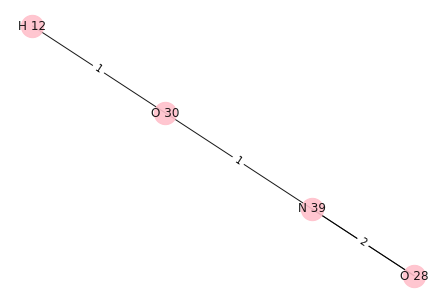

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


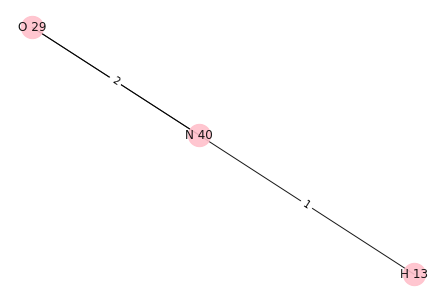

i: 1
Removing edge between: N 40 O 30
Adding edge between: N 40 H 12
O 29 0
H 12 0
N 40 0


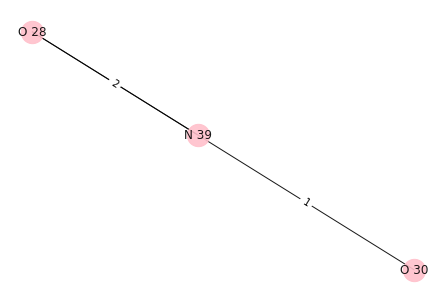

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


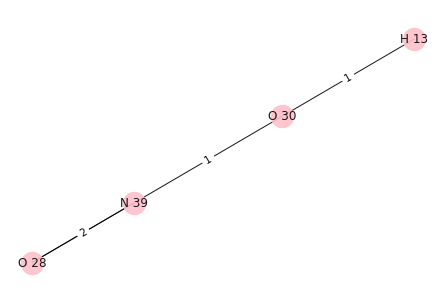

i: 2
Removing edge between: N 39 O 30
Adding edge between: N 39 H 12
O 28 0
H 12 0
N 39 0


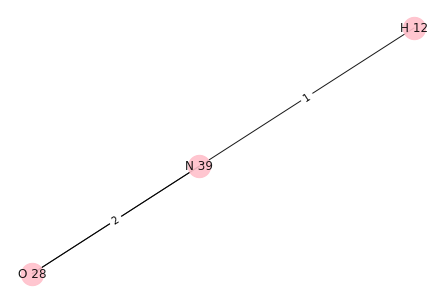

O 30 1
N 40 0
N 39 0
O 28 0
O 29 0
[O 30] H 13


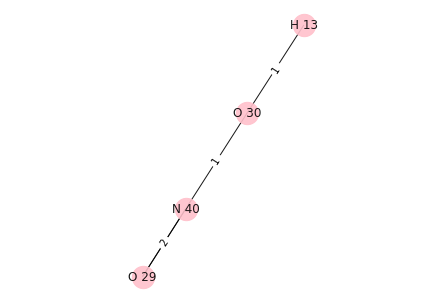

i: 3
Removing edge between: O 28 N 39
Adding edge between: O 28 H 12
O 29 0
O 30 0
H 12 0
O 28 0
N 39 1
N 40 0


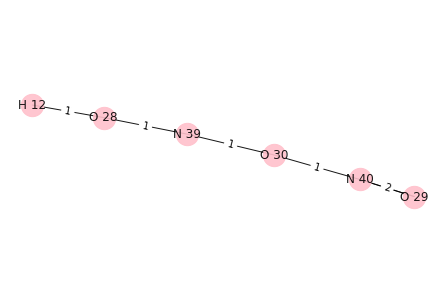

O 30 0
N 40 0
N 39 1
O 28 0
O 29 0
[N 39] H 13


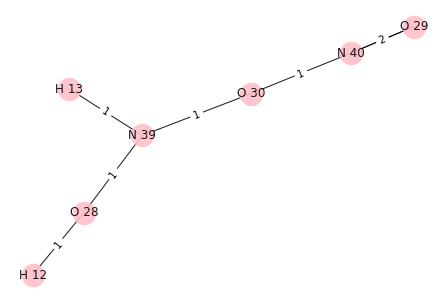

i: 4
Removing edge between: O 29 N 40
Adding edge between: O 29 H 12
O 30 0
H 12 0
N 40 1
N 39 0
O 28 0
O 29 0


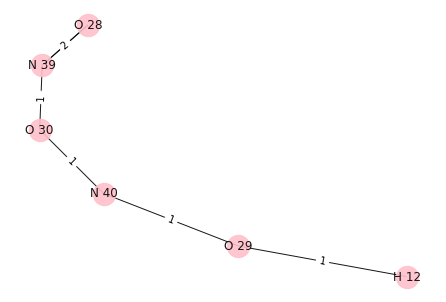

O 30 0
N 40 1
N 39 0
O 28 0
O 29 0
[N 40] H 13


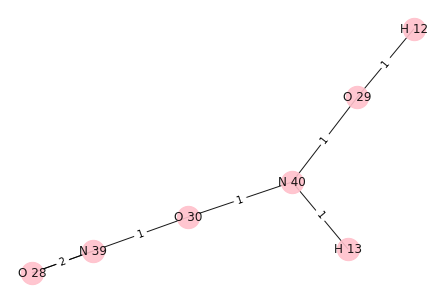

[{O 31, H 14, H 15}, {O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


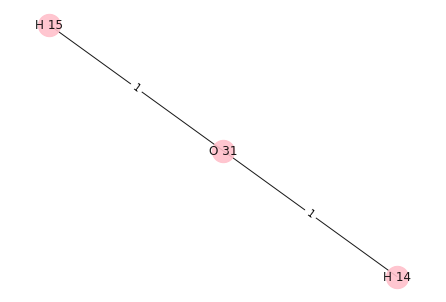

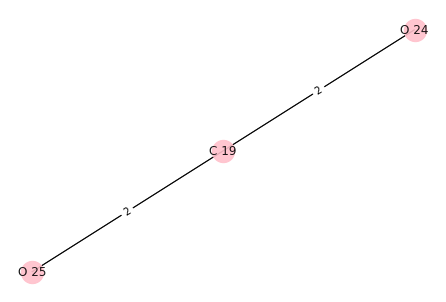

[{O 25, C 19, O 24}, {C 20, O 32, C 21, O 33}]


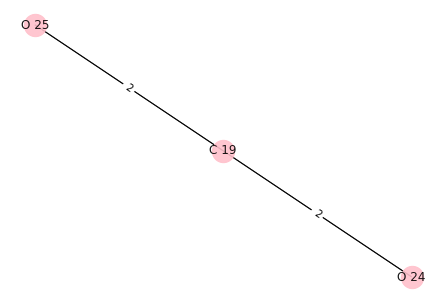

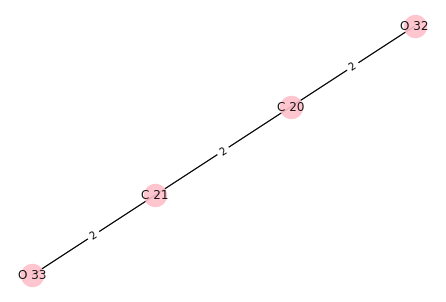

[{C 20, O 32, C 21, O 33}]


In [11]:
trails = 10
n = len(list(nx.connected_components(N)))
final_dict = {}
order = [i for i in range(n)]
for i in range(trails):
    final_dict.update(simulated_annealing_bonds(N, order))

In [12]:
for i in nx.connected_components(N):
    print(i)

{C 16, O 22, H 1, H 2}
{C 17, N 34, H 3}
{N 35, H 6, H 4, H 5}
{H 7, N 36, C 18, O 23}
{H 8, H 9, O 27, O 26}
{N 38, H 10, N 37, H 11}
{O 28, H 12, N 39}
{N 40, O 29, H 13, O 30}
{O 31, H 14, H 15}
{O 25, C 19, O 24}
{C 20, O 32, C 21, O 33}


In [13]:
new_final = final_dict.copy()
for i in final_dict:
    if final_dict[i] > 10:
        new_final.pop(i)

In [14]:
len(new_final)

125

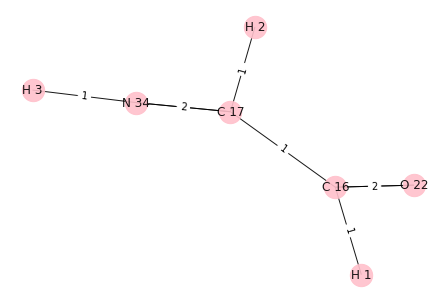

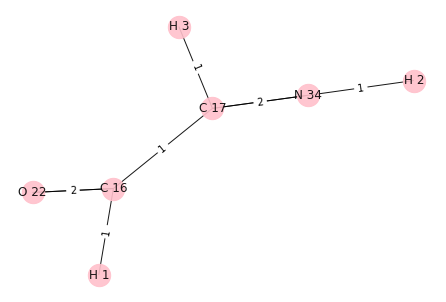

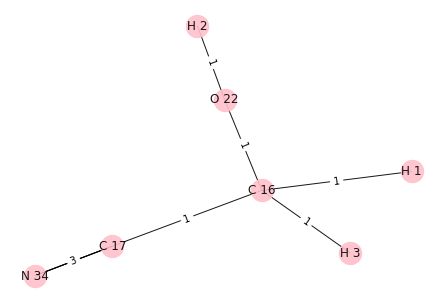

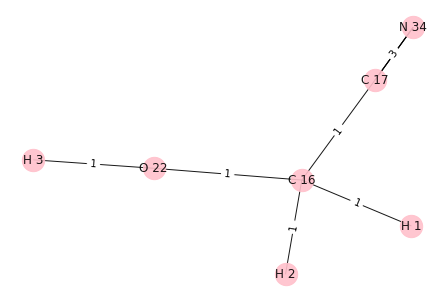

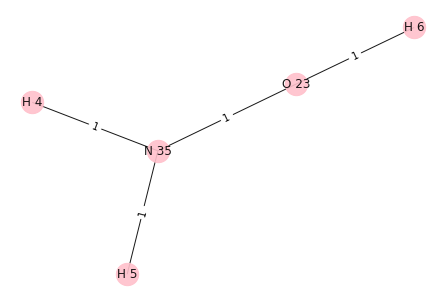

...

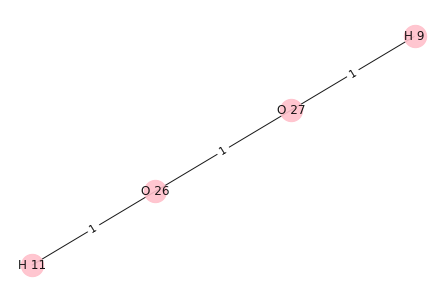

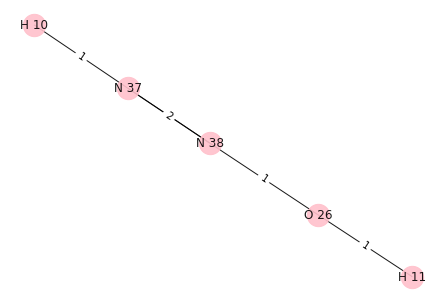

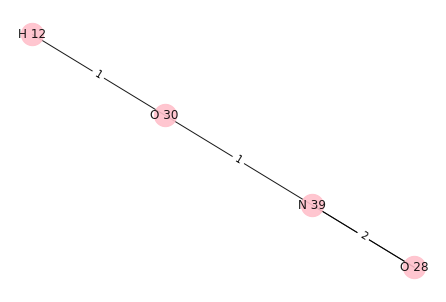

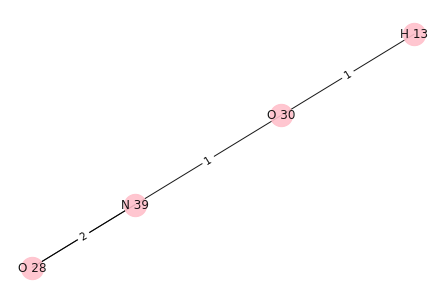

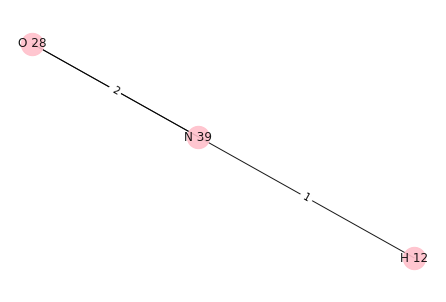

In [15]:
i = 0
for compound in new_final:
    nodes = nx.nodes(compound)
    plot_fig(compound)
    if i == 0:
        essential_compound = compound
    i += 1

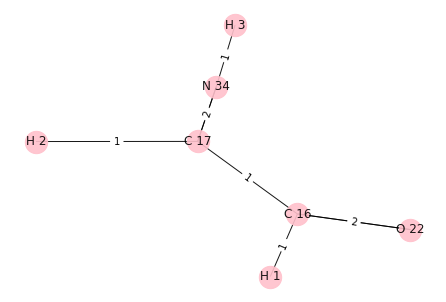

In [16]:
plot_fig(essential_compound)

In [17]:
nodes = nx.nodes(essential_compound)
oxygens = [i for i in nodes if (i._name.split()[0]=="O")]
OHs = []
for i in oxygens:
    for j in essential_compound[i]:
        if j._name.split()[0]=="H": 
            OHs.append((i,j))

for i,j in enumerate(nx.connected_components(G_new)):
    if i == 2:
        ammonia = G_new.subgraph(list(j))

2
[{N 35, H 6, H 4, H 5}, {C 17, O 22, H 2, H 1, H 3, C 16, N 34}]
{N 35, H 6, H 4, H 5}
{C 17, O 22, H 2, H 1, H 3, C 16, N 34}
11


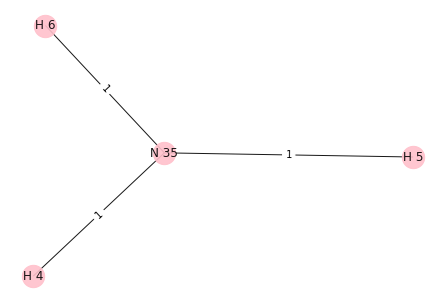

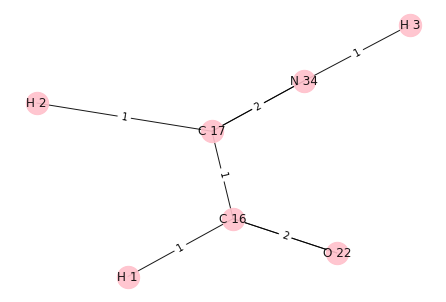

H 4
H 3
N 35 N 34


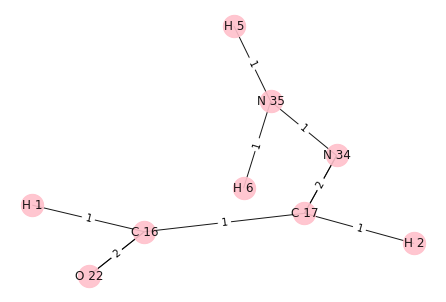

{C 17, H 2, O 22, H 6, H 5, H 1, N 35, N 34, C 16}
[O 22, N 35, C 17, N 34, C 16]
i: 0
Removing edge between: O 22 C 16
Adding edge between: O 22 H 4
N 34 0
O 22 0
H 4 0
H 2 0
H 6 0
H 5 0
N 35 0
C 17 0
H 1 0
C 16 1


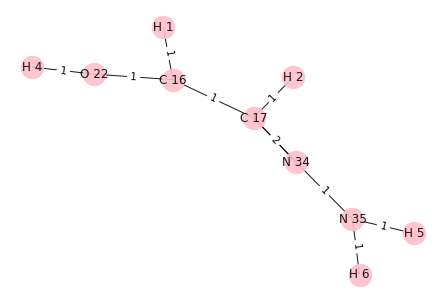

O 22 0
N 35 0
C 17 0
N 34 0
C 16 1
[C 16] H 3


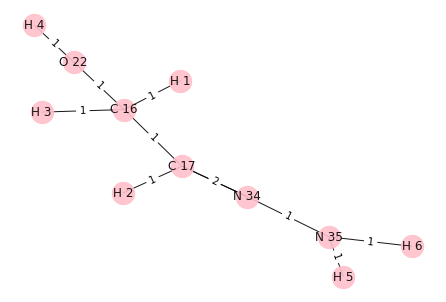

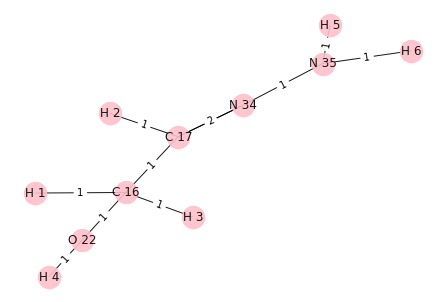

Enter G value of [C 17, H 2, O 22, H 4, H 6, H 5, H 1, H 3, N 35, N 34, C 16]: -121.65
i: 1
Removing edge between: N 35 N 34
Adding edge between: N 35 H 4
N 35 0
H 6 0
H 4 0
H 5 0


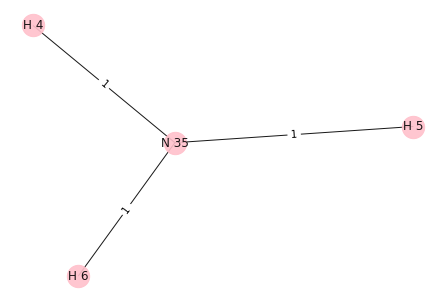

O 22 0
N 35 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


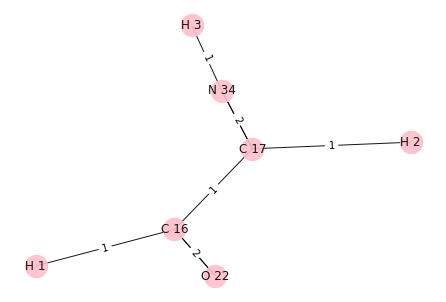

i: 2
Removing edge between: C 17 N 34
Adding edge between: C 17 H 4
H 4 0
H 2 0
O 22 0
H 6 0
H 5 0
N 35 0
H 1 0
C 17 0
N 34 1
C 16 0


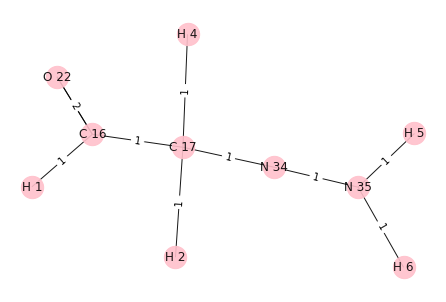

O 22 0
N 35 0
C 17 0
N 34 1
C 16 0
[N 34] H 3


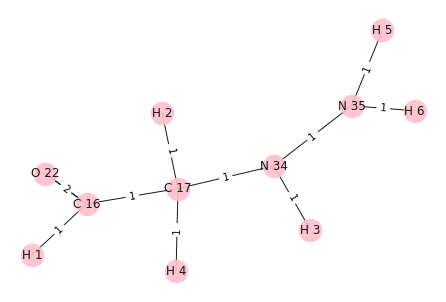

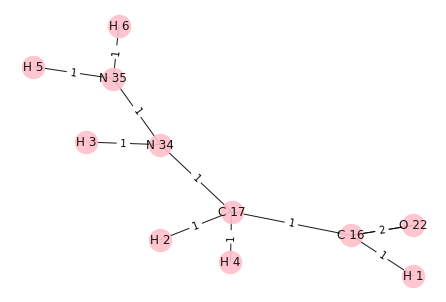

Enter G value of [C 17, H 4, H 2, O 22, H 6, H 5, H 1, H 3, N 35, N 34, C 16]: -98.12
i: 3
Removing edge between: N 34 N 35
Adding edge between: N 34 H 4
H 4 0
H 2 0
O 22 0
H 1 0
C 17 0
N 34 0
C 16 0


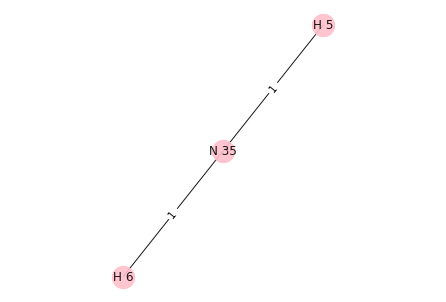

O 22 0
N 35 1
C 17 0
N 34 0
C 16 0
[N 35] H 3


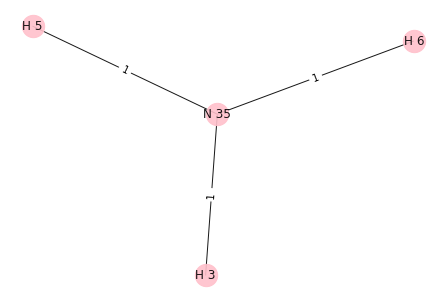

i: 4
Removing edge between: C 16 O 22
Adding edge between: C 16 H 4
C 17 0
N 34 0
H 4 0
O 22 1
H 2 0
H 6 0
H 5 0
N 35 0
C 16 0
H 1 0


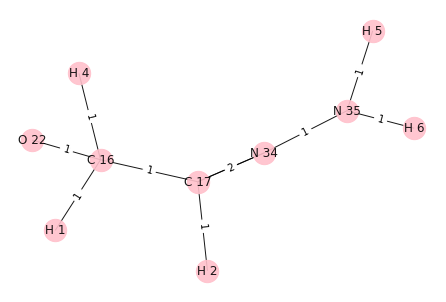

O 22 1
N 35 0
C 17 0
N 34 0
C 16 0
[O 22] H 3


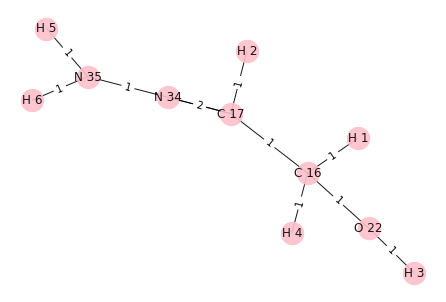

[]


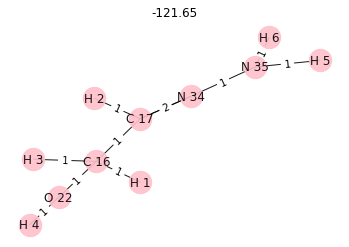

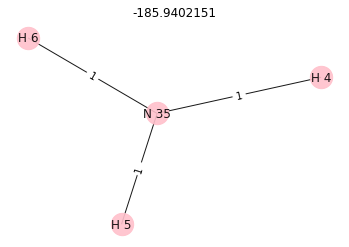

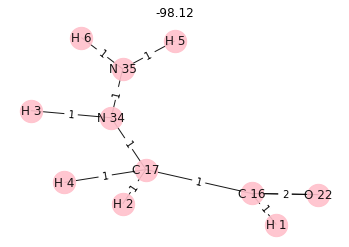

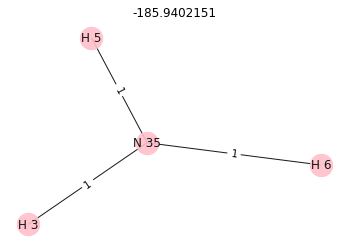

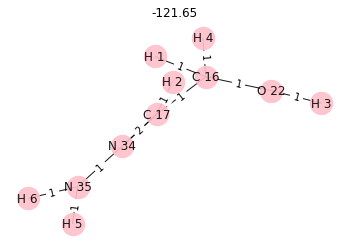

In [18]:
netG = nx.compose(ammonia, essential_compound)
dict_vals = simulated_annealing_bonds(netG)

for i in dict_vals:
#     print(type(i))
    plot_fig(i, dict_vals[i])

In [19]:
cyanides = {}
for compound in dict_vals:
    cyanides[compound] = []
    carbons = [i for i in nx.nodes(compound) if i._name.split()[0]=="C"]
    for i in carbons:
        for j in compound[i]:
            if j._name.split()[0]=="N" and compound[i][j][0]['number']==3:
                cyanides[compound].append((i,j))
                
print(cyanides)

{<networkx.classes.multigraph.MultiGraph object at 0x0000019F8164B6C8>: [], <networkx.classes.multigraph.MultiGraph object at 0x0000019FFEC77A48>: [], <networkx.classes.multigraph.MultiGraph object at 0x0000019F8030C708>: [], <networkx.classes.multigraph.MultiGraph object at 0x0000019FFE56ABC8>: [], <networkx.classes.multigraph.MultiGraph object at 0x0000019F817122C8>: []}


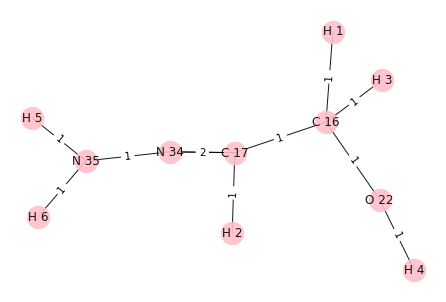

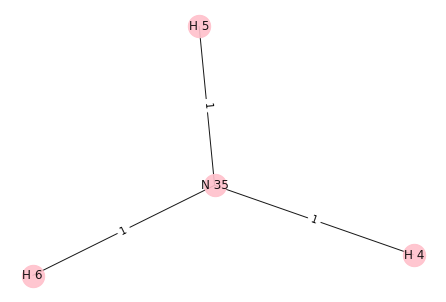

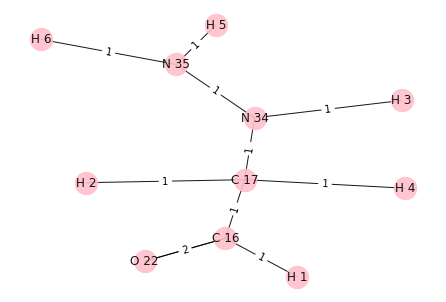

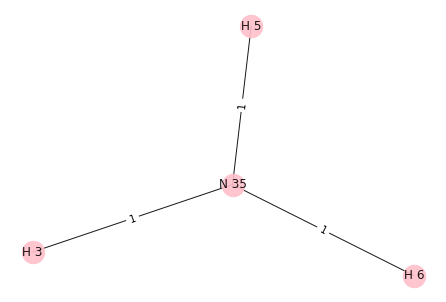

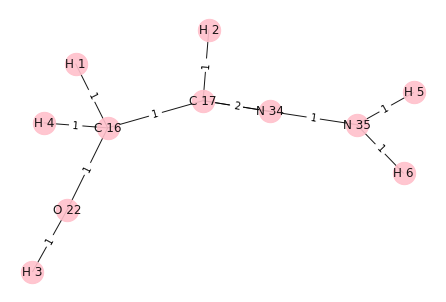

In [20]:
extra_H = [Compound("H", i) for i in range(100,110)]
extra_O = [Compound("O", i) for i in range(100,120)]

oidx = 0
hidx = 0

changed_graph = {}
for compound in dict_vals:
    flag = False
    plot_fig(compound)
    for cn in cyanides[compound]:
        if cn[0] in nx.nodes(compound):
            flag = True
            break
    if flag == True:
        print("flag == True")
        g_val = dict_vals[compound]
        compound = nx.MultiGraph(compound)
        neigh = compound[cn[0]]
        non_n_neigh = [i for i in neigh if (i._name.split()[0]!="N")]
        
        for time in range(3):
            compound.remove_edge(cn[1], cn[0])
        
        for time in range(2):
            compound.add_edge(cn[0], extra_O[oidx])
        oidx += 1
        
        compound.add_edge(cn[0], extra_O[oidx])
        compound.add_edge(extra_O[oidx], extra_H[hidx])
        hidx += 1
        oidx += 1
        
        compound.remove_node(cn[1])
        plot_fig(compound)
        changed_graph[compound] = g_val

In [21]:
for compound in changed_graph:
    plot_fig(compound)

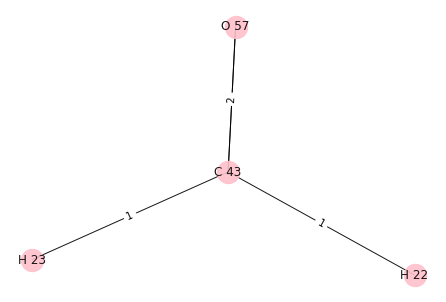

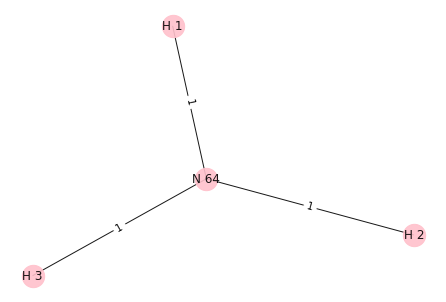

{<networkx.classes.multigraph.MultiGraph object at 0x0000019F801211C8>: -269.52, <networkx.classes.multigraph.MultiGraph object at 0x0000019F8009AB48>: -185.9402151}


In [22]:
d = {}
d[A] = -269.52
d[B] = -185.9402151
for i in d:
    plot_fig(i)
    
print(d)

In [23]:
aldehyde = {}
CH = ["C", "H"]
check = 0
for compound in d:
    aldehyde[compound] = []
    carbons = [i for i in nx.nodes(compound) if i._name.split()[0]=="C"]
    for i in carbons:
        nei = [str(i)]
        for j in compound[i]:
            if j._name.split()[0]=="O" and compound[i][j][0]['number']==2:
                neigh = list(compound.neighbors(i))
#                 print(neigh)
                for times in range(len(neigh)):
                    nei.append(str(neigh[times]))
#                 print(nei)
                
                aldehyde[compound].append(nei)
                
print(aldehyde)

[H 22, O 57, H 23]
['C 43', 'H 22', 'O 57', 'H 23']
{<networkx.classes.multigraph.MultiGraph object at 0x0000019F801211C8>: [['C 43', 'H 22', 'O 57', 'H 23']], <networkx.classes.multigraph.MultiGraph object at 0x0000019F8009AB48>: []}


In [24]:
ketone = {}
check = 0
for compound in d:
    ketone[compound] = []
    carbons = [i for i in nx.nodes(compound) if i._name.split()[0]=="C"]
    for i in carbons:
        neigh = str(i)
        for j in compound[i]:
            if j._name.split()[0]=="O" and compound[i][j][0]['number']==2:
                neigh = list(compound.neighbors(i))
                for times in range(2):
                    neigh_name = neigh[times]._name.split()[0]
                    if neigh_name == "C":
                        check = 1
                    else:
                        check = 0
                if check ==1:
                    ketone[compound].append(neigh)
                
print(ketone)

{<networkx.classes.multigraph.MultiGraph object at 0x0000019F801211C8>: [], <networkx.classes.multigraph.MultiGraph object at 0x0000019F8009AB48>: []}


In [25]:
amine = {}

for compound in d:
    amine[compound] = []
    nitrogens = [i for i in nx.nodes(compound) if i._name.split()[0]=="N"]
    for i in nitrogens:
        neigh = [str(i)]
        nei = []
        for j in compound[i]:
            neigh.append(j._name)
            nei.append(j._name.split()[0])
        if nei.count("H")>=2:
#             print(cnt, i, neigh, '\n')
            amine[compound].append(neigh)
                
print(amine)

{<networkx.classes.multigraph.MultiGraph object at 0x0000019F801211C8>: [], <networkx.classes.multigraph.MultiGraph object at 0x0000019F8009AB48>: [['N 64', 'H 1', 'H 2', 'H 3']]}


In [31]:
# extra_H = [Compound("H", i) for i in range(100,140)]
# extra_O = [Compound("O", i) for i in range(100,120)]
# extra_C = [Compound("C", i) for i in range(100,120)]
# oidx = 0
# hidx = 0
# cidx = 0
# ################################
# for compound in d:
#     present = False
    
#     print(nx.nodes(compound))
#     for am in amine[compound]:
#         print(am[0])
#         if am[0] in nx.nodes(compound):
#             present = True
#     print(present)
    
#     for i in range(len(am)):
#         if am[i][0]=='H':
#             r = i
#             break
#     compound.remove_edge(am[0],am[r])
#     compound.remove_node(am[r])
    
#     Nit = compound.copy()
#     n = am[0]
# #Nit has H-N-R3
# ################################
# for compound in d:
#     present = False
    
#     print(nx.nodes(compound))
#     for al in aldehyde[compound]:
#         print(al)
#         if al[0] in nx.nodes(compound):
#             present = True
#     print(present)
    
#     for i in range(len(al)):
#         if al[i][0]=='O':
#             r = i
#             break
#     for times in range(2):
#         compound.remove_edge(al[0],al[r])
#         compound.remove_node(al[r])
        
#     Coo = compound.copy()
#     c = al[0]
# #Coo has R1-C-R2
# ################################
# fin = nx.MultiGraph()
# fin = nx.compose(Nit,Coo)
# fin.add_edge(n,c)
# #Now in has R3-NH-C-(R1,R2)
# #Adding COOH

# fin.add_edge(c,extra_C[cidx])

# for times in range(2):
#     fin.add_edge(extra_C[cidx],extra_O[oidx])
# oidx+=1

# fin.add_edge(extra_O[oidx],extra_C[cidx])
# fin.add_edge(extra_O[oidx],extra_H[hidx])

In [30]:
extra_H = [Compound("H", i) for i in range(100,140)]
extra_O = [Compound("O", i) for i in range(100,120)]
extra_C = [Compound("C", i) for i in range(100,120)]
oidx = 0
hidx = 0
cidx = 0
################################
for compound in d:
    present = False
    
    print(nx.nodes(compound))
    for am in amine[compound]:
        print(am[0])
        if am[0] in nx.nodes(compound):
            present = True
    print(present)
    
    if present == True:
        for i in range(len(am)):
            if am[i][0]=='H':
                r = i
                break
        compound.remove_edge(am[0],am[r])
        compound.remove_node(am[r])
    
        Nit = compound.copy()
        n = am[0]
        #Nit has H-N-R3
        ################################
    
        for comp in d:
            pres = False
    
            print(nx.nodes(comp))
            for al in aldehyde[comp]:
                print(al[0])
                if al[0] in nx.nodes(comp):
                    pres = True
            print(pres)
        
            if pres == True:
                for i in range(len(al)):
                    if al[i][0]=='O':
                        r = i
                        break
                for times in range(2):
                    comp.remove_edge(al[0],al[r])
                    comp.remove_node(al[r])
                
                Coo = comp.copy()
                c = al[0]
                #Coo has R1-C-R2
                ################################
                
                fin = nx.MultiGraph()
                fin = nx.compose(Nit,Coo)
                fin.add_edge(n,c)
                #Now in has R3-NH-C-(R1,R2)
                #Adding COOH
                
                fin.add_edge(c,extra_C[cidx])
                
                for times in range(2):
                    fin.add_edge(extra_C[cidx],extra_O[oidx])
                oidx+=1
                
                fin.add_edge(extra_O[oidx],extra_C[cidx])
                fin.add_edge(extra_O[oidx],extra_H[hidx])
                cidx+=1
                hidx+=1

[O 57, H 22, H 23, C 43]
False
[N 64, H 3, H 1, H 2]
N 64
False
